# Librerías

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from   datetime import timedelta
import datetime
import matplotlib as mpl
import glob
import os
from matplotlib import cm
import matplotlib.dates as mdates
from matplotlib import font_manager as fm
from matplotlib.ticker import ScalarFormatter, FormatStrFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
import mat73
from pytides2.tide import Tide
import pytides2.constituent  as cons
import pytides2.astro as astro
from pyproj import Proj
import warnings
import matplotlib.pylab as pl
from scipy import signal
warnings.filterwarnings('ignore')
plt.style.use('default')
import seawater as sw
import re

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cf
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# Personalizar graficas
plt.style.use("default")
mpl.rcParams['xtick.labelsize']=13
mpl.rcParams['ytick.labelsize']=13
mpl.rcParams['font.sans-serif'] = "Century Gothic"
mpl.rcParams['font.family'] = "Century Gothic"
mpl.rcParams['font.weight'] = 'normal'
def fig_params(ax):
    ax.grid()    
    ax.spines['left'].set_color('gray')
    ax.spines['right'].set_color('gray')
    ax.spines['bottom'].set_color('gray')
    ax.spines['top'].set_color('gray')
    ax.tick_params('y', colors='tab:gray')
    ax.tick_params('x', colors='tab:gray')
    for label in ax.get_yticklabels():
        label.set_color('k')
        label.set_size(13)
    for label in ax.get_xticklabels():
        label.set_color('k')
        label.set_size(13)


import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [37]:
def time_matlab (vec_time:float):
    """
    Función para obtener los tiempos en formato datetime 
    ----------------------------------------------------
    Input: 
    - vec_time: vector de tiempos en formato matlab
    ----------------------------------------------------
    - time: lista con los tiempos en formato datetime
    """
    time = []
    for time_i in vec_time:
        py_time = datetime.datetime.fromordinal(int(time_i)) + datetime.timedelta(days=time_i%1) - datetime.timedelta(days = 366)
        py_time = py_time +datetime.timedelta(microseconds=3)
        py_time = datetime.datetime(py_time.year, py_time.month, py_time.day, py_time.hour)
        time.append(py_time)
    return time

In [38]:
def load_mat_files(Test, file_name, Folder_variable):
    """
    INPUTS: 
    - Test: # Name of test folder (ej: TESTx)
    - file_name: Name of file to upload
    - Folder_variable: Name of variable of data (
        - Velocity
        - Water_level
        - Wave
        - Salinity_Temperature
    )
    ------------------------------------------------------------------------
    OUTPUT:
    - Dictionary of data
    """
    path = 'G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\CODIGOS'
    prop_mat_data = mat73.loadmat(path+'\\'+Test+'\\'+Folder_variable+'\\'+file_name)
    dic_data = prop_mat_data['data']
    return dic_data

def angulo_norte(x,y):
    if x > 0 and y > 0:
        theta = 90 - (np.arctan(abs(y/x))*(180/np.pi))
    elif x < 0 and y > 0:
        theta = 270 + (np.arctan(abs(y/x))*(180/np.pi))
    elif x < 0 and y < 0:
        theta = 270 - (np.arctan(abs(y/x))*(180/np.pi))
    else:
        theta = 90 + (np.arctan(abs(y/x))*(180/np.pi))
    return theta

# Funciones
def proj_ZONE17 (lon, lat):
    """
    Función para cambiar las proyecciones de las coordenadas:
    -----------------------------------------------------------
    Input:
    lon, lat
    ----------------------------------------------------------
    Output:
    UTMX, UTMY
    """
    myProj = Proj("+proj=utm +zone=17 +ellps=WGS84 +datum=WGS84")
    UTMx, UTMy = myProj(lon, lat)
    return UTMx,UTMy

def min_ind (value, vector, delta):
    """Función para encontrar la mínima diferencia entre dos celdas
    Input: 
    - Value: valor a encontrar 
    - Vector: vectores donde quiere encontrar dicho valor
    - delta: radio para encontrar ese valor 
    ----------------------------------------------------------------------
    Output: 
    - Ind: indices donde mayor se aproxima el valor buscado a los vectores
    """
    indices = np.where((vector > value-(delta)) & (vector < value+(delta)))[0]
    for i in range(len(indices)):
        try :
            if np.abs(vector[indices[i]] - value) < np.abs(vector[indices[i+1]] - value):
                ind = indices[i]
            else:
                ind = indices[i+1]
        except:
            print('**********ERROR************')
    
    print('Indice:',ind,', Valor:', vector[ind], ', Valor real:', value)
    return ind

def direction (dfu:pd.DataFrame, dfv:pd.DataFrame):
    """_summary_

    Parameters
    ----------
    dfu : pd.DataFrame
        Data frame de la componente X (velocidad en u)
    dfv : pd.DataFrame
        Data frame de la componente Y (velocidad en v)

    Returns
    -------
    _type_
        _description_
    """
    dic_direc = {}
    for i in range(dfu.shape[1]):
        direc_flow = np.zeros(dfu.shape[0])
        for j in range(dfu.shape[0]):
            direc_flow[j] = angulo_norte(dfu.iloc[j,i], dfv.iloc[j,i])
        dic_direc.update({dfu.columns[i]:direc_flow})
    df_direc = pd.DataFrame(data = dic_direc, index = dfu.index)
    return df_direc

# FIELD DATA 
- Currents
    - Velocity profiles
    - time series
    - time series profiles
- Water level
- Salinity and temperature profiles
- Waves
    - Pick period
    - Significant wave high

# MODEL DATA

*DELFT 3D*
- Velocity:
    - Currents (velocity components)
    - Profiles
    - time series profiles
- Waves: 
    - Significant wave Hight 
    - Peak periodo
    - Direction
- Temperature and Salinity
    - Profiles
    - Time series
- Water level


In [39]:
class field_data: 
    """
    This class allow to generate dataframe of data field for each variable
    # Field data
    - Currents
        - Velocity profiles
        - time series
        - time series profiles
        - water level (tide)
    - Salinity and temperature profiles
    - Waves
        - Pick period
        - Significant wave high
    """
    def __init__(self, sensor_type):
        """
        Argumentos:
        paths: rutas de los archivos de las diferentes variables
        sensor_type: Tipo de sensor awac (AW600/AW1000)
        """
        self.sensor_type = sensor_type
    

    def velocity(self, path, depth_sensor, sensor_head_to_level, file_name1, file_name2, head_free):
        """
        This function return velocity components, velocity magnitude, and
        velocity direction.
        ---------------------------------------------------------------
        Input:
        ------
        - path: is the path to read velocity data
        - depth: is the depth that sensor was deployed
        - Sensor_head_to_level: water head over sensor until water level
        - head_free: free higth where sensor don't record data 
        ------------------------------------------------------------------
        Return:
        ------
        df_awu: dataframe of u velocity component
        df_awv: dataframe of v velocity component
        """ 
        depth = depth_sensor + (sensor_head_to_level+head_free)*-1
        r_v1 = path+file_name1
        r_v2 = path+file_name2
        List_namesv1 = []
        List_namesv2 = []
        if self.sensor_type == 'AW600': 
            for i in range (0,30):
                if i < 16:
            #         print(i+1, depth[i])
                    names_v1 = str(int(depth[i]))+'.0 m'
                    names_v2 = str(int(depth[i]))+'.0 m'
                else:
                    names_v1 = str(i+1)+'.0 m'
                    names_v2 = str(i+1)+'.0 m'
                List_namesv1.append(names_v1)
                List_namesv2.append(names_v2)
        else: 
            for i in range (0,20):
                if i < 15:
            #         print(i+1, depth[i])
                    names_v1 = str(round(depth[i],2))+' m'
                    names_v2 = str(round(depth[i],2))+' m'
                else:
                    names_v1 = str(i+1)+' m'
                    names_v2 = str(i+1)+' m'
                List_namesv1.append(names_v1)
                List_namesv2.append(names_v2)
        df_awu=pd.read_csv(r_v1,delimiter='\s+',encoding = "ISO-8859-1",names = List_namesv1)
        df_awv=pd.read_csv(r_v2,delimiter='\s+',encoding = "ISO-8859-1",names = List_namesv2)

        #-----------tiempo------------------------------
        escala_temporal = 30                 # resolución temporal en minutos
        if self.sensor_type == 'AW600':
            for i in range (17,31):
                df_awu = df_awu.drop([str(i)+'.0 m'], axis = 1)
                df_awv = df_awv.drop([str(i)+'.0 m'], axis = 1)
            date_ini = datetime.datetime(2018,5,5,8,0)      # Incio de almacenamiento de datos de AWAC
            date_fin = datetime.datetime(2018,5,10,17,30)    # Fin de almacenamiento de datos de AWAC
            minutos =int((date_fin-date_ini).days*24 + (date_fin-date_ini).seconds/3600)*60+escala_temporal  

        else:
            for i in range (16,21):
                df_awu = df_awu.drop([str(i)+' m'], axis = 1)
                df_awv = df_awv.drop([str(i)+' m'], axis = 1)
            date_ini = datetime.datetime(2018,5,5,8,0)      # Incio de almacenamiento de datos de AWAC
            date_fin = datetime.datetime(2018,5,10,15,30)    # Fin de almacenamiento de datos de AWAC
            minutos =int((date_fin-date_ini).days*24 + (date_fin-date_ini).seconds/3600)*60+(escala_temporal)  
        df_awu = df_awu.reset_index(drop=True)
        df_awv = df_awv.reset_index(drop=True)
        time_flow = np.array([date_ini + timedelta(minutes=m) for m in range(0,int(minutos),escala_temporal)]) 
        print(df_awv.shape, time_flow.shape)
        df_awu = df_awu.set_index(time_flow)
        df_awv = df_awv.set_index(time_flow)
        return df_awu, df_awv

    def water_level(self, path:str, name_file:str, ini_date:datetime.datetime, end_date:datetime.datetime):
        func_date = lambda x: datetime.datetime.strptime(x, "%Y %m %d %H %M")
        df_press = pd.read_csv(f'{path}\{name_file}',delimiter='\s+',encoding = "ISO-8859-1", usecols=[0,1,2,3,4,13], 
                               names=["Month","Day","Year","Hour",'Minute','Pressure'], 
                                parse_dates={'Time':['Year','Month', 'Day', 'Hour', 'Minute']}, 
                                date_parser=func_date).set_index('Time')
        df_press = df_press[ini_date:end_date]
        df_press['waterlevel'] = df_press['Pressure'] - df_press['Pressure'].mean()
        return df_press[['waterlevel']]
    
    
    def waves (self, paths, samples, fecha_inicio, fecha_fin):
        """
        - sensor: str(Tipo de sensor que se usó) [AW600 -AW1000]
        - paths: Represent the group of paths files
        - Samples: Number of samples each sea state
        - fecha_inicio: fecha inicial de registro del sensor (datetime)
        - fecha_final: fecha final de registro del sesnor (datetime)
        - h_depth: profundad del punto de ubicación del sensor 
        - h_sensor: Altura del sensor medida desde el fondo
        - escala_temporal: cada cuntas horas se miden los registros
        -------------------------------------------------------------------
        Return: 
        Data Frame of presure sensor
        """

        Presion = np.zeros(len(paths)*samples)
        if self.sensor_type == 'AW600':
            time_df = np.zeros(shape = (len(paths)*samples), dtype='datetime64[s]')
            for i in range(len(paths)):
                fun_date_aw  = lambda x: datetime.datetime.strptime(x, "%Y %m %d %H %M %S.0")
                data_aw=pd.read_csv(paths[i],delimiter='\s+',encoding = "ISO-8859-1", usecols=[0,1,2,3,4,5,6],
                                    names=["Month","Day","Year","Hour",'Minute','Second','Pressure'],
                                     parse_dates={'Time':['Year','Month', 'Day', 'Hour', 'Minute', 'Second']}, 
                                     date_parser= fun_date_aw).set_index(['Time'])
                Presion[samples*i:samples*(i+1)] = data_aw.Pressure.values
                time_df[samples*i:samples*(i+1)] = data_aw.index
        elif self.sensor_type == 'AW1000':
            time_df = np.zeros(shape = (len(paths)*samples), dtype='datetime64[s]')
            for i in range(0,len(paths)):
                fun_date_aw = lambda x: datetime.datetime.strptime(x, "%Y %m %d %H %M %S.%f")
                data_aw =pd.read_csv(paths[i], delimiter='\s+', encoding = "ISO-8859-1", usecols=[0,1,2,3,4,5,6],
                                    names=["Month","Day","Year","Hour",'Minute','Second','Pressure'],
                                     parse_dates={'Time':['Year','Month', 'Day', 'Hour', 'Minute', 'Second']},
                                     date_parser= fun_date_aw).set_index(['Time'])
                Presion[samples*i:samples*(i+1)] = data_aw['Pressure'].values
                time_df[samples*i:samples*(i+1)] = data_aw.index
        df = pd.DataFrame(data=Presion,index= time_df,columns=["Depth"]) 
        df = df[fecha_inicio:fecha_fin]
        df['dtrend'] = signal.detrend(df["Depth"].values)
        hours = int((fecha_fin-fecha_inicio).days*24 + (fecha_fin-fecha_inicio).seconds/3600) # Horas de muestreo
        time_h = np.array([fecha_inicio + timedelta(hours=h) for h in range(0,hours,1)]) # Estado de mar de una hora
        return df , time_h


In [40]:
class model_data():
    """
    This class allow to generate dataframe of model data for each variable
    """
    def __init__(self, id_point, Test):
        """
        Argumentos:
        id_point: Nombre del punto de observacion
        Test: Name of directory of files ej (TESTx)
        """
        self.id_point = id_point
        self.Test = Test
    
    def load_mat_files(self, file_name, Folder_variable):
        """
        INPUTS: 
        - Test: # Name of test folder (ej: TESTx)
        - file_name: Name of file to upload
        - Folder_variable: Name of variable of data (
            - Velocity
            - Water_level
            - Wave
            - Salinity_Temperature
        )
        ------------------------------------------------------------------------
        OUTPUT:
        - Dictionary of data
        """
        Test = self.Test
        path = 'G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\VALIDACION\RESULTS'
        prop_mat_data = mat73.loadmat(path+'\\'+Test+'\\'+Folder_variable+'\\'+file_name)
        dic_data = prop_mat_data['data']
        return dic_data
    
    def velocity_specific_point(self):
        """Inputs: 
        id_point: Nombre del punto de observacion
        Test: Name of directory of files ej (TESTx)
        -----------------------------------------------------
        Return: 
        df of velocity magnitude, velocity dir, velocity u component, velocity v component
        """
        id_point = self.id_point
        dic_angulo = self.load_mat_files(file_name='horizontal_velocity_angulo_'+id_point+'.mat', Folder_variable='Velocity')
        py_datetime = [datetime.datetime.fromordinal(int(i)) + timedelta(days=i%1) - timedelta(days = 366) for i in dic_angulo['Time']]
        time_df = [datetime.datetime(i.year, i.month, i.day, i.hour, i.minute, i.second) for i in py_datetime]
        df_dir = pd.DataFrame(dic_angulo['Val']*360/(2*np.pi), columns = [[dic_angulo['Z'][:,i].mean() for i in range(0, dic_angulo['Z'].shape[1])]], index =time_df )
        
        dic_data_vel = self.load_mat_files(file_name='horizontal_velocity_'+id_point+'.mat', Folder_variable='Velocity')
        df_vel = pd.DataFrame(dic_data_vel['Val'], columns = [[dic_angulo['Z'][:,i].mean() for i in range(0, dic_angulo['Z'].shape[1])]], index =time_df )    
        
        dic_data_vel_u = self.load_mat_files(file_name='horizontal_velocity_u_'+id_point+'.mat', Folder_variable='Velocity')
        df_u = pd.DataFrame(dic_data_vel_u['Val'], columns = [[dic_angulo['Z'][:,i].mean() for i in range(0, dic_angulo['Z'].shape[1])]], index =time_df )
        
        dic_data_vel_v = self.load_mat_files(file_name='horizontal_velocity_v_'+id_point+'.mat', Folder_variable='Velocity')
        df_v = pd.DataFrame(dic_data_vel_v['Val'], columns = [[dic_angulo['Z'][:,i].mean() for i in range(0, dic_angulo['Z'].shape[1])]], index =time_df )

        return df_vel, df_dir, df_u, df_v
    
    def velocity_points(self, name_file_loc_pts:str, depth_sensor:float, delta_z:float):
        """Inputs: 
        - id_point: Nombre del punto de observacion
        - Test: Name of directory of files ej (TESTx)
        - name_file_loc_pts: nombre del archivo que contine los indicies de las localizaciones de los puntos
        - depth_sensor: profundidad del sensor
        - delta_z: delta para determinar la profunidad más cercana a la real
        -----------------------------------------------------
        Return: 
        - df of velocity magnitude, velocity dir, velocity u component, velocity v component
        """
        test = self.Test
        path = rf'G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\VALIDACION\RESULTS\{test}'
        df_ind_pts_obs = pd.read_csv(f'{path}\{name_file_loc_pts}', sep = '\s+', names=['Names', 'ind_col', 'ind_row'])
        df_ind_pts_obs
        
        id_point = self.id_point

        ind_col = df_ind_pts_obs[ df_ind_pts_obs['Names'] == id_point]['ind_col'].values[0]
        ind_row = df_ind_pts_obs[ df_ind_pts_obs['Names'] == id_point]['ind_row'].values[0]
        
        dic_velocity = self.load_mat_files(file_name= 'velocity.mat', Folder_variable='Velocity')
        time_df = time_matlab(vec_time = dic_velocity['Time'])
        # py_datetime = [datetime.datetime.fromordinal(int(i)) + timedelta(days=i%1) - timedelta(days = 366) for i in dic_velocity['Time']]
        # time_df = [datetime.datetime(i.year, i.month, i.day, i.hour, i.minute, i.second) for i in py_datetime]

        columns_ = dic_velocity['Z'][0,ind_col, ind_row,:]
        
        df_u = pd.DataFrame(dic_velocity['XComp'][:,ind_col, ind_row,:], 
                            columns= columns_, index= time_df)
        df_u = df_u.T.drop_duplicates().T

        df_v = pd.DataFrame(dic_velocity['YComp'][:,ind_col, ind_row,:], 
                            columns= columns_, index= time_df)
        df_v = df_v.T.drop_duplicates().T
        depth = np.array(df_u.columns*-1)[::-1]
        min_ind_ = min_ind(value= depth_sensor, vector= depth, delta = delta_z)
        ind_depth  = len(depth)-  min_ind_ 
        ind_depth
        if ind_depth > 0 :
            df_u = df_u.iloc[1:,ind_depth-1:]
            df_v = df_v.iloc[1:,ind_depth-1:]
        elif ind_depth == 0: 
            df_u = df_u.iloc[1:,ind_depth:]
            df_v = df_v.iloc[1:,ind_depth:]

        df_vel = np.sqrt(df_u**2 + df_v**2)
        df_dir = direction(dfu = df_u, dfv = df_v)

        return df_vel, df_dir, df_u, df_v
    
    # def wave(self, ind_x, ind_y):
    #     """Inputs: 
    #     id_point: Nombre del punto de observacion
    #     Test: Name of directory of files ej (TESTx)
    #     ind_x: indice de la posición en x (Longitudes)
    #     ind_y: índice de la posición en y (Latitudes)
    #     -----------------------------------------------------
    #     Return: 
    #     df of stadistic parameters of wave
    #     """
    #     dic_Hs = self.load_mat_files(file_name='hsig_wave_height.mat', Folder_variable='Wave')
    #     dic_Tp = self.load_mat_files(file_name='relative_peak_wave_period.mat', Folder_variable='Wave')
    #     py_datetime = [datetime.datetime.fromordinal(int(i)) + timedelta(days=i%1) - timedelta(days = 366) for i in dic_Hs['Time']]
    #     time_df = [datetime.datetime(i.year, i.month, i.day, i.hour, i.minute, i.second) for i in py_datetime]
    #     df_wave = pd.DataFrame({'Hs':dic_Hs['Val'][:,ind_x,ind_y], 'Tp':dic_Tp['Val'][:,ind_x,ind_y]}, index = time_df)
    #     return df_wave
    
    def wave(self):
        """Inputs: 
        id_point: Nombre del punto de observacion
        Test: Name of directory of files ej (TESTx)
        ind_x: indice de la posición en x (Longitudes)
        ind_y: índice de la posición en y (Latitudes)
        -----------------------------------------------------
        Return: 
        df of stadistic parameters of wave
        """
        id_point = self.id_point
        dic_Hs = self.load_mat_files(file_name='significant_wave_height_'+id_point+'.mat', Folder_variable='Wave')
        dic_Tp = self.load_mat_files(file_name='peak_wave_period_'+id_point+'.mat', Folder_variable='Wave')
        dic_Dir = self.load_mat_files(file_name='wave_direction_'+id_point+'.mat', Folder_variable='Wave')
        py_datetime = [datetime.datetime.fromordinal(int(i)) + timedelta(days=i%1) - timedelta(days = 366) for i in dic_Hs['Time']]
        time_df = [datetime.datetime(i.year, i.month, i.day, i.hour, i.minute, i.second) for i in py_datetime]
        df_wave = pd.DataFrame({'Hs':dic_Hs['Val'], 'Tp':dic_Tp['Val'], 'Mdir': dic_Dir['Val']}, index = time_df)
        return df_wave
    
    def water_level(self):
        """Inputs: 
        id_point: Nombre del punto de observacion
        Test: Name of directory of files ej (TESTx)
        -----------------------------------------------------
        Return: 
        df of velocity magnitude, velocity dir, velocity u component, velocity v component
        """
        id_point = self.id_point
        dic_wl = self.load_mat_files(file_name='water_level_'+id_point+'.mat', Folder_variable='Water_level')
        py_datetime = [datetime.datetime.fromordinal(int(i)) + timedelta(days=i%1) - timedelta(days = 366) for i in dic_wl['Time']]
        time_df = [datetime.datetime(i.year, i.month, i.day, i.hour, i.minute, i.second) for i in py_datetime]
        df_wl = pd.DataFrame(dic_wl['Val'], index = time_df, columns=['waterlevel'])
        return df_wl

In [41]:
def temperature_surface(self, path:str, name_file:str, ini_date:datetime.datetime, end_date:datetime.datetime):
        func_date = lambda x: datetime.datetime.strptime(x, "%Y %m %d %H %M")
        df_press = pd.read_csv(f'{path}\{name_file}',delimiter='\s+',encoding = "ISO-8859-1", usecols=[0,1,2,3,4,14], 
                               names=["Month","Day","Year","Hour",'Minute','Temp'], 
                                parse_dates={'Time':['Year','Month', 'Day', 'Hour', 'Minute']}, 
                                date_parser=func_date).set_index('Time')
        df_press = df_press[ini_date:end_date]
        df_press['Temp'] = df_press['Temp'] - df_press['Temp'].mean()
        return df_press[['Temp']]

# FIELD vs MODEL Data

In [72]:
# Llamar las calses de los datos de campo
class_field_db_AW600 = field_data(sensor_type='AW600') 
class_field_db_AW1000 = field_data(sensor_type='AW1000') 

# Llamar las calses de los datos del modelo
class_db_model_northeast = model_data(id_point='barrera', Test= 'TEST10')
class_db_model_west = model_data(id_point='lagoon', Test= 'TEST10')


## Velocidad

### Field data

In [73]:
path_velaw600 = "G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\VALIDACION_PALOMA\AW1_600"
sensor_head_to_level=np.array([1.50, 2.50, 3.50, 4.50, 5.50, 6.50, 7.50, 8.50, 9.50,10.50,11.50,12.50,13.50,14.50,15.50,16.50])
df_aw600_ufield, df_aw600_vfield = class_field_db_AW600.velocity(path=path_velaw600,
                                                                 depth_sensor=17.7, sensor_head_to_level = sensor_head_to_level,
                                                                 file_name1="\AW101.v1",file_name2= "\AW101.v2",
                                                                 head_free= 1.20 )
df_aw600_ufield = df_aw600_ufield[datetime.datetime(2018,5,5,12,0):datetime.datetime(2018,5,10,8,0)]
df_aw600_vfield = df_aw600_vfield[datetime.datetime(2018,5,5,12,0):datetime.datetime(2018,5,10,8,0)]
df_aw600_vel_field =np.sqrt((df_aw600_ufield.values)**2+(df_aw600_vfield.values)**2)
df_aw600_vel_field = pd.DataFrame(data = df_aw600_vel_field, index = df_aw600_ufield.index, columns = df_aw600_ufield.columns)
df_direc_aw600 = direction(dfu=df_aw600_ufield, dfv=df_aw600_vfield)

# AWAC 1000
sensor_head_to_level = np.arange(0.50, 8 ,0.50)
path_velaw1000 = "G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\VALIDACION_PALOMA\AW2_1000"
df_aw1000_ufield, df_aw1000_vfield = class_field_db_AW1000.velocity(path =path_velaw1000,depth_sensor=8.5, 
                                                                    sensor_head_to_level= sensor_head_to_level,
                                                                    file_name1="\AW201.v1", file_name2="\AW201.v2", 
                                                                    head_free= 1)
df_aw1000_ufield = df_aw1000_ufield[datetime.datetime(2018,5,5,10,0):datetime.datetime(2018,5,10,7,0)]
df_aw1000_vfield = df_aw1000_vfield[datetime.datetime(2018,5,5,10,0):datetime.datetime(2018,5,10,7,0)]
df_aw1000_vel_field =np.sqrt((df_aw1000_ufield.values)**2+(df_aw1000_vfield.values)**2)
df_aw1000_vel_field = pd.DataFrame(data = df_aw1000_vel_field, index = df_aw1000_ufield.index, columns = df_aw1000_ufield.columns)
df_direc_aw1000 = direction(dfu=df_aw1000_ufield, dfv=df_aw1000_vfield)

(259, 16) (259,)
(255, 15) (255,)


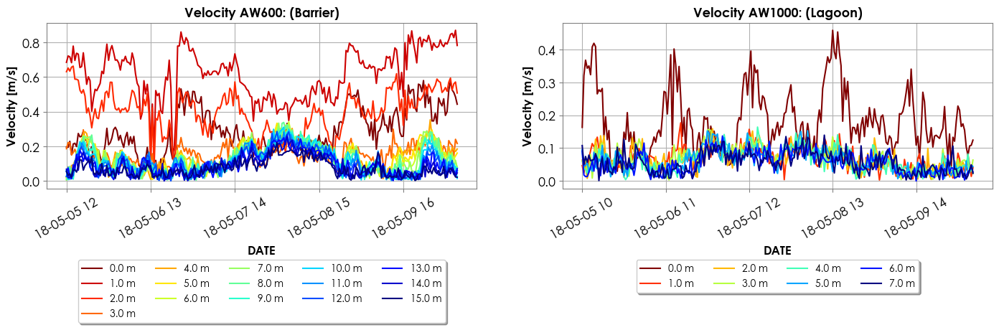

In [74]:
fig, axs = plt.subplots(1,2, figsize= (17, 3))
ax = axs[0]
k = len(df_aw600_vel_field.columns)-1
colors_cm = pl.cm.jet(np.linspace(0,1, len(df_aw600_vel_field.columns)))
for i in range (0,len(df_aw600_vel_field.columns)):
    ax.plot(df_aw600_vel_field.iloc[:,k-i], color = colors_cm[k-i], label =str(df_aw600_vel_field.columns[k-i]))
ticklabels = df_aw600_vel_field.index[::50]
ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
xlabels_aw6 = ax.get_xticklabels()
ax.set_ylabel ('Velocity [m/s]',size=12, fontweight = 'bold')
ax.set_xlabel ('DATE',size=12, fontweight = 'bold')
ax.tick_params(axis='x', labelrotation = 30)
fig_params(ax)
ax.set_title('Velocity AW600: (Barrier)', size = 13, fontweight = 'bold')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4),
          fancybox=True, shadow=True, ncol=5, fontsize = 10)
#------------------------------------------------------------------------------------------------------------------

ax1 = axs[1]
colors_cm = pl.cm.jet(np.linspace(0,1, len(df_aw1000_vel_field.columns)))
k = len(df_aw1000_vel_field.columns)-1
for i in range (0,len(df_aw1000_vel_field.columns),2):
    ax1.plot(df_aw1000_vel_field.iloc[:,k-i], color = colors_cm[k-i], label=df_aw1000_vel_field.columns[k-i])
ticklabels = df_aw1000_vel_field.index[::50]
ax1.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax1.xaxis.set_major_formatter(date_format)
xlabels_aw1 = ax1.get_xticklabels()
ax1.set_ylabel ('Velocity [m/s]',size=12, fontweight = 'bold')
ax1.set_xlabel ('DATE',size=12, fontweight = 'bold')
ax1.tick_params(axis='x', labelrotation = 30)
fig_params(ax1)
ax1.set_title('Velocity AW1000: (Lagoon)', size = 13, fontweight = 'bold')
ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4),
          fancybox=True, shadow=True, ncol=4, fontsize = 10)

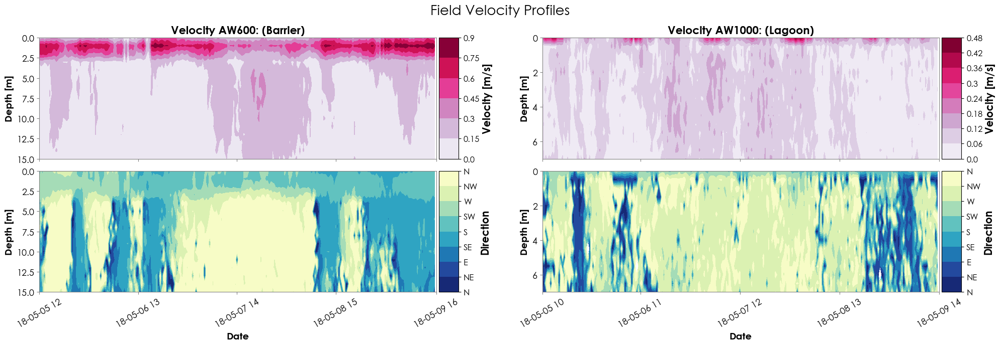

In [75]:
fig, axs = plt.subplots(2,2,figsize = (20, 7))
ax = axs[0,0]
x = np.arange(0,len(df_aw600_vel_field.index),1)
y = np.arange(0,len(df_aw600_vel_field.columns),1)[::-1]
xticks_time = df_aw600_vel_field.index[::50]
colormap = cm.PuRd
# colormap = cm.coolwarm

pc = ax.contourf(x, y, df_aw600_vel_field.transpose(),cmap=colormap)
divider = make_axes_locatable(ax)
ax.invert_yaxis()
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Velocity [m/s]',size=15, fontweight = 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
ax.set_xticks([int(np.linspace(0,len(df_aw600_vel_field.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_aw600_vel_field.index),len(xticks_time))))])
ax.set_xticklabels(xlabels_aw6)
fig_params(ax)
ax.grid()
ax.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax.set_title('Velocity AW600: (Barrier)',size = 16, fontweight = 'bold')   # Subtítulo de la figu
ax.set_xticklabels([])

# #------------------------------- fig 1----------------------------------------------------
ax1 = axs[1,0]
ylabels = ['N','NE','E','SE','S','SW','W','NW','N']
cmap_reversed = cm.get_cmap('YlGnBu_r')
# pc = ax1.contourf(xx, yy, df_direc.transpose(),levels = np.arange(0,360+90,90),cmap=colormap)
pc = ax1.contourf(x, y, df_direc_aw600.transpose(),levels = np.arange(0,360+45,45),cmap=cmap_reversed)
ax1.invert_yaxis()
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Direction',size=15, fontweight = 'bold')
cb.set_ticklabels(ylabels, size=12)
ax1.set_yticklabels(ax1.get_yticks().round(2),size = 12)
ax1.set_xticks([int(np.linspace(0,len(df_direc_aw600.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_direc_aw600.index),len(xticks_time))))])
ax1.set_xticklabels(xlabels_aw6)
fig_params(ax1)
ax1.grid()
ax1.set_xlabel ('Date',size=14, fontweight = 'bold')
ax1.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax1.tick_params(axis='x', labelrotation = 30)

# #------------------------------- fig 2----------------------------------------------------
ax2 = axs[0,1]
x = np.arange(0,len(df_aw1000_vel_field.index),1)
y = np.arange(0,len(df_aw1000_vel_field.columns)*0.5,0.5)[::-1]
xticks_time = df_aw1000_vel_field.index[::50]
colormap = cm.PuRd
# colormap = cm.coolwarm
pc = ax2.contourf(x, y, df_aw1000_vel_field.transpose(),cmap=colormap)
ax2.invert_yaxis()
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Velocity [m/s]',size=15, fontweight = 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
ax2.set_xticks([int(np.linspace(0,len(df_aw1000_vel_field.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_aw1000_vel_field.index),len(xticks_time))))])
ax2.set_xticklabels(xlabels_aw1)
fig_params(ax2)
ax2.grid()
ax2.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax2.set_title('Velocity AW1000: (Lagoon)',size = 16, fontweight = 'bold')   # Subtítulo de la figu
ax2.set_xticklabels([])

# #------------------------------- fig 3----------------------------------------------------
ax3 = axs[1,1]

ylabels = ['N','NE','E','SE','S','SW','W','NW','N']
cmap_reversed = cm.get_cmap('YlGnBu_r')
# pc = ax3.contourf(xx, yy, df_direc.transpose(),levels = np.arange(0,360+90,90),cmap=colormap)
pc = ax3.contourf(x, y, df_direc_aw1000.transpose(),levels = np.arange(0,360+45,45),cmap=cmap_reversed)
ax3.invert_yaxis()
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Direction',size=15,fontweight = 'bold')
cb.set_ticklabels(ylabels, size=12)
ax3.set_xticks([int(np.linspace(0,len(df_direc_aw1000.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_direc_aw1000.index),len(xticks_time))))])
ax3.set_xticklabels(xlabels_aw1)
fig_params(ax3)
ax3.grid()
ax3.set_xlabel ('Date',size=14,fontweight = 'bold')
ax3.set_ylabel ('Depth [m]',size=14,fontweight = 'bold')
ax3.tick_params(axis='x', labelrotation = 30)


fig.suptitle("Field Velocity Profiles", size = 20)     # Titulo de la figura
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.1)

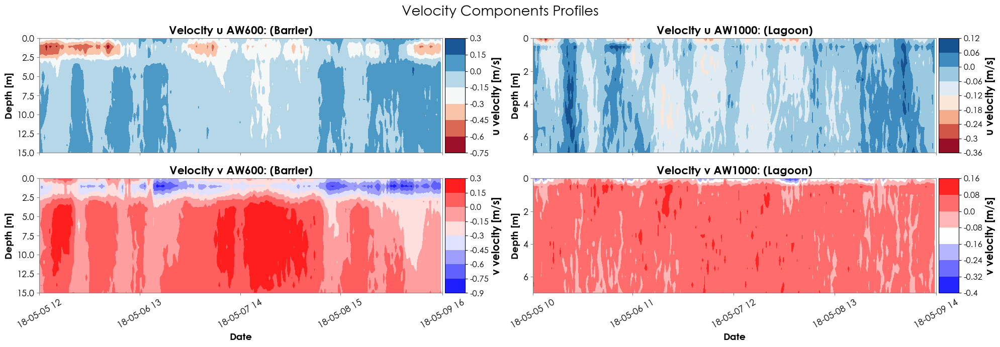

In [76]:
fig, axs = plt.subplots(2,2, figsize = (20, 7))
ax = axs[0,0]
x = np.arange(0,len(df_aw600_ufield.index),1)
y = np.arange(0,len(df_aw600_ufield.columns),1)[::-1]
xticks_time = df_aw600_ufield.index[::50]
colormap = cm.RdBu
# colormap = cm.coolwarm

pc = ax.contourf(x, y, df_aw600_ufield.transpose(),cmap=colormap)
ax.invert_yaxis()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('u velocity [m/s]',size=15, fontweight ='bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()), size=12)
ax.set_xticks([int(np.linspace(0,len(df_aw600_ufield.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_aw600_ufield.index),len(xticks_time))))])
ax.set_xticklabels(xlabels_aw6)
fig_params(ax)
ax.grid()
ax.set_ylabel ('Depth [m]',size=14, fontweight ='bold')
ax.set_title('Velocity u AW600: (Barrier)',size = 16, fontweight ='bold')   # Subtítulo de la figu
ax.set_xticklabels([])

# #------------------------------- fig 1----------------------------------------------------
ax1 = axs[1,0]
xticks_time = df_aw600_vfield.index[::50]
colormap = cm.bwr
# colormap = cm.coolwarm

pc = ax1.contourf(x, y, df_aw600_vfield.transpose(),cmap=colormap)
ax1.invert_yaxis()
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('v velocity [m/s]',size=15, fontweight= 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
ax1.set_xticks([int(np.linspace(0,len(df_aw600_vfield.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_aw600_vfield.index),len(xticks_time))))])
ax1.set_xticklabels(xlabels_aw6)
fig_params(ax1)
ax1.grid()
ax1.tick_params(axis='x', labelrotation = 30)
ax1.set_ylabel ('Depth [m]',size=14, fontweight= 'bold')
ax1.set_xlabel ('Date',size=14, fontweight= 'bold')
ax1.set_title('Velocity v AW600: (Barrier)',size = 16, fontweight= 'bold')   # Subtítulo de la figura

# #------------------------------- fig 2----------------------------------------------------
ax2 = axs[0,1]
x = np.arange(0,len(df_aw1000_ufield.index),1)
y = np.arange(0,len(df_aw1000_ufield.columns)*0.5,0.5)[::-1]
xticks_time = df_aw1000_ufield.index[::50]
colormap = cm.RdBu
# colormap = cm.coolwarm
pc = ax2.contourf(x, y, df_aw1000_ufield.transpose(),cmap=colormap)
ax2.invert_yaxis()
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('u velocity [m/s]',size=15, fontweight = 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
ax2.set_xticks([int(np.linspace(0,len(df_aw1000_ufield.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_aw1000_ufield.index),len(xticks_time))))])
# ax2.set_xticklabels(xlabels_aw6)
fig_params(ax2)
ax2.grid()
ax2.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax2.set_title('Velocity u AW1000: (Lagoon)',size = 16, fontweight = 'bold')   # Subtítulo de la figu
ax2.set_xticklabels([])


# #------------------------------- fig 3----------------------------------------------------
ax3 = axs[1,1]
xticks_time = df_aw1000_vfield.index[::50]
colormap = cm.bwr
# colormap = cm.coolwarm

pc = ax3.contourf(x, y, df_aw1000_vfield.transpose(),cmap=colormap)
ax3.invert_yaxis()
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('v velocity [m/s]',size=15, fontweight = 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
ax3.set_xticks([int(np.linspace(0,len(df_aw1000_vfield.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_aw1000_vfield.index),len(xticks_time))))])
ax3.set_xticklabels(xlabels_aw1)
fig_params(ax3)
ax3.grid()
ax3.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax3.set_xlabel ('Date',size=14, fontweight = 'bold')
ax3.set_title('Velocity v AW1000: (Lagoon)',size = 16, fontweight = 'bold')   # Subtítulo de la figu
ax3.tick_params(axis='x', labelrotation = 30)

fig.suptitle("Velocity Components Profiles", size = 20)     # Titulo de la figura
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)
fig.tight_layout()


### Model data

In [77]:
# # Northeast

name_file_loc_pts = 'TEST_X_PTS_OBS.obs'
depth_sensor_aw600 = 17
df_vel_aw600_model, df_dir_aw600_model, df_u_aw600_model, df_v_aw600_model = class_db_model_northeast.velocity_points(name_file_loc_pts = name_file_loc_pts, 
                                         depth_sensor = depth_sensor_aw600, delta_z=6)
# df_vel_aw600_model, df_dir_aw600_model, df_u_aw600_model, df_v_aw600_model = class_db_model_northeast.velocity_specific_point
df_field_model_vel_aw600 =df_vel_aw600_model.loc[df_aw600_vel_field.index.intersection(df_vel_aw600_model.index)]
df_field_model_dir_aw600 =df_dir_aw600_model.loc[df_direc_aw600.index.intersection(df_dir_aw600_model.index)].dropna(1)
df_field_model_u_aw600 =df_u_aw600_model.loc[df_aw600_ufield.index.intersection(df_u_aw600_model.index)].dropna(1)
df_field_model_v_aw600 =df_v_aw600_model.loc[df_aw600_vfield.index.intersection(df_v_aw600_model.index)].dropna(1)


# # West
depth_sensor_aw1000 = 7
df_vel_aw1000_model, df_dir_aw1000_model, df_u_aw1000_model, df_v_aw1000_model = class_db_model_west.velocity_points(name_file_loc_pts = name_file_loc_pts, 
                                         depth_sensor = depth_sensor_aw1000, delta_z=6)
# # df_vel_aw1000_model, df_dir_aw1000_model, df_u_aw1000_model, df_v_aw1000_model = class_db_model_west.velocity_specific_point
df_field_model_vel_aw1000 =df_vel_aw1000_model.loc[df_aw1000_vel_field.index.intersection(df_vel_aw1000_model.index)].dropna(1)
df_field_model_dir_aw1000 =df_dir_aw1000_model.loc[df_direc_aw1000.index.intersection(df_dir_aw1000_model.index)].dropna(1)
df_field_model_u_aw1000 =df_u_aw1000_model.loc[df_aw1000_ufield.index.intersection(df_u_aw1000_model.index)].dropna(1)
df_field_model_v_aw1000 =df_v_aw1000_model.loc[df_aw1000_vfield.index.intersection(df_v_aw1000_model.index)].dropna(1)

Indice: 4 , Valor: 15.788750171661377 , Valor real: 17
**********ERROR************
Indice: 3 , Valor: 8.38474988937378 , Valor real: 7


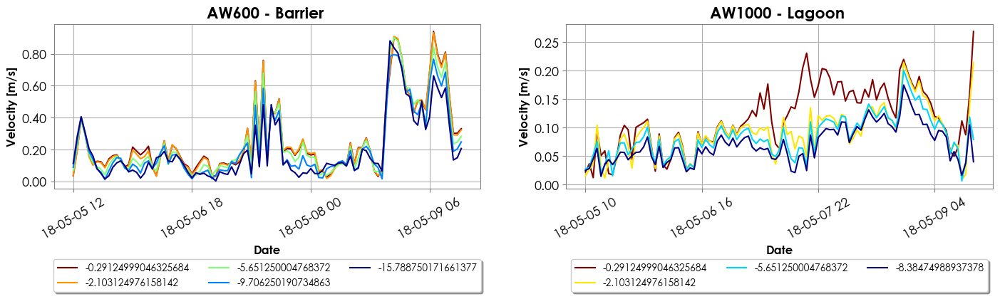

In [78]:
fig, axs = plt.subplots(1,2, figsize= (17, 3))
ax = axs[0]
k = len(df_field_model_vel_aw600.columns)-1
colors_cm = pl.cm.jet(np.linspace(0,1, len(df_field_model_vel_aw600.columns)))
for i in range (0,len(df_field_model_vel_aw600.columns)):
    ax.plot(df_field_model_vel_aw600.iloc[:,k-i], color = colors_cm[k-i], label =str(df_field_model_vel_aw600.columns[k-i]))
ticklabels = df_field_model_vel_aw600.index[::30]
ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
xlabels_aw6_model = ax.get_xticklabels()
ax.set_ylabel ('Velocity [m/s]',size=12, fontweight= 'bold')
ax.set_xlabel ('Date',size=12, fontweight= 'bold')
fig_params(ax)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4),
          fancybox=True, shadow=True, ncol=3, fontsize = 10)
ax.set_title('AW600 - Barrier ',size = 16, fontweight = 'semibold')   # Subtítulo de la figura
ax.tick_params(axis='x', labelrotation = 30)
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

#------------------------------------------------------------------------------------------------------------------

ax1 = axs[1]
colors_cm = pl.cm.jet(np.linspace(0,1, len(df_field_model_vel_aw1000.columns)))
k = len(df_field_model_vel_aw1000.columns)-1
for i in range (0,len(df_field_model_vel_aw1000.columns)):
    ax1.plot(df_field_model_vel_aw1000.iloc[:,k-i], color = colors_cm[k-i], label=df_field_model_vel_aw1000.columns[k-i])
ticklabels = df_field_model_vel_aw1000.index[::30]
ax1.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax1.xaxis.set_major_formatter(date_format)
xlabels_aw1_model = ax1.get_xticklabels()
ax1.set_ylabel ('Velocity [m/s]',size=12, fontweight = 'bold')
ax1.set_xlabel ('Date',size=12, fontweight = 'bold')
ax1.set_title('AW1000 - Lagoon ',size = 16, fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)
ax1.tick_params(axis='x', labelrotation = 30)
ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.4),
          fancybox=True, shadow=True, ncol=3, fontsize = 10)
ax1.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))


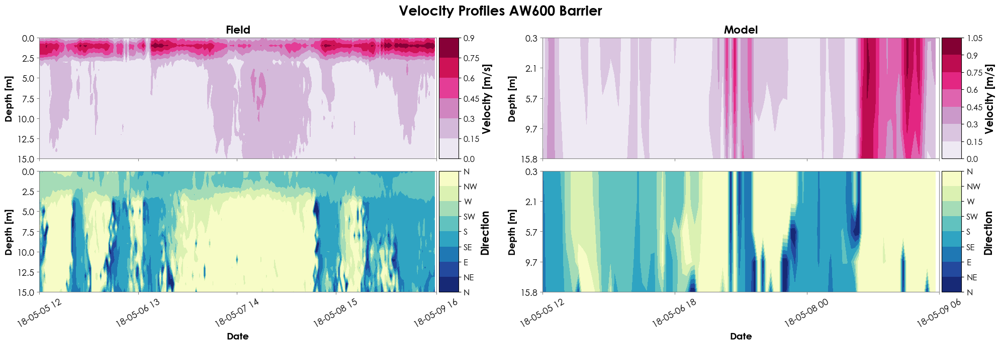

In [79]:
fig, axs = plt.subplots(2,2, figsize = (20, 7))
ax = axs[0,0]
x = np.arange(0,len(df_aw600_vel_field.index),1)
y = np.arange(0,len(df_aw600_vel_field.columns),1)[::-1]
xticks_time = df_aw600_vel_field.index[::50]
colormap = cm.PuRd
# colormap = cm.coolwarm

pc = ax.contourf(x, y, df_aw600_vel_field.transpose(),cmap=colormap)
levels_vel_aw600 = list(pc.get_array())
divider = make_axes_locatable(ax)
ax.invert_yaxis()
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Velocity [m/s]',size=15,fontweight = 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
ax.set_xticks([int(np.linspace(0,len(df_aw600_vel_field.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_aw600_vel_field.index),len(xticks_time))))])
fig_params(ax)
ax.grid()
ax.set_ylabel ('Depth [m]',size=14,fontweight = 'bold')
ax.set_title('Field',size = 16, fontweight = 'bold')   # Subtítulo de la figu
ax.set_xticklabels([])

#------------------------------- fig 1----------------------------------------------------
ax1 = axs[1,0]
ylabels = ['N','NE','E','SE','S','SW','W','NW','N']
cmap_reversed = cm.get_cmap('YlGnBu_r')
# pc = ax1.contourf(xx, yy, df_direc.transpose(),levels = np.arange(0,360+90,90),cmap=colormap)
pc = ax1.contourf(x, y, df_direc_aw600.transpose(),levels = np.arange(0,360+45,45),cmap=cmap_reversed)
ax1.invert_yaxis()
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Direction',size=15, fontweight = 'bold')
cb.set_ticklabels(ylabels,size=12)
ax1.set_xticks([int(np.linspace(0,len(df_direc_aw600.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_direc_aw600.index),len(xticks_time))))])
ax1.set_xticklabels(xlabels_aw6)
fig_params(ax1)
ax1.grid()
ax1.set_xlabel ('Date',size=14, fontweight = 'bold')
ax1.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax1.tick_params(axis='x', labelrotation = 30)

#------------------------------- fig 2----------------------------------------------------
ax2 = axs[0,1]
x = np.arange(0,len(df_field_model_vel_aw600.index),1)
y = np.arange(0,len(df_field_model_vel_aw600.columns),1)[::-1]
xticks_time = df_field_model_vel_aw600.index[::30]
colormap = cm.PuRd
# colormap = cm.coolwarm

# pc = ax2.contourf(x, y, df_field_model_vel_aw600.transpose(), levels = levels_vel_aw600,cmap=colormap)
pc = ax2.contourf(x, y, df_field_model_vel_aw600.transpose(),cmap=colormap)
ax2.invert_yaxis()
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Velocity [m/s]',size=15, fontweight = 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
yticks =[round(-list(df_field_model_vel_aw600.columns)[i],1) for i in range(len(list(df_field_model_vel_aw600.columns)))][::-1]
# yticks =[round(-list(df_field_model_vel_aw600.columns)[i][0],1) for i in range(len(list(df_field_model_vel_aw600.columns)))][::-1]
ax2.set_yticklabels(yticks, size = 12)
ax2.set_xticks([int(np.linspace(0,len(df_field_model_vel_aw600.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_field_model_vel_aw600.index),len(xticks_time))))])
ax2.set_xticklabels(xlabels_aw6_model)
fig_params(ax2)
ax2.grid()
ax2.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax2.set_title('Model',size = 16, fontweight = 'bold')   # Subtítulo de la figu
ax2.set_xticklabels([])


#------------------------------- fig 3----------------------------------------------------
ax3 = axs[1,1]

ylabels = ['N','NE','E','SE','S','SW','W','NW','N']
cmap_reversed = cm.get_cmap('YlGnBu_r')
# pc = ax3.contourf(xx, yy, df_direc.transpose(),levels = np.arange(0,360+90,90),cmap=colormap)
pc = ax3.contourf(x, y, df_field_model_dir_aw600.transpose(),levels = np.arange(0,360+45,45),cmap=cmap_reversed)
ax3.invert_yaxis()
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Direction',size=15, fontweight = 'bold')
cb.set_ticklabels(ylabels, size=12)
ax3.set_yticklabels(yticks, size = 12)
ax3.set_xticks([int(np.linspace(0,len(df_field_model_dir_aw600.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_field_model_dir_aw600.index),len(xticks_time))))])
ax3.set_xticklabels(xlabels_aw6_model)
fig_params(ax3)
ax3.grid()
ax3.set_xlabel ('Date',size=14, fontweight = 'bold')
ax3.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax3.tick_params(axis='x', labelrotation = 30)

fig.suptitle("Velocity Profiles AW600 Barrier", size = 20, fontweight = 'bold')     # Titulo de la figura
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.1)

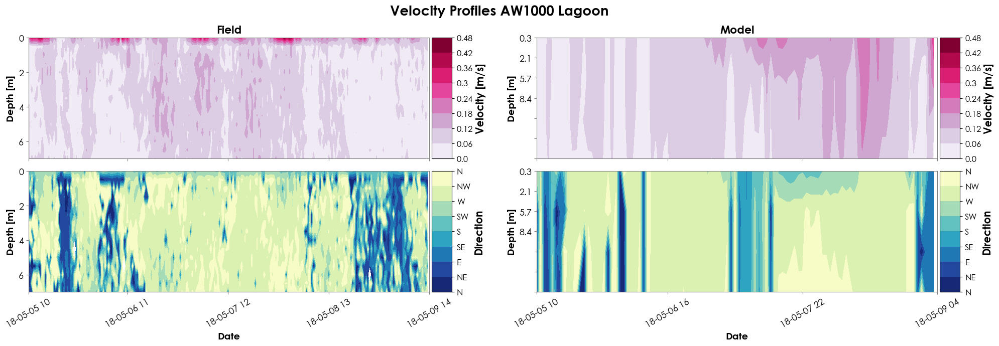

In [80]:
fig, axs = plt.subplots(2,2, figsize = (20, 7))
ax = axs[0,0]
x = np.arange(0,len(df_aw1000_vel_field.index),1)
y = np.arange(0,len(df_aw1000_vel_field.columns)*0.5,0.5)[::-1]
xticks_time = df_aw1000_vel_field.index[::50]
colormap = cm.PuRd
# colormap = cm.coolwarm

pc = ax.contourf(x, y, df_aw1000_vel_field.transpose(),cmap=colormap)
levels_vel_aw1000 = list(pc.get_array())
ax.invert_yaxis()
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Velocity [m/s]',size=15, fontweight = 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
ax.set_xticks([int(np.linspace(0,len(df_aw1000_vel_field.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_aw1000_vel_field.index),len(xticks_time))))])
ax.set_xticklabels(xlabels_aw1)
fig_params(ax)
ax.grid()
ax.tick_params(axis='x', labelrotation = 30)
ax.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax.set_title('Field',size = 16, fontweight = 'bold')   # Subtítulo de la figu
ax.set_xticklabels([])

#------------------------------- fig 2----------------------------------------------------
ax1 = axs[1,0]

ylabels = ['N','NE','E','SE','S','SW','W','NW','N']
cmap_reversed = cm.get_cmap('YlGnBu_r')
# pc = ax3.contourf(xx, yy, df_direc.transpose(),levels = np.arange(0,360+90,90),cmap=colormap)
pc = ax1.contourf(x, y, df_direc_aw1000.transpose(),levels = np.arange(0,360+45,45),cmap=cmap_reversed)
ax1.invert_yaxis()
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Direction',size=15, fontweight = 'bold')
cb.set_ticklabels(ylabels, size=12)
ax1.set_xticks([int(np.linspace(0,len(df_direc_aw1000.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_direc_aw1000.index),len(xticks_time))))])
ax1.set_xticklabels(xlabels_aw1)
fig_params(ax1)
ax1.grid()
ax1.tick_params(axis='x', labelrotation = 30)
ax1.set_xlabel ('Date',size=14, fontweight = 'bold')
ax1.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')

# ax1.set_title('aw1000',size = 16,fontproperties=prop1)   # Subtítulo de la figu

#------------------------------- fig 3----------------------------------------------------
ax2 = axs[0,1]
x = np.arange(0,len(df_field_model_vel_aw1000.index),1)
y = np.arange(0,len(df_field_model_vel_aw1000.columns),1)[::-1]
xticks_time = df_field_model_vel_aw1000.index[::30]
colormap = cm.PuRd
# colormap = cm.coolwarm

pc = ax2.contourf(x, y, df_field_model_vel_aw1000.transpose(), levels = levels_vel_aw1000,cmap=colormap)
# pc = ax2.contourf(x, y, df_field_model_vel_aw1000.transpose(),cmap=colormap)
ax2.invert_yaxis()
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Velocity [m/s]',size=15, fontweight = 'bold')
cb.set_ticklabels(list(round(i,2) for i in cb.get_ticks()),size=12)
yticks =[round(-list(df_field_model_vel_aw1000.columns)[i],1) for i in range(len(list(df_field_model_vel_aw1000.columns)))][::-1]
# yticks =[round(-list(df_field_model_vel_aw1000.columns)[i][0],1) for i in range(len(list(df_field_model_vel_aw1000.columns)))][::-1]
ax2.set_yticklabels(yticks, size = 12)
ax2.set_xticks([int(np.linspace(0,len(df_field_model_vel_aw1000.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_field_model_vel_aw1000.index),len(xticks_time))))])
ax2.set_xticklabels(xlabels_aw1_model)
fig_params(ax2)
ax2.grid()
ax2.tick_params(axis='x', labelrotation = 30)
ax2.set_ylabel ('Depth [m]',size=14, fontweight = 'bold')
ax2.set_title('Model',size = 16, fontweight = 'bold')   # Subtítulo de la figu
ax2.set_xticklabels([])


#------------------------------- fig 3----------------------------------------------------
ax3 = axs[1,1]

ylabels = ['N','NE','E','SE','S','SW','W','NW','N']
cmap_reversed = cm.get_cmap('YlGnBu_r')
# pc = ax3.contourf(xx, yy, df_direc.transpose(),levels = np.arange(0,360+90,90),cmap=colormap)
pc = ax3.contourf(x, y, df_field_model_dir_aw1000.transpose(),levels = np.arange(0,360+45,45),cmap=cmap_reversed)
ax3.invert_yaxis()
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
cb =fig.colorbar(pc, cax=cax, orientation='vertical')
cb.set_label('Direction',size=15, fontweight = 'bold')
cb.set_ticklabels(ylabels,size=12)
ax3.set_yticklabels(yticks, size = 12)
ax3.set_xticks([int(np.linspace(0,len(df_field_model_dir_aw1000.index),len(xticks_time))[i]) for i in range(len(np.linspace(0,len(df_field_model_dir_aw1000.index),len(xticks_time))))])
ax3.set_xticklabels(xlabels_aw1_model)
fig_params(ax3)
ax3.grid()
ax3.tick_params(axis='x', labelrotation = 30)
ax3.set_xlabel ('Date',size=14,fontweight = 'bold')
ax3.set_ylabel ('Depth [m]',size=14,fontweight = 'bold')

fig.suptitle("Velocity Profiles AW1000 Lagoon", size = 20,fontweight = 'bold')     # Titulo de la figura
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.1)

### Plots y analisis

In [81]:
def numero_segunda_minima_diferencia(numero, lista):
    diferencias = {abs(numero - x): x for x in lista}
    diferencias_ordenadas = sorted(diferencias)
    segunda_minima = diferencias[diferencias_ordenadas[1]]
    return segunda_minima

def df_field_compare(df_field:pd.DataFrame, df_model:pd.DataFrame):
    """
    Esta función devuelve un dataframe con los perfiles de velocidad en las profunidades más cercanas al modelo
    ----------------------------------------------------------------------------------------------------------
    Input: 
    ------
    - df_field: data frame que contiene los datos de campo
    - df_modl: data frame que contiene los datos del modelo
    --------------------------------------------------------------------------------------------------------
    Output: 
    -  df_field[list_match]: Data farme con las columnas que más coinciden con el mdodelo
    """
    list_cols_model = list(-df_model.columns)
    num = lambda x : float(re.findall(r'\d+\.\d+', x)[0])
    list_cols_field = list(df_field.columns)
    list_cols_field = list(map(num, list_cols_field))
    min_dif = lambda y: str(min(list_cols_field, key=lambda x: abs(x-y))) + ' m'
    list_match = list(map(min_dif, list_cols_model))
    
    fun_second_min_dif = lambda x: str(numero_segunda_minima_diferencia(x, list_cols_field)) + ' m'
    list_second_match = list(map(fun_second_min_dif, list_cols_model))
    
    return df_field[list_match] , df_field[list_second_match]

def fig_velocity (sensor, dfield1, label1,  coef_tikslabels ,rotation, color1,second_dif: bool,compare_two:bool, dfield2 = None, df2= None, label2 = None, color2 = None):
    """
    
    """
    depth = list(dfield1.columns)[0]
    title = f'Field and Model Velocity: {sensor}'
    name_label = 'Vel [m/s]'
    fig, ax = plt.subplots(figsize = (10, 3))
    ticklabels = dfield1.index[::coef_tikslabels]
    ax.set_xticks(ticklabels)
    date_format = mdates.DateFormatter('%y-%m-%d %H')
    ax.xaxis.set_major_formatter(date_format)
    ax.plot(dfield1, label = f'{label1} [{depth}]', ls = '-', color = color1, lw = 1.5 )
    if second_dif == True: 
        depth = list(dfield2.columns)[0]
        ax.plot(dfield2, label = f'{label1} [{depth}]', ls = '--', color = color1, lw = 1.5, alpha = 0.7)
    if compare_two == True:
        depth = -round(list(df2.columns)[0],2)
        ax.plot(df2, label = f'{label2} [{depth} m]', ls = '-', color = color2, lw = 2 )
    ax.set_xlabel('Date', size = 14, fontweight = 'bold')
    ax.set_ylabel(name_label, size = 14, fontweight = 'bold')
    ax.set_title(title, size = 16, fontweight = 'bold')   
    fig_params(ax)
    fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=2, fontsize = 12)
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.2)
    plt.subplots_adjust(hspace=0.1)
    plt.xticks(rotation=rotation);

        

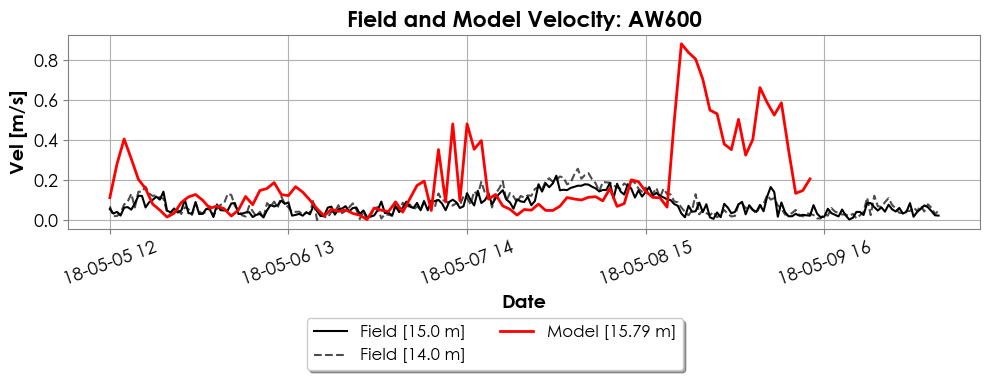

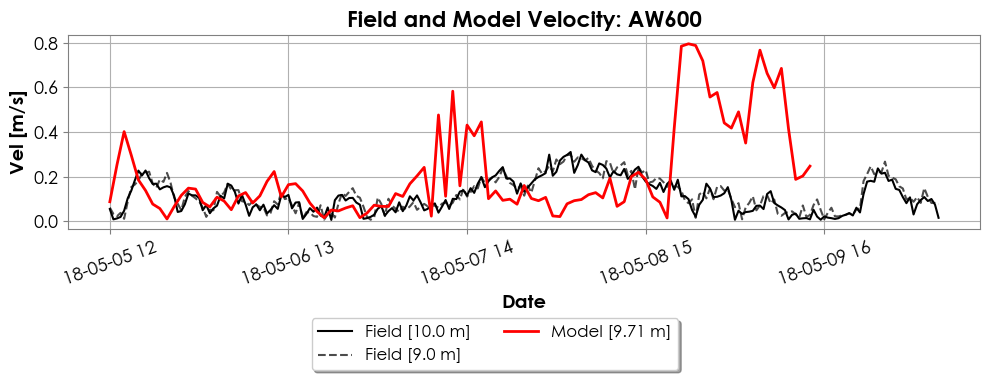

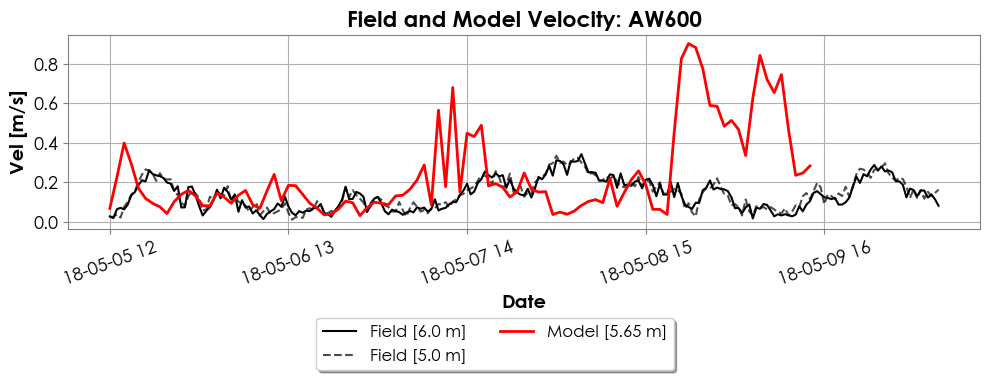

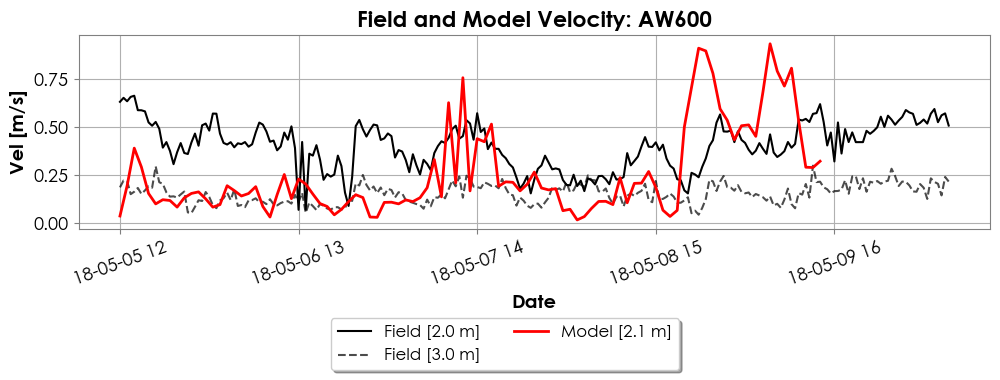

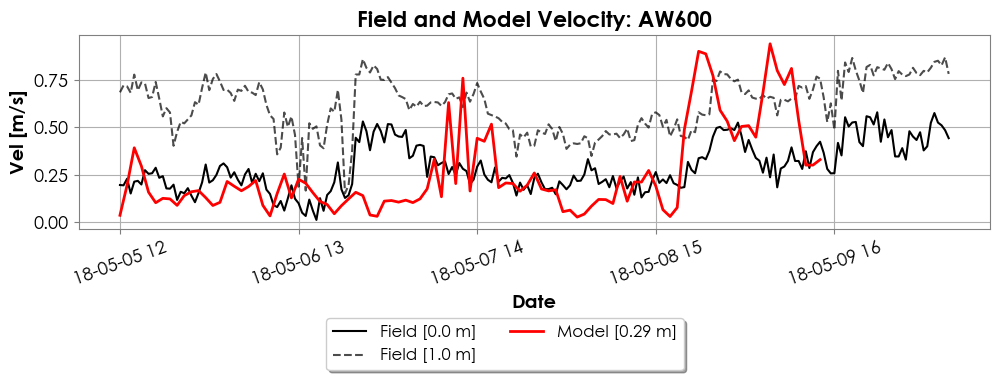

In [82]:
df_aw600_vel_field1, df_aw600_vel_field2 = df_field_compare(df_field = df_aw600_vel_field, df_model = df_field_model_vel_aw600)
ind_cols_aw600 = list(range(len(df_aw600_vel_field1.columns)))
fig_fun = lambda x: fig_velocity (sensor = 'AW600' ,dfield1 = df_aw600_vel_field1.iloc[:,x].to_frame(), label1 = 'Field',  
                                  coef_tikslabels = 50 ,rotation = 20 , color1 = 'k', second_dif= True,
                                  compare_two = True, dfield2= df_aw600_vel_field2.iloc[:,x].to_frame(),
                                  df2= df_field_model_vel_aw600.iloc[:,x].to_frame(), 
                                  label2 = 'Model', color2 = 'r')

figs = list(map(fig_fun, ind_cols_aw600))

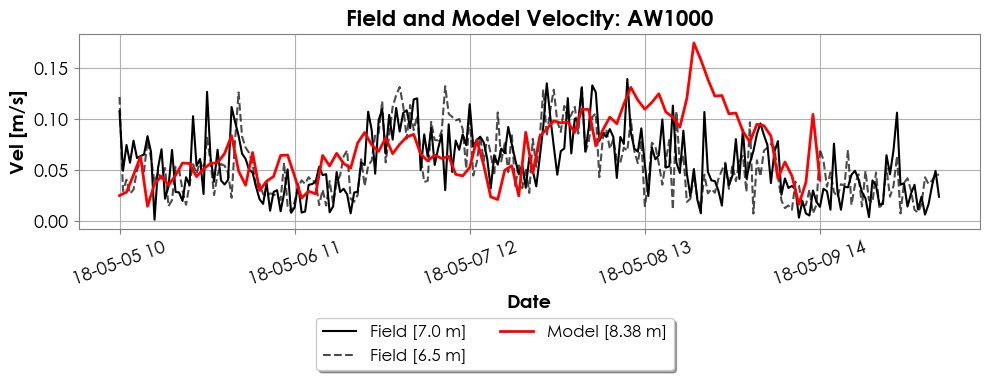

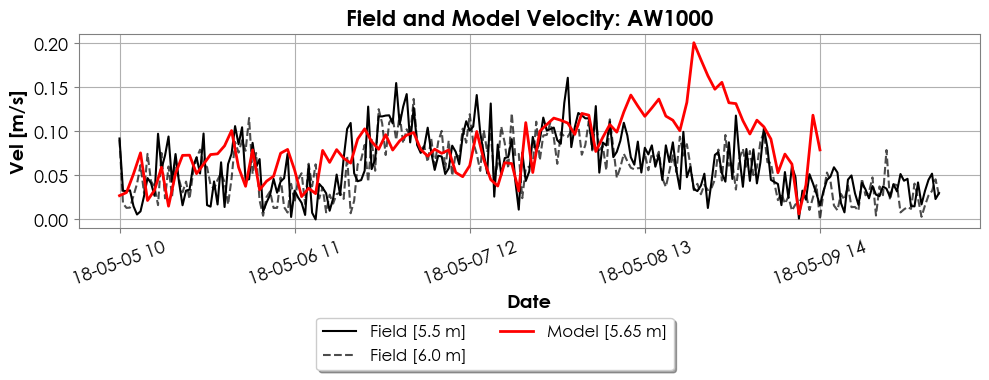

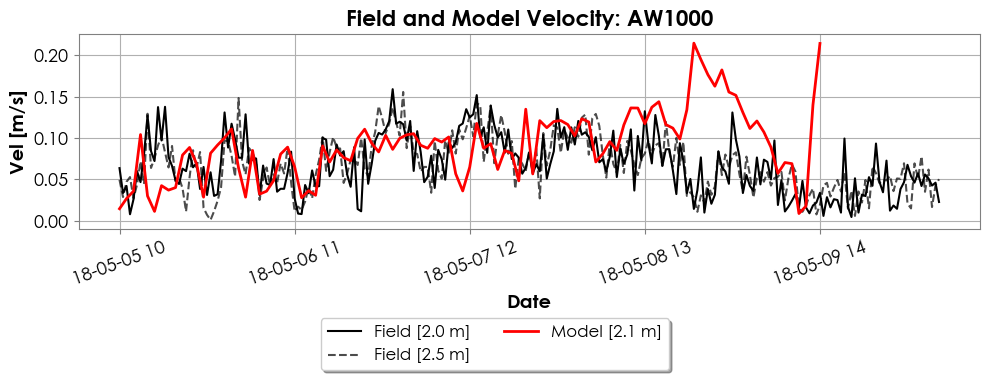

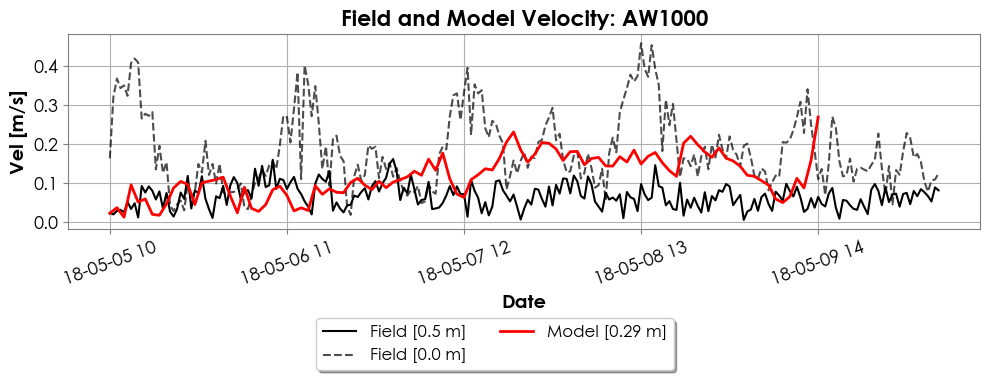

In [83]:
df_aw1000_vel_field1, df_aw1000_vel_field2  = df_field_compare(df_field = df_aw1000_vel_field, df_model = df_field_model_vel_aw1000)
ind_cols_aw1000 = list(range(len(df_aw1000_vel_field1.columns)))
fig_fun = lambda x: fig_velocity (sensor = 'AW1000' ,dfield1 = df_aw1000_vel_field1.iloc[:,x].to_frame(), label1 = 'Field',  
                                  coef_tikslabels = 50 ,rotation = 20 ,color1 = 'k', second_dif= True, 
                                  compare_two = True,dfield2=df_aw1000_vel_field2.iloc[:,x].to_frame() ,
                                  df2= df_field_model_vel_aw1000.iloc[:,x].to_frame(), label2 = 'Model', color2 = 'r')

figs = list(map(fig_fun, ind_cols_aw1000))

In [ ]:
# fig_velocity (sensor = 'AW600' ,df1 = df_aw600_vel_field.iloc[:,0].to_frame(), label1 = 'Field',  coef_tikslabels = 50 ,rotation = 20 
#             , color1 = 'k', compare_two = True, df2= df_field_model_vel_aw600.iloc[:,0].to_frame(), label2 = 'Model', color2 = 'r')

## Water level

In [65]:
def marea_descomp(df):
    """
    Input: 
    - df of water level donde la columna del nivel dela agua se llame waterlevel
    ----------------------------------------------------------------------------
    Output:
    - df con marea astronómica y metereológica
    
    """
    my_tide = Tide.decompose(df['waterlevel'], df.index)
    df['astro_tide'] = my_tide.at(df.index)
    df['meteo_tide'] = df['waterlevel'] - df['astro_tide']
    return df

### Field data

In [10]:
# ______________________________________________AW600 Barrera_________________________________________________ 
path= r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\VALIDACION_PALOMA\AW1_600"
name_file = 'AW101.sen'
df_barrier = class_field_db_AW600.water_level(path= path, name_file= name_file, 
                                              ini_date=datetime.datetime(2018,5,5,12,0,0), 
                                              end_date= datetime.datetime(2018,5,10,8,0,0))
df_barrier = marea_descomp(df_barrier)                                              
df_barrier['time'] = df_barrier.index


# ______________________________________________AW600 Lagoon_________________________________________________ 
path= r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\VALIDACION_PALOMA\AW2_1000"
name_file = 'AW201.sen'
df_lagoon = class_field_db_AW600.water_level(path= path, name_file= name_file, 
                                              ini_date=datetime.datetime(2018,5,5,10,0,0), 
                                              end_date= datetime.datetime(2018,5,10,7,0,0))
df_lagoon = marea_descomp(df_lagoon)
df_lagoon['time'] = df_lagoon.index

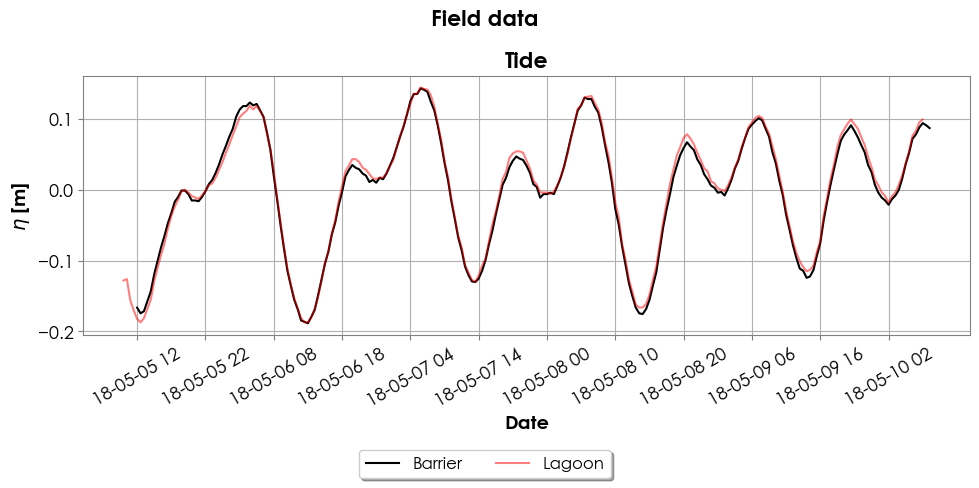

In [11]:
fig, ax = plt.subplots(figsize =(10,4))

ticklabels = df_barrier.index[::20]
ax.plot(df_barrier['waterlevel'], label ='Barrier', color = 'k' )
ax.plot(df_lagoon['waterlevel'], label = 'Lagoon', color = 'red', alpha = 0.5)

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('$\eta$ [m]',size=14, fontweight = 'bold')
ax.set_xlabel ('Date',size=14, fontweight = 'bold')
ax.set_title('Tide',size = 16, fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)
fig.suptitle("Field data", size = 16, fontweight = 'bold')     # Titulo de la figura
fig.tight_layout()
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), shadow=True, ncol=4, fontsize = 12)
plt.xticks(rotation=30);

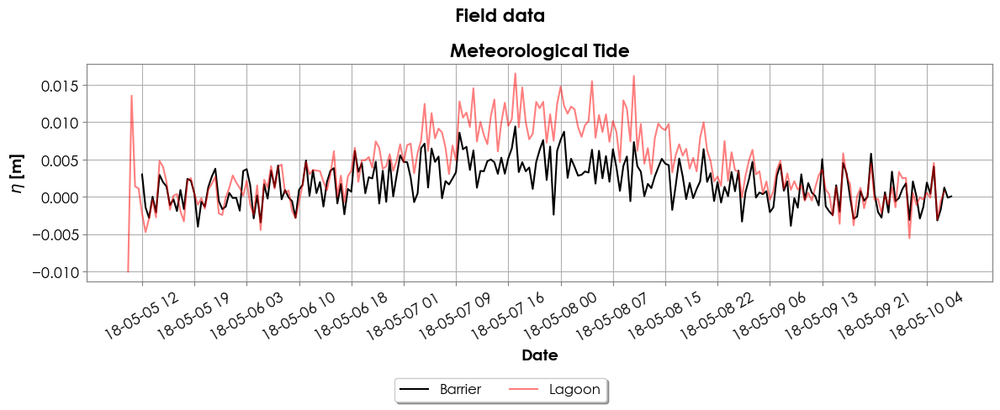

In [12]:
fig, ax = plt.subplots(figsize =(12,4))

ticklabels = df_barrier.index[::15]
ax.plot(df_barrier['meteo_tide'], label ='Barrier', color = 'k' )
ax.plot(df_lagoon['meteo_tide'], label = 'Lagoon', color = 'red', alpha = 0.5)

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('$\eta$ [m]',size=14,fontweight = 'bold')
ax.set_xlabel ('Date',size=14,fontweight = 'bold')
ax.set_title('Meteorological Tide',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)
fig.suptitle("Field data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.tight_layout()
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),fancybox=True, shadow=True, ncol=4, fontsize = 12)
plt.xticks(rotation=30);

### Model data

In [70]:
df_wl_ne_model = class_db_model_northeast.water_level()
df_wl_w_model = class_db_model_west.water_level()


# Tide descomposition
# Tomar las horas que coiniciden entre campo y modelo
df_field_model_northeast =df_wl_ne_model.loc[df_barrier.index.intersection(df_wl_ne_model.index)]
df_field_model_northeast['waterlevel'] = df_field_model_northeast['waterlevel']

df_field_model_west =df_wl_w_model.loc[df_lagoon.index.intersection(df_wl_w_model.index)]
df_field_model_west['waterlevel'] = df_field_model_west['waterlevel']

df_field_model_northeast = marea_descomp(df_field_model_northeast)
df_field_model_northeast['time'] = df_field_model_northeast.index

df_field_model_west = marea_descomp(df_field_model_west)
df_field_model_west['time'] = df_field_model_west.index

# Match between model data and field data
df_field_model_northeast= pd.merge(df_barrier,df_field_model_northeast, on = 'time' ).set_index('time')
df_field_model_west= pd.merge(df_lagoon,df_field_model_west, on = 'time' ).set_index('time')

### Plot y análisis 

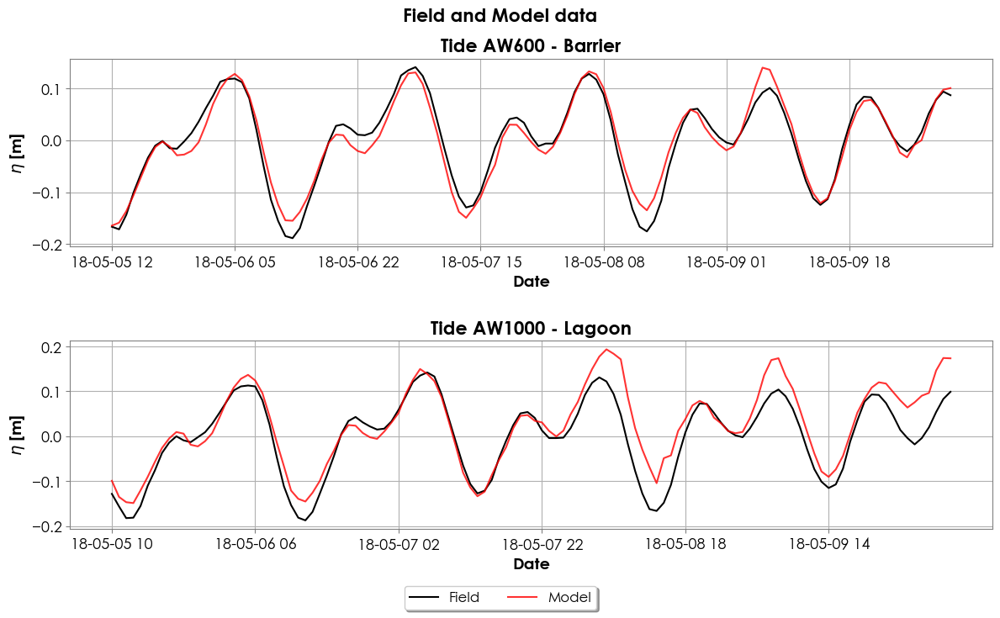

In [71]:
fig, axs = plt.subplots(2,1, figsize =(12,7))
ax = axs[0]
ticklabels = df_field_model_northeast.index[::17] # Vector of times
ax.plot(df_field_model_northeast['waterlevel_x'], label ='Field', color = 'k' )
ax.plot(df_field_model_northeast['waterlevel_y'], label = 'Model', color = 'red', alpha = 0.8)

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('$\eta$ [m]',size=14,fontweight ='bold')
ax.set_xlabel ('Date',size=14,fontweight ='bold')
fig_params(ax)
ax.set_title('Tide AW600 - Barrier',size = 16,fontweight ='bold')   # Subtítulo de la figura

ax1 = axs[1]
ticklabels = df_field_model_west.index[::20]
ax1.plot(df_field_model_west['waterlevel_x'], color = 'k' )
ax1.plot(df_field_model_west['waterlevel_y'], color = 'red', alpha = 0.8)

ax1.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax1.xaxis.set_major_formatter(date_format)
ax1.set_ylabel ('$\eta$ [m]',size=14,fontweight ='bold')
ax1.set_xlabel ('Date',size=14,fontweight = 'bold')
fig_params(ax1)
ax1.set_title('Tide AW1000 - Lagoon',size = 16,fontweight ='bold')   # Subtítulo de la figura

fig.suptitle("Field and Model data", size = 16,fontweight ='bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01),fancybox=True, shadow=True, ncol=4, fontsize = 12)
# plt.xticks(rotation=30);
fig.tight_layout()
plt.subplots_adjust(wspace=0.6)
plt.subplots_adjust(hspace=0.5)

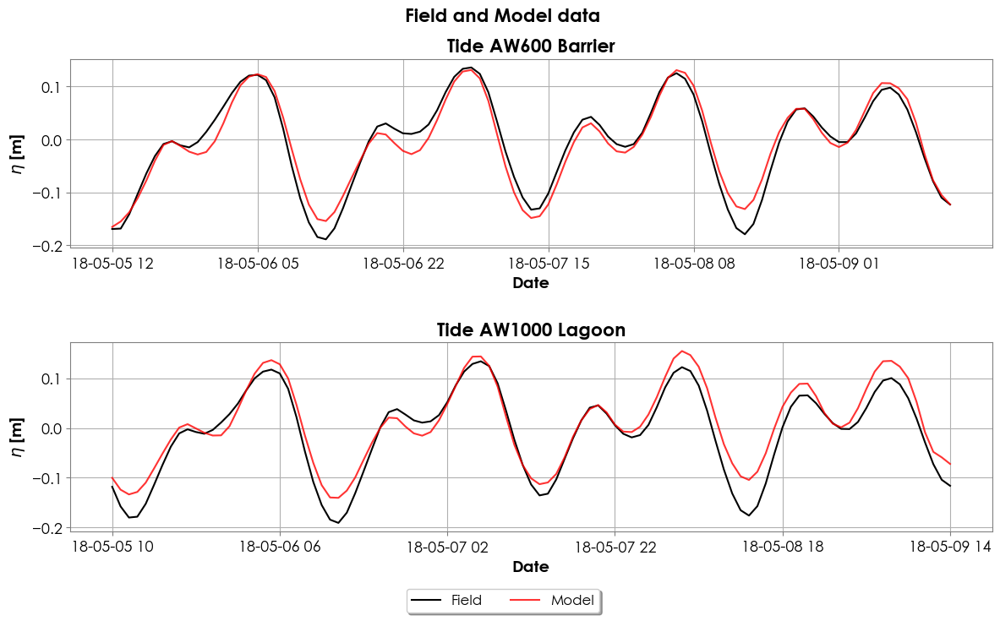

In [16]:
fig, axs = plt.subplots(2,1, figsize =(12,7))
ax = axs[0]
ticklabels = df_field_model_northeast.index[::17] # Vector of times
ax.plot(df_field_model_northeast['astro_tide_x'], label ='Field', color = 'k' )
ax.plot(df_field_model_northeast['astro_tide_y'], label = 'Model', color = 'red', alpha = 0.8)

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('$\eta$ [m]',size=14,fontweight = 'bold')
ax.set_xlabel ('Date',size=14,fontweight = 'bold')
ax.set_title('Tide AW600 Barrier',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
ticklabels = df_field_model_west.index[::20]
ax1.plot(df_field_model_west['astro_tide_x'], color = 'k' )
ax1.plot(df_field_model_west['astro_tide_y'], color = 'red', alpha = 0.8)
ax1.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax1.xaxis.set_major_formatter(date_format)
ax1.set_ylabel ('$\eta$ [m]',size=14,fontweight = 'bold')
ax1.set_xlabel ('Date',size=14,fontweight = 'bold')
ax1.set_title('Tide AW1000 Lagoon',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)

fig.suptitle("Field and Model data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01), fancybox=True, shadow=True, ncol=4, fontsize = 12)
# plt.xticks(rotation=30);
fig.tight_layout()
plt.subplots_adjust(wspace=0.6)
plt.subplots_adjust(hspace=0.5)

In [18]:
# Mestricas de ajuste
# Mide el grado de ajuste 
r2_ne_wl = r2_score(df_field_model_northeast['waterlevel_x'],df_field_model_northeast['waterlevel_y'])
r2_w_wl = r2_score(df_field_model_west['waterlevel_x'][:],df_field_model_west['waterlevel_y'])

r2_ne = r2_score(df_field_model_northeast['astro_tide_x'],df_field_model_northeast['astro_tide_y'])
r2_w = r2_score(df_field_model_west['astro_tide_x'][:],df_field_model_west['astro_tide_y'])

# Son errores entre mas bajo mejor
rmse_ne_wl = mean_squared_error(df_field_model_northeast['waterlevel_x'],df_field_model_northeast['waterlevel_y'])
rmse_w_wl = mean_squared_error(df_field_model_west['waterlevel_x'][:],df_field_model_west['waterlevel_y'])

rmse_ne = mean_squared_error(df_field_model_northeast['astro_tide_x'],df_field_model_northeast['astro_tide_y'])
rmse_w = mean_squared_error(df_field_model_west['astro_tide_x'][:],df_field_model_west['astro_tide_y'])


print('R2 AW600: ', r2_ne, r2_ne_wl)
print('R2 AW1000: ', r2_w, r2_w_wl)

print('rmse AW600: ', rmse_ne, rmse_ne_wl)
print('rmse AW1000: ', rmse_w, rmse_w_wl)

R2 AW600:  0.9465863183016696 0.9430574270436755
R2 AW1000:  0.888515413835075 0.8996131741962952
rmse AW600:  0.00040789994598333033 0.0004361390097982983
rmse AW1000:  0.000870455929921894 0.000797215565786232


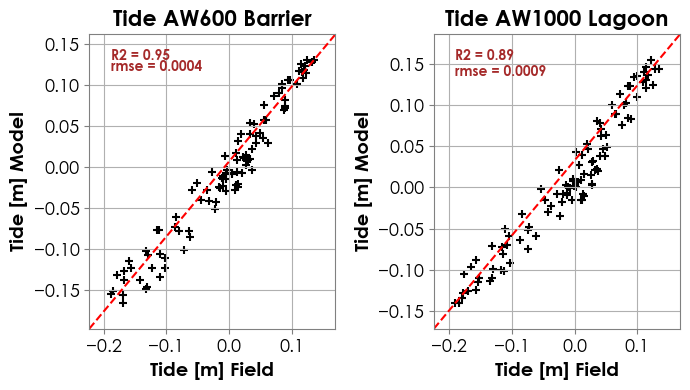

In [19]:
# Model data 
def on_change(axes):
    # When this function is called it checks the current
    # values of xlim and ylim and modifies diag_line
    # accordingly.
    ax = axes
    x_lims = ax.get_xlim()
    y_lims = ax.get_ylim()
    diag_line.set_data(x_lims, y_lims)


fig, axs = plt.subplots(1,2, figsize =(7,4))
ax = axs[0]
ax.scatter(df_field_model_northeast['astro_tide_x'], df_field_model_northeast['astro_tide_y'], label ='Field', color = 'k', marker='+')
diag_line, = ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c="r")
ax.annotate('R2 = '+str(np.round(r2_ne,2)),xy=(np.min(df_field_model_northeast['astro_tide_x']), np.max(df_field_model_northeast['astro_tide_y'])), fontweight = 'bold', color = 'brown')
ax.annotate('rmse = '+str(np.round(rmse_ne,4)),xy=(np.min(df_field_model_northeast['astro_tide_x']), np.max((df_field_model_northeast['astro_tide_y'].sort_values()[0:-6]))), fontweight = 'bold', color = 'brown')
ax.callbacks.connect('xlim_changed', on_change(ax))
ax.callbacks.connect('ylim_changed', on_change(ax))
ax.set_xlabel ('Tide [m] Field',size=14,fontweight = 'bold')
ax.set_ylabel ('Tide [m] Model',size=14,fontweight = 'bold')
ax.set_title('Tide AW600 Barrier',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)


ax1 = axs[1]
ax1.scatter(df_field_model_west['astro_tide_x'], df_field_model_west['astro_tide_y'], label ='Field', color = 'k', marker='+' )
diag_line, = ax1.plot(ax1.get_xlim(), ax1.get_ylim(), ls="--", c="r")
ax1.callbacks.connect('xlim_changed', on_change(ax1))
ax1.callbacks.connect('ylim_changed', on_change(ax1))
ax1.annotate('R2 = '+str(np.round(r2_w,2)),xy=(np.min(df_field_model_west['astro_tide_x']), np.max(df_field_model_west['astro_tide_y'])), fontweight = 'bold', color = 'brown')
ax1.annotate('rmse = '+str(np.round(rmse_w,4)),xy=(np.min(df_field_model_west['astro_tide_x']), np.max((df_field_model_west['astro_tide_y'].sort_values()[0:-6]))), fontweight = 'bold', color = 'brown')
ax1.set_ylabel ('Tide [m] Model',size=14,fontweight = 'bold')
ax1.set_xlabel ('Tide [m] Field',size=14,fontweight = 'bold')
ax1.set_title('Tide AW1000 Lagoon',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)

fig.tight_layout()
plt.subplots_adjust(wspace=0.4)
plt.subplots_adjust(hspace=0.2)

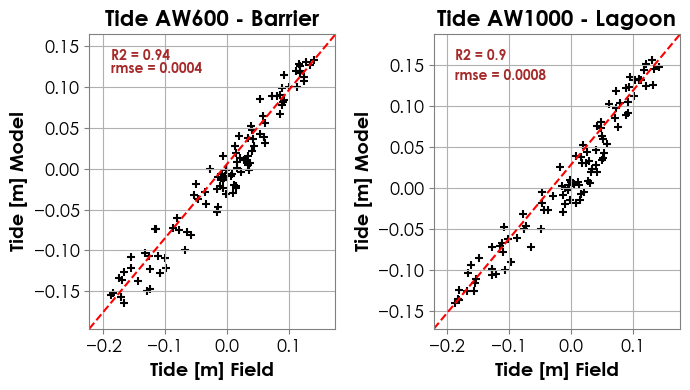

In [20]:
# Model data 
def on_change(axes):
    # When this function is called it checks the current
    # values of xlim and ylim and modifies diag_line
    # accordingly.
    ax = axes
    x_lims = ax.get_xlim()
    y_lims = ax.get_ylim()
    diag_line.set_data(x_lims, y_lims)


fig, axs = plt.subplots(1,2, figsize =(7,4))
ax = axs[0]
ax.scatter(df_field_model_northeast['waterlevel_x'], df_field_model_northeast['waterlevel_y'], label ='Field', color = 'k', marker='+')
diag_line, = ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c="r")
ax.annotate('R2 = '+str(np.round(r2_ne_wl,2)),xy=(np.min(df_field_model_northeast['waterlevel_x']), np.max(df_field_model_northeast['waterlevel_y'])), fontweight = 'bold', color = 'brown')
ax.annotate('rmse = '+str(np.round(rmse_ne_wl,4)),xy=(np.min(df_field_model_northeast['waterlevel_x']), np.max((df_field_model_northeast['waterlevel_y'].sort_values()[0:-7]))), fontweight = 'bold', color = 'brown')
ax.callbacks.connect('xlim_changed', on_change(ax))
ax.callbacks.connect('ylim_changed', on_change(ax))
ax.set_xlabel ('Tide [m] Field',size=14,fontweight = 'bold')
ax.set_ylabel ('Tide [m] Model',size=14,fontweight = 'bold')
ax.set_title('Tide AW600 - Barrier',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
ax1.scatter(df_field_model_west['waterlevel_x'], df_field_model_west['waterlevel_y'], label ='Field', color = 'k', marker='+' )
diag_line, = ax1.plot(ax1.get_xlim(), ax1.get_ylim(), ls="--", c="r")
ax1.callbacks.connect('xlim_changed', on_change(ax1))
ax1.callbacks.connect('ylim_changed', on_change(ax1))
ax1.annotate('R2 = '+str(np.round(r2_w_wl,2)),xy=(np.min(df_field_model_west['waterlevel_x']), np.max(df_field_model_west['waterlevel_y'])), fontweight = 'bold', color = 'brown')
ax1.annotate('rmse = '+str(np.round(rmse_w_wl,4)),xy=(np.min(df_field_model_west['waterlevel_x']), np.max((df_field_model_west['waterlevel_y'].sort_values()[0:-7]))), fontweight = 'bold', color = 'brown')
ax1.set_ylabel ('Tide [m] Model',size=14,fontweight = 'bold')
ax1.set_xlabel ('Tide [m] Field',size=14,fontweight = 'bold')
ax1.set_title('Tide AW1000 - Lagoon',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)
    
fig.tight_layout()
plt.subplots_adjust(wspace=0.4)
plt.subplots_adjust(hspace=0.2)

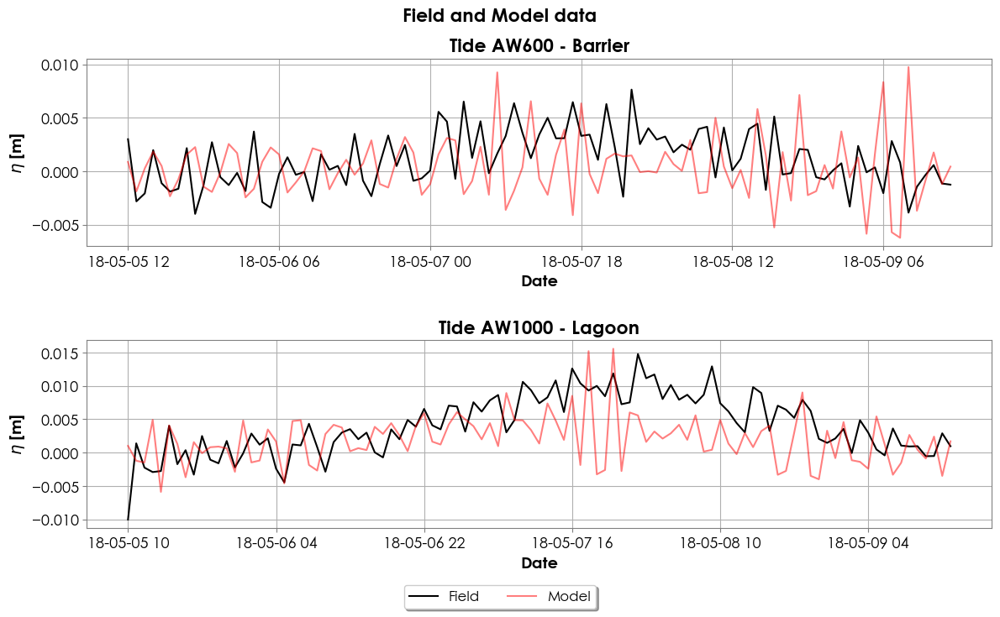

In [21]:
fig, axs = plt.subplots(2,1, figsize =(12,7))
ax = axs[0]
ticklabels = df_field_model_northeast.index[::18] # Vector of times
ax.plot(df_field_model_northeast['meteo_tide_x'], label ='Field', color = 'k' )
ax.plot(df_field_model_northeast['meteo_tide_y'], label = 'Model', color = 'red', alpha = 0.5)
ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('$\eta$ [m]',size=14,fontweight = 'bold')
ax.set_xlabel ('Date',size=14,fontweight = 'bold')
ax.set_title('Tide AW600 - Barrier',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)


ax1 = axs[1]
ticklabels = df_field_model_west.index[::18]
ax1.plot(df_field_model_west['meteo_tide_x'], color = 'k' )
ax1.plot(df_field_model_west['meteo_tide_y'], color = 'red', alpha = 0.5)
ax1.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax1.xaxis.set_major_formatter(date_format)
ax1.set_ylabel ('$\eta$ [m]',size=14,fontweight = 'bold')
ax1.set_xlabel ('Date',size=14,fontweight = 'bold')
ax1.set_title('Tide AW1000 - Lagoon',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)

fig.suptitle("Field and Model data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01), fancybox=True, shadow=True, ncol=4, fontsize = 12)
fig.tight_layout()
plt.subplots_adjust(wspace=0.6)
plt.subplots_adjust(hspace=0.5)

## WAVE DATA

In [22]:
def wavelength(T,h):
    '''
    Función para determinar la longitud de ola
    -----------
    Parametros de entrada
    T: Periodo de ola 
    h: Profunidad
    -----------
    Returns: 
    L1: Longitud de ola
    '''
    #Función que calcula L en aguas intermedias
    Lo = (9.81*T**2)/(2*np.pi);
    L1  = (9.81*T**2)/(2*np.pi)*np.tanh((h*2*np.pi)/Lo);
    i = 0;
    while (abs(Lo-L1)>0.0001):
        Lo = L1;
        L1  = (9.81*T**2)/(2*np.pi)*np.tanh(h*2*np.pi/Lo);
        i = i+1;
        if (i>5000):
            break
    return (L1)


def SpectraBurstOCEANLYZ(burst,fs,num_perseg_FFT,heightfrombed,fmin,fmax,maxcutoff,pressureattenuation,tailcorrection,tailpower):
    """  
    SpectraBurstOCEANLYZ
    ==============
    Hm0,Tm01,Tm02,Tp,fp,f,Syy=SpectraOCEANLYZ_burst(burst,fs,num_perseg_FFT,heightfrombed,fmin,fmax,maxcutoff,pressureattenuation,tailcorrection,tailpower)
    
    DESCRIPTION
    -----------
    Calculate wave properties from a depth burst using power spectral density
    -----------------------------------------------------------------------
    INPUT
    -----
    - burst=burst_depth  -------->    Water depth burst in (meters)
    - fs=2  -------------------->     Sampling frequency that data collected at in (Hz)
    - num_perseg_FFT=256 -------->    Number of elements in each segment window to perform the FFT. 
                                    Recommended: 256 for RBR - 128 for AQ. Overlap equals num_perseg_FFT/2 
                                    Longitude of frequencies array equal to num_perseg_FFT/2 + 1 
    - heightfrombed=0.05 -------->    Sensor height from bed
    - fmin=0.08 ----------------->    Minimum frequency for cut off the lower part of spectra
    - fmax=0.95 ----------------->    Maximum frequency for cut off the upper part of spectra

    - maxcutoff='on' ----------->     Define if to cut off the spectra beyond fmax
                                        maxcutoff='off': Cutoff off
                                        maxcutoff='on': Cutoff on

    - pressureattenuation="all" ->    Define if to apply pressure attenuation factor or not
                                        pressureattenuation='off': No pressure attenuation applied
                                        pressureattenuation='on': Pressure attenuation applied without correction after fmaxpcorr
                                        pressureattenuation='all': Pressure attenuation applied with constant correction after fmaxpcorr

    - tailcorrection='tma' ------>    Define if to apply diagnostic tail correction or not 
                                        tailcorrection='off': Not apply
                                        tailcorrection='jonswap': JONSWAP Spectrum tail  - deep water 
                                        tailcorrection='tma': TMA Spectrum tail - shallow and intermediate water
    - tailpower=-4 -------------->    Power that diagnostic tail apply based on that (-3 for shallow water to -5 for deep water)
    -------------------------------------------------------------------------------------
    OUTPUT
    ------
    - Hm0 = Zero-Moment Wave Height (m)
    - Tm01 = Wave Period from m01 (second), Mean Wave Period
    - Tm02 = Wave Period from m02 (second), Mean Zero Crossing Period
    - Tp = Peak Wave Period (second)
    - fp = Peak Wave Frequency (Hz)
    - f = Frequency (Hz)
    - Syy = Wave Surface Elevation Power Spectrum (m^2/Hz)

    EXAMPLE

    - Hm0,Tm01,Tm02,Tp,fp,f,Syy=SpectraOCEANLYZ_burst(water_pressure/(1000*9.81),2,256,0.05,0.08,0.95,1,'on','all','tma',-3)

    """

    #==========================================================================

    #CODE
    ## -------------------------------- Import required packages -------------------------------- ##

    import numpy as np
    import scipy as sp
    import pandas as pd
    from scipy import signal

    ## -------------------------------- Calculating spectral moments -------------------------------- ##

    input1=sp.signal.detrend(burst) # deterending
    f1, Syy_half = sp.signal.welch(input1,fs=fs,nperseg=num_perseg_FFT)    # Fast Fourier transform
    f1, Syy_half = f1[1:-1], Syy_half[1:-1] 
    Syy_half[f1 < fmin] = 0
    if maxcutoff=='on':
        Syy_half[f1>fmax]=0

    ## ------------------------------- Estimation of wave number (k) -------------------------------- ##

    h = burst.mean() + heightfrombed
    w = 2*np.pi*f1
    k = np.zeros(len(f1))
    for _ in range(len(f1)):
        k[_] = (2*np.pi)/wavelength(1/f1[_],h)
    k[w == 0] = 0

    ## -------------------------- Calculation of pressure response factor (Kp) ---------------------- ##

    Kp=np.cosh(k*heightfrombed)/np.cosh(k*h)
    kmaxL=np.pi/(h-heightfrombed) # Wave number associated with fmaxpcorrL
    KpminL=np.cosh(kmaxL*heightfrombed)/np.cosh(kmaxL*h) # Minimum Limit for K_p calculated based on linear wave theory
    fmaxpcorrL=1/(2*np.pi)*np.sqrt(9.81*kmaxL*np.tanh(kmaxL*h)) # Maximum frequency that K_p can be applied, calculated from linear wave theory
    Kp[Kp < KpminL] = KpminL # Check to avoid large amplification, Kp should be larger than minimum K_p calculated based on linear wave theory

    ## -------------------------- Automatically estimating fmaxpcorr and ftailcorrection ---------------------- ##

    fminpcorr = fmin
    locfminpcorr=int(np.max((np.nonzero(f1<=fminpcorr))[0])) #Locating the location of fminpcorr (fmaxpcorr should be larger than fminpcorr)
    locSyymax=np.argmax(Syy_half[locfminpcorr:]) # Locating the peak frequency, fp, of original dataset
    locfmaxpcorrL=int(np.max((np.nonzero(f1<=fmaxpcorrL))[0])) #Location the location of fmaxpcorr1
    if (locfmaxpcorrL<locfminpcorr+(locSyymax)): 
        locfmaxpcorrL=locfminpcorr+(locSyymax) #Check if locfmaxpcorrL located after fp
    Syy1=Syy_half/(Kp**2)
    locSyymin=np.argmin(Syy1[locfminpcorr+(locSyymax):locfmaxpcorrL+1]) #Locating the location of minimum value for Syy between fp and fmaxpcorr1
    locfmaxpcorr = locfminpcorr+(locSyymax)+(locSyymin)
    fmaxpcorr=f1[locfmaxpcorr] #Asigning the frequency of the location of minimum value for Syy between fp and fmaxpcorr1
    ftailcorrection=f1[locfminpcorr+(locSyymax)+(locSyymin)]
    if (fmaxpcorr>fmaxpcorrL): 
        fmaxpcorr=fmaxpcorrL #Check fmaxpcorr1 be smaller than fmaxpcorrL
        ftailcorrection=fmaxpcorrL
    if ((fmaxpcorrL>f1[locfminpcorr+(locSyymax)]) and (fmaxpcorr==f1[locfminpcorr+(locSyymax)]) ): 
        fmaxpcorr=fmaxpcorrL #if fmaxpcorrL>fp then fmaxpcorr1 should not be equal to fp

    ## ------------------------------------ Choice of correction method for Kp -------------------------------- ##     

    if pressureattenuation=='off':
            Kp[0:]=1

    elif pressureattenuation=='on':
        Kp[f1>fmaxpcorr]=1 # correction factor larger than fmaxpcorr should be 1 (no correction)
        # linear decrease of correction for f larger than maximum frequency
        loc1=int(np.max((np.nonzero(f1<=fmaxpcorr-0.05))[0]))
        loc2=int(np.max((np.nonzero(f1<=fmaxpcorr+0.05))[0]))
        if (loc2>len(f1)): loc2=len(f1)
        for i in range(loc1,loc2+1,1):
            Kp[i]=(Kp[loc2]-Kp[loc1])/(loc2-loc1)*(i-loc1)+Kp[loc1]

    elif pressureattenuation=='all':
        loc2=int(np.max((np.nonzero(f1<=fmaxpcorr))[0]))
        if (loc2>len(f1)): loc2=len(f1)
        Kp[f1>fmaxpcorr]=Kp[loc2] # correction factor larger than fmaxpcorr stays constant


    ## ----------------------------------------- Applying tail correction ------------------------------------- ## 

    Syy = Syy_half/Kp**2
    f = f1
    deltaf = f[1]-f[0]

    #Index of ftailcorrection
    if tailcorrection=='jonswap' or tailcorrection=='tma':
        Indxftail=int(np.min((np.nonzero(f>=ftailcorrection))[0]))

    #Applying diagnostic frequency tail based on JONSWAP after fmax
    if tailcorrection=='jonswap':
        
        Syy[f>ftailcorrection]=Syy[Indxftail]*(f[f>ftailcorrection]/ftailcorrection)**tailpower #Adding diagnostic tail
        Syy[Syy<0]=0 #Syy can not be negative

    #Applying diagnostic frequency tail based on TMA after fmax
    elif tailcorrection=='tma':
        
        omega=2*np.pi*f*np.sqrt(h/9.81)

        #Transformation function from JONSWAP into TMA, approximated method
        PHI=np.ones(len(omega))
        PHI[omega<=1]=omega[omega<=1]**2/2
        PHI[((omega>1) & (omega<2))]=1-0.5*(2-omega[((omega>1) & (omega<2))])**2
        PHI[omega>=2]=1
        
        Syy[f>ftailcorrection]=Syy[Indxftail]*(PHI[f>ftailcorrection]/PHI[Indxftail])*(f[f>ftailcorrection]/ftailcorrection)**tailpower #Adding TMA Spectrum tail
        Syy[Syy<0]=0 #Syy can not be negative

    ## ---------------------------- Calculating spectral moments and wave properties ------------------------ ## 

    m0=np.sum(Syy*f**0*deltaf)
    m1=np.sum(Syy*f**1*deltaf)
    m2=np.sum(Syy*f**2*deltaf)

    #calculating wave properties
    Hm0=4.004*np.sqrt(m0) #Zero-Moment wave height
    Tm01=m0/m1 #mean period
    Tm02=(m0/m2)**0.5 #zero crossing period

    #calculation peak period
    loc4=np.argmax(Syy)
    Tp=1/f[loc4] #peak period

    #calculating peak frequency from weighted integral (Young, 1995)
    fp=(np.sum(Syy**5*f**1*deltaf))/(np.sum(Syy**5*f**0*deltaf)) #peak frequency

    ## ----------------------------------------------- Outputs ------------------------------------------- ## 

    return Hm0,Tm01,Tm02,Tp,fp,f,Syy

    ## -----------------------------------------------          ------------------------------------------- ##


def SpectraSeriesOCEANLYZ(df,duration,fs,num_perseg_FFT,heightfrombed,fmin,fmax,maxcutoff,pressureattenuation,tailcorrection,tailpower):

    """  
    SpectraSeriesOCEANLYZ
    ==============
    Hm0,Tm01,Tm02,Tp,fp,f,Syy=SpectraOCEANLYZ_burst(burst,fs,num_perseg_FFT,heightfrombed,fmin,fmax,maxcutoff,pressureattenuation,tailcorrection,tailpower)
    
    DESCRIPTION
    -----------
    Calculate wave properties from a depth burst using power spectral density
    -------------------------------------------------------------------------
    INPUT
    -----
    - df=df_RBR  ---------------->    Clean dataframe with times, pressure and depth (Index=Time - Cols = Pres, Depth)
    - duration=1024  ------------>    Duration time that data collected in input in each burst in (second) 
    - fs=2  -------------------->     Sampling frequency that data collected at in (Hz)
    - num_perseg_FFT=256 -------->    Number of elements in each segment window to perform the FFT. 
                                    Recommended: 256 for RBR - 128 for AQ. Overlap equals num_perseg_FFT/2 
                                    Longitude of frequencies array equal to num_perseg_FFT/2 + 1 
    - heightfrombed=0.05 -------->    Sensor height from bed
    - fmin=0.08 ----------------->    Minimum frequency for cut off the lower part of spectra
    - fmax=0.95 ----------------->    Maximum frequency for cut off the upper part of spectra

    - maxcutoff='on' ----------->     Define if to cut off the spectra beyond fmax
                                        maxcutoff='off': Cutoff off
                                        maxcutoff='on': Cutoff on

    - pressureattenuation="all" ->    Define if to apply pressure attenuation factor or not
                                        pressureattenuation='off': No pressure attenuation applied
                                        pressureattenuation='on': Pressure attenuation applied without correction after fmaxpcorr
                                        pressureattenuation='all': Pressure attenuation applied with constant correction after fmaxpcorr

    - tailcorrection='tma' ------>    Define if to apply diagnostic tail correction or not 
                                        tailcorrection='off': Not apply
                                        tailcorrection='jonswap': JONSWAP Spectrum tail  - deep water 
                                        tailcorrection='tma': TMA Spectrum tail - shallow and intermediate water
    - tailpower=-4 -------------->    Power that diagnostic tail apply based on that (-3 for shallow water to -5 for deep water)
    ---------------------------------------------------------------------------------------------------------------------
    OUTPUT
    ------
    - Hm0 = Zero-Moment Wave Height (m)
    - Tm01 = Wave Period from m01 (second), Mean Wave Period
    - Tm02 = Wave Period from m02 (second), Mean Zero Crossing Period
    - Tp = Peak Wave Period (second)
    - fp = Peak Wave Frequency (Hz)
    - f = Frequency (Hz)
    - Syy = Wave Surface Elevation Power Spectrum (m^2/Hz)

    EXAMPLE

    dict_waveparms=SpectraSeriesOCEANLYZ(df_RBR,1024,2,256,0.05,0.08,0.95,1,'on','all','tma',-3)

    """

    #==========================================================================

    #CODE
    ## -------------------------------- Import required packages --------------------------------- ##

    import numpy as np
    import scipy as sp
    import pandas as pd
    from scipy import signal
    
    ## ---------------------------------- Create arrays to fill ---------------------------------- ##

    Hm0 = np.zeros(int(df.shape[0]/(duration*fs)))
    Tm01 = np.copy(Hm0)
    Tm02 = np.copy(Hm0)
    Tp = np.copy(Hm0)
    fp = np.copy(Hm0)
    f = np.zeros([int(df.shape[0]/(duration*fs)),int((num_perseg_FFT/2)-1)])
    Syy = np.copy(f)

    time_bursts = df.index[0:-1:duration*fs]
    depth_burst = df["Depth"].values.reshape(int(df.shape[0]/(duration*fs)),int(duration*fs)).T

    for _ in range(len(time_bursts)):
      # print(_)
      data_burst = SpectraBurstOCEANLYZ(depth_burst[:,_],fs,num_perseg_FFT,heightfrombed,fmin,fmax,maxcutoff,pressureattenuation,tailcorrection,tailpower)
      Hm0[_] = data_burst[0]
      Tm01[_] = data_burst[1]
      Tm02[_] = data_burst[2]
      Tp[_] = data_burst[3]
      fp[_] = data_burst[4]
      f[_,:] = data_burst[5]
      Syy[_,:] = data_burst[6]

    wave_prop = {"Hm0":Hm0,"Tm01":Tm01,"Tm02":Tm02,"Tp":Tp,"fp":fp,"f":f,"Syy":Syy,"Times":time_bursts}         

    ## ------------------------------------------ Outputs -------------------------------------- ## 

    return wave_prop

    ## ------------------------------------------          -------------------------------------- ##


def fig_waves(figsize, df1, sensor1, variable,  coef_tikslabels ,rotation, compare_two:bool, df2= None, sensor2 = None):
    """
    Inputs: 
    - df1: dataframe del sensor 1
    - compare_two: compara la misma variable en dos sensores
    - df2: dataframe del sensor 2
    - variable: variable a dibujar 'Hm0'/'Tp'
    - sensor1 : nombre del punto uno
    - sensor2: nombre del putno 2
    - coef_tickslabels: coeficiente para distribur los tickslabels del tiempo
    - rotation: angulo de rotación en deg para ajustar los tickslabels
    -------------------------------------------------------------------
    Outputs: 
    - figuras 
    """
    fig, ax = plt.subplots(figsize = figsize)

    ticklabels = df1.index[::coef_tikslabels]
    ax.set_xticks(ticklabels)
    date_format = mdates.DateFormatter('%y-%m-%d %H')
    ax.xaxis.set_major_formatter(date_format)
    if variable ==  'Hs':
        ax.plot(df1[variable], label = sensor1, ls = '-', color ='#8ABB73', lw = 2 )
        if compare_two == True:
            ax.plot(df2[variable], label = sensor2, ls = '-', c ='#22467F', lw = 2 )
        title = 'Significant wave height'
        name_label = 'H$_{mo}$ [m]'
    elif variable == 'Tp':
        ax.plot(df1[variable],label=sensor1, color ='#8ABB73', lw = 1.5, ls = '--')
        if compare_two == True:
            ax.plot(df2[variable],label=sensor2,c ='#22467F', lw = 1.5, ls = '--')
        title = 'Peak period'
        name_label = 'T$_p$ [seg]'
    elif variable == 'Mdir':
        if sensor1 == 'AW600':
            yticks = np.arange(-11.25, 348.75 + 22.5, 22.5)
            ylabels = ['N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW', 'N']
        elif sensor1 == 'AW1000':
            yticks = np.arange(-22.5, 360-22.5+ 45, 45)
            ylabels = ['N','NE','E','SE','S','SW','W','NW', 'N']
        ax.set_yticks(yticks)
        ax.set_yticklabels(ylabels)
        ax.plot(df1[variable],label=sensor1, color ='#8ABB73', lw = 1.5, ls = ' ', marker = 'o', ms = 6, alpha = 0.5)
        ax.plot(df1[variable],color ='#8ABB73', lw = 1.5, ls = ' ', marker = 'o', ms = 3)
        if compare_two == True:
            ax.plot(df2[variable],label=sensor2,c ='#22467F', lw = 1.5, ls = ' ', marker = 'o', ms = 6, alpha = 0.5)
            ax.plot(df2[variable],c ='#22467F', lw = 1.5, ls = ' ', marker = 'o', ms = 3)
        title = 'Mean direction'
        name_label = 'Direction'
    ax.set_xlabel('Date', size = 14, fontweight = 'bold')
    ax.set_ylabel(name_label, size = 14, fontweight = 'bold')
    ax.set_title(title, size = 16, fontweight = 'bold')   
    fig_params(ax)
    fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=2, fontsize = 12)
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.2)
    plt.subplots_adjust(hspace=0.1)
    plt.xticks(rotation=rotation);

In [23]:
def data_NORTEK(path, file_name, fecha_inicio, fecha_fin):
    """
    Esta función lee el archivo .wap de los awac con el fin de crear un dataframe de los pametros del oleaje
    --------------------------------------------------------------------------------------------------------
    Input:
    -----
    - path: ruta del directorio donde se encuentra almacenado el archivo
    - file_name: nombre del archivo que se va a leer
    - fecha_inicio: fecha de inicio de los datos
    - fecha_fin: fecha final de fondeo de los datos 
    ---------------------------------------------------------------------------------------------------------
    Output:
    ------
    - df_wave_params: dataframe con columnas de Hs, Tp y Mdir (dirección media)
    """
    df_wave_params = pd.read_csv(f'{path}\{file_name}', sep = '\s+', usecols=[0, 1, 2, 3, 6, 8, 11], 
                            names= ['Month', 'Day', 'Year', 'Hour', 'Hs', 'Tp', 'Mdir'],
                            parse_dates={'Time':['Year','Month', 'Day', 'Hour']},).set_index(['Time'])
    df_wave_params['Mdir'] = pd.to_numeric(df_wave_params['Mdir'], errors = 'coerce')
    df_wave_params = df_wave_params[fecha_inicio:fecha_fin] 
    df_wave_params['time'] = df_wave_params.index
    return df_wave_params

In [24]:
def Fespectro (burst,fs,h,zp):
    """
    Paraemtros de entrada
    burst: Serie de datos sin tendencia
    fs: Frecuencia de muestreo
    h: Profundidad en el punto de muestreo
    zp: Distancia desde el fondo hasta el sensor
    ------------------------------------------------
    Parametros de Salida
    S: Densidad espectral 
    T: Periodos
    Freq: Frecuencia
    
    """
    N = len(burst)
    dt = 1/fs
    g = 9.8
    #Dens_espectral=np.ones(shape=burst.shape)*1j
    FFT = np.fft.fft(burst,N)
    Freq = np.fft.fftfreq(N,dt)
    """
    Eliminar la bajas frecuencias 
    """
    ind_FFT = np.where(np.abs(Freq>0.03))[0]
    FFT = FFT[ind_FFT]
    Freq = Freq[ind_FFT]

    # Transference factor Kp
    w = 2*np.pi*Freq
    k0 = (w**2)/g
    for i in range(0,100):
        k = (w**2)/(g*np.tanh(k0*h))
        k0 = k;
    kp = np.cosh(k*h)/np.cosh(k*zp)
    kp[kp>10]=10
    '''Densidad espectral S'''
    S = (2*dt*(np.abs(FFT)**2)/N)*(kp**2)
    T = 1/Freq
    return (S,Freq,T)

def wave_espectra(S,Freq,fs,burst):
    """
    Parametros de entrada
    burst: Serie de datos sin tendecnia
    fs: Frecuencia de muestreo 
    Freq: Frecuencia
    S: Densidad espectral
    ------------------------------------------------
    Returns:
    Hs: Altura de ola significante 
    Tp: Periodo Pico
    Tm01: Periodo medio de orden 1
    Tm02: Periodo medio de orden 2
    """
    df=fs/len(burst)
    suma= 0
    fs = 0
    ffs = 0
    for i in range (len(S)):
        suma=suma+S[i]
        fs = fs+(Freq[i]*S[i])
        ffs = ffs + ((Freq[i]**2)*S[i])
    Mo = df*suma
    M1 = fs*df
    M2 = ffs*df
    Hs=4.004*np.sqrt(Mo)
    in_max = np.where(S == np.max(S))[0][0]
    Freq_max = Freq[in_max]
    Tp = 1/(Freq_max)
    Tm01 = Mo/M1
    Tm02 = np.sqrt(Mo/M2)
    return (Hs,Tp)

In [25]:
def interpolacion_lineal(x1, y1, x2, y2, x):
    """
    Realiza una interpolación lineal para encontrar la coordenada y correspondiente al valor de x dado.
    Los puntos x1, y1 y x2, y2 definen la recta que se usará para interpolar el valor de y.
    """
    m = (y2 - y1) / (x2 - x1)  # Calcula la pendiente de la recta
    b = y1 - m * x1  # Calcula la ordenada al origen de la recta
    y = m * x + b  # Calcula el valor de y correspondiente al valor de x dado
    return y


def deg_compas(x:float,num_secciones:int ,delta:float = 22.5, ) -> float:
    """Función que devuelve los grados en función del numero de secciones de los puntos cardinales

    Parameters
    ----------
    x : float
        grado para ser convertido
    num_secciones : int
        numero de secciones que se divide los puntos cardinales
    delta : float, optional
        grados de delta, by default 22.5

    Returns
    -------
    float
        Grados convertidos
    """
    # Norte
    if ((x <= delta/2) & (x >= 0)) | ((x <= 360 ) & (x >= 360-(delta/2))):
        if ((x <= delta/2) & (x >= 0)):
            deg_new = interpolacion_lineal(x1= 0, y1= 0, x2 = delta/2, y2= delta/2, x = x)
        elif ((x <= 360 ) & (x >= 360-(delta/2))):
            deg_new = interpolacion_lineal(x1= 360-(delta/2), y1= -(delta/2), x2 = 360, y2= -0.0001, x = x)

    for i in range (0,num_secciones -1 ,1):

        if (x > delta*i+ delta/2) & (x <= (delta*(i+1)+ delta/2)):
            deg_new = interpolacion_lineal(x1 = delta*i+ delta/2 +0.0001, y1= delta*i+ delta/2 + 0.0001
                                           , x2 = delta*(i+1)+ delta/2, y2 = delta*(i+1)+ delta/2, x = x)
    return deg_new

### Field data

In [26]:
# ______________________________________________AW600_________________________________________________ 
paths_aw600 = glob.glob(r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\VALIDACION_PALOMA\AW1_600\*.WAD")
paths_aw600 = sorted(paths_aw600)
df_aw600, time_aw600 = class_field_db_AW600.waves(paths=paths_aw600, samples= 1024, 
                                    fecha_inicio=datetime.datetime(2018,5,5,12,0,0), 
                                    fecha_fin=datetime.datetime(2018,5,10,9,0,0))
dic_AW600 = SpectraSeriesOCEANLYZ(df = df_aw600['Depth'].to_frame('Depth'), duration= 1024, fs = 1, 
                                    num_perseg_FFT= 64, heightfrombed= 1.2, fmin= 0.03, 
                                    fmax = 0.5, maxcutoff= 'off', pressureattenuation='all', 
                                    tailcorrection='off', tailpower= -3)


#_____________________________________________AW1000__________________________________________________
paths_aw1000 = glob.glob(r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\VALIDACION_PALOMA\AW2_1000\*.wad")
paths_aw1000 = sorted(paths_aw1000)
df_aw1000, time_aw1000 = class_field_db_AW1000. waves(paths=paths_aw1000, samples= 2048, 
                                    fecha_inicio=datetime.datetime(2018,5,5,10,0,0), 
                                    fecha_fin=datetime.datetime(2018,5,10,8,0,0))
dic_AW1000 = SpectraSeriesOCEANLYZ(df = df_aw1000['Depth'].to_frame('Depth'), duration= 1024, fs = 2, 
                                    num_perseg_FFT= 128, heightfrombed= 1, fmin= 0.03, 
                                    fmax = 1, maxcutoff= 'off', pressureattenuation='all', 
                                    tailcorrection='on', tailpower= -4)

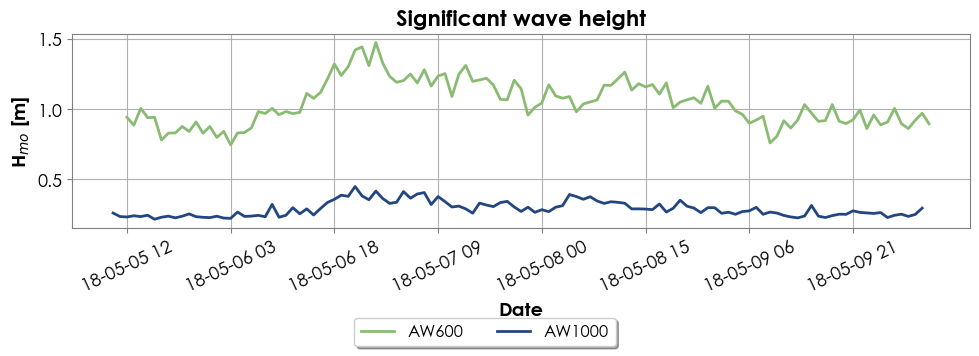

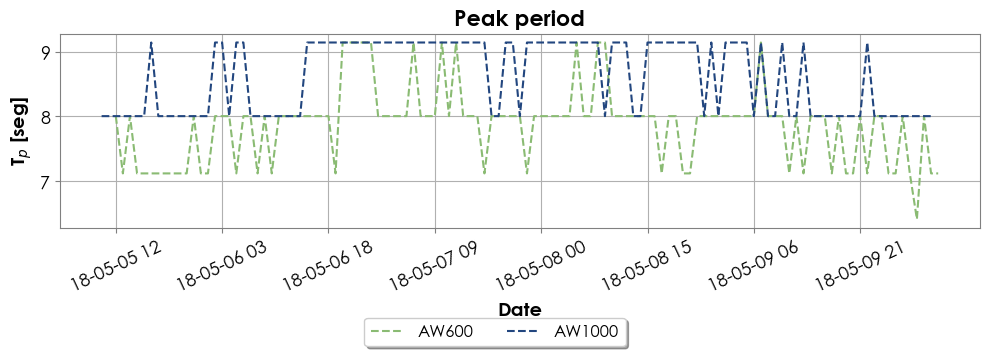

In [27]:
# ___________Data Frame de los datos de campo_______________________
df_wave_aw600_field = pd.DataFrame({'Hs':dic_AW600['Hm0'], 'Tp':dic_AW600['Tp']})
df_wave_aw600_field.set_index(time_aw600, inplace=True)
df_wave_aw600_field['time'] = df_wave_aw600_field.index
df_wave_aw1000_field = pd.DataFrame({'Hs':dic_AW1000['Hm0'], 'Tp':dic_AW1000['Tp']})
df_wave_aw1000_field.set_index(time_aw1000, inplace=True)
df_wave_aw1000_field['time'] = df_wave_aw1000_field.index

fig_waves(figsize = (10,3), df1 = df_wave_aw600_field, sensor1 = 'AW600' , variable = 'Hs', 
        coef_tikslabels = 15 ,rotation = 25, compare_two = True, df2 = df_wave_aw1000_field , sensor2 = 'AW1000')

fig_waves(figsize = (10,3), df1 = df_wave_aw600_field, sensor1 = 'AW600' , variable = 'Tp', 
        coef_tikslabels = 15 ,rotation = 25, compare_two = True, df2 = df_wave_aw1000_field , sensor2 = 'AW1000')

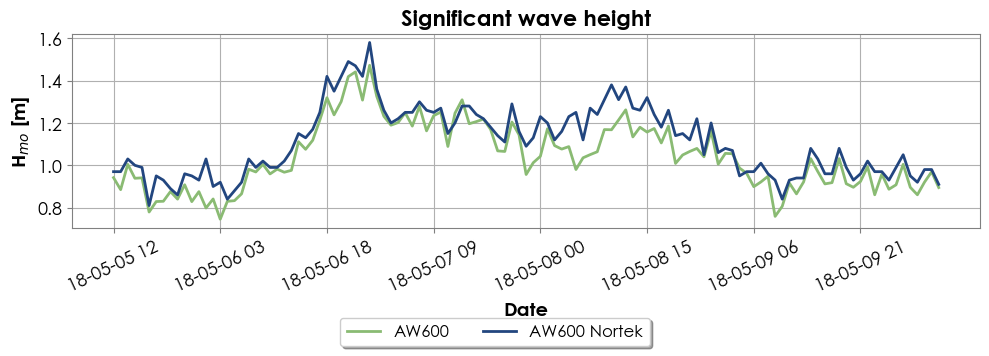

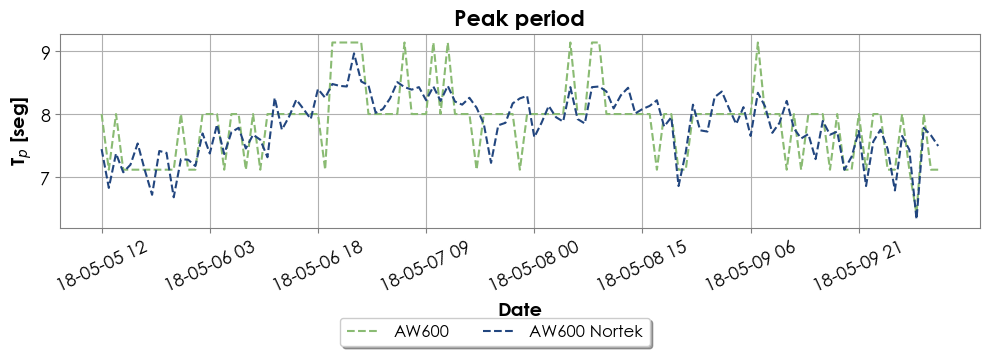

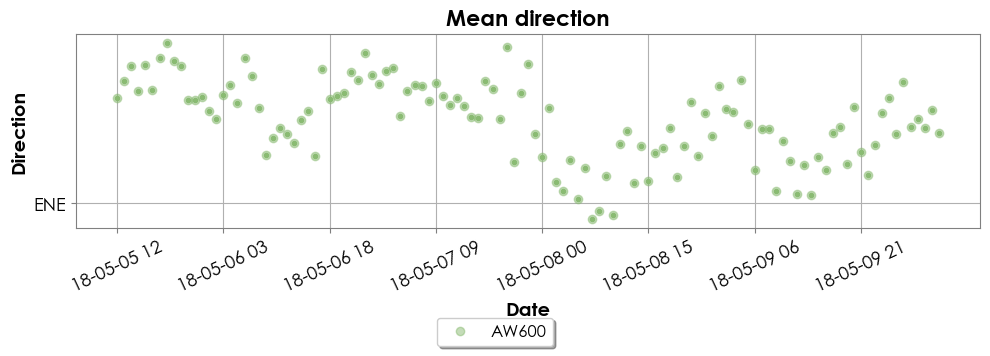

In [28]:
path = r'G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\VALIDACION_PALOMA\procesados_JDOC\AW600_MLM'
file_name = 'AW_600.wap'
fecha_inicio=datetime.datetime(2018,5,5,12,0,0) 
fecha_fin=datetime.datetime(2018,5,10,8,0,0)
df_nortek_aw600 = data_NORTEK(path= path, file_name= file_name, fecha_inicio= fecha_inicio, fecha_fin=fecha_fin )
df_nortek_aw600['Mdir'] = df_nortek_aw600['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))

fig_waves(figsize = (10,3), df1 = df_wave_aw600_field, sensor1 = 'AW600' , variable = 'Hs', 
        coef_tikslabels = 15 ,rotation = 25, compare_two = True, df2 = df_nortek_aw600 , sensor2 = 'AW600 Nortek')
fig_waves(figsize = (10,3), df1 = df_wave_aw600_field, sensor1 = 'AW600' , variable = 'Tp', 
        coef_tikslabels = 15 ,rotation = 25, compare_two = True, df2 =df_nortek_aw600 , sensor2 = 'AW600 Nortek')
fig_waves(figsize = (10,3), df1 = df_nortek_aw600, sensor1 = 'AW600' , variable = 'Mdir', 
        coef_tikslabels = 15 ,rotation = 25, compare_two = False)

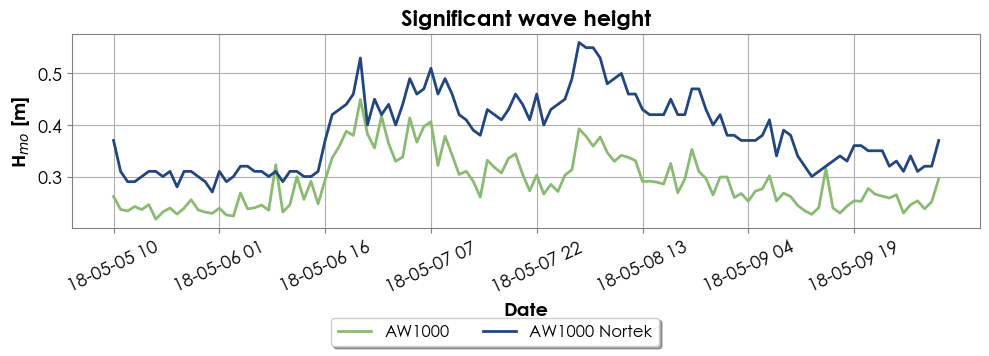

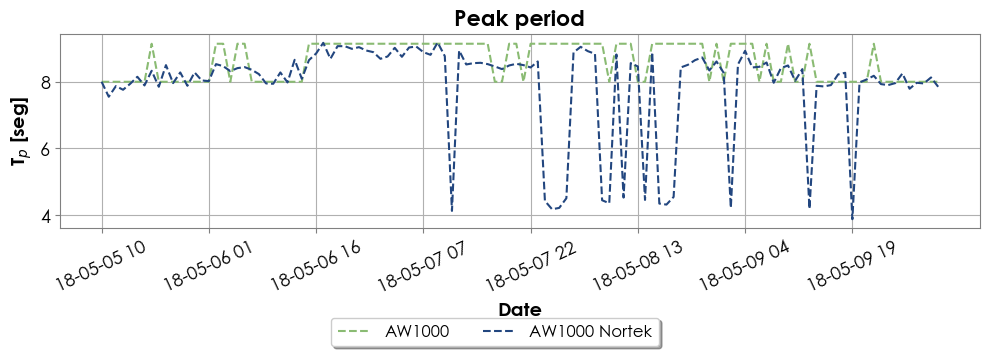

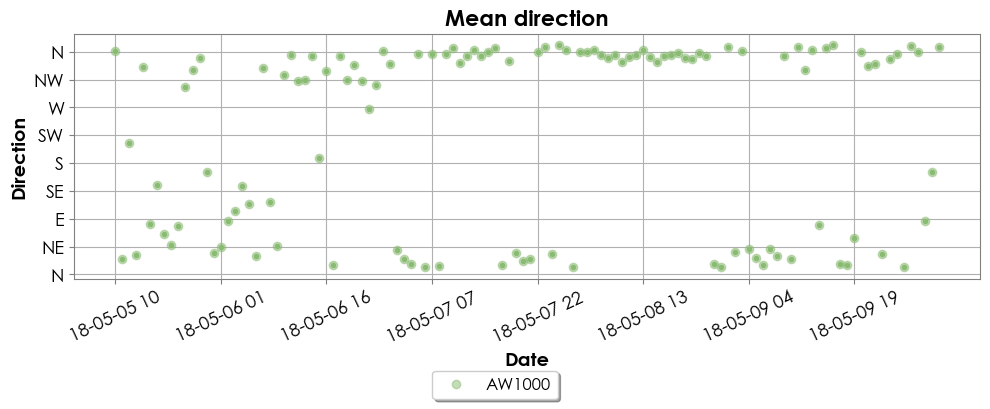

In [29]:
path = r'G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\VALIDACION_PALOMA\procesados_JDOC\AW1000_MLM'
file_name = 'AW_1000.wap'
fecha_inicio=datetime.datetime(2018,5,5,10,0,0) 
fecha_fin=datetime.datetime(2018,5,10,7,0,0)
df_nortek_aw1000 = data_NORTEK(path= path, file_name= file_name, fecha_inicio= fecha_inicio, fecha_fin=fecha_fin )
df_nortek_aw1000['Mdir'] = df_nortek_aw1000['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))

fig_waves(figsize = (10, 3),df1 = df_wave_aw1000_field, sensor1 = 'AW1000' , variable = 'Hs', 
        coef_tikslabels = 15 ,rotation = 25, compare_two = True, df2 = df_nortek_aw1000 , sensor2 = 'AW1000 Nortek')
fig_waves(figsize = (10, 3),df1 = df_wave_aw1000_field, sensor1 = 'AW1000' , variable = 'Tp', 
        coef_tikslabels = 15 ,rotation = 25, compare_two = True, df2 =df_nortek_aw1000 , sensor2 = 'AW1000 Nortek')
fig_waves(figsize = (10, 3.5),df1 = df_nortek_aw1000, sensor1 = 'AW1000' , variable = 'Mdir', 
        coef_tikslabels = 15 ,rotation = 25, compare_two = False)

### Model Data

In [68]:
# ____________________Data Frame de los datos del modelo_______________________
df_wave_aw600_model = class_db_model_northeast.wave()
df_wave_aw600_model['time'] = df_wave_aw600_model.index
df_wave_aw600_model = df_wave_aw600_model[1:].reset_index(drop=True)
df_wave_aw600_model['Mdir'] = df_wave_aw600_model['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))

df_wave_aw1000_model = class_db_model_west.wave()
df_wave_aw1000_model['time'] = df_wave_aw1000_model.index
df_wave_aw1000_model = df_wave_aw1000_model[1:].reset_index(drop=True)
df_wave_aw1000_model['Mdir'] = df_wave_aw1000_model['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))


# ____________________Merge entre los datos de campo y del modelo___________________
# df_wave_aw600_field.insert(2, 'Mdir', df_nortek_aw600['Mdir'])
# df_wave_aw1000_field.insert(2, 'Mdir', df_nortek_aw1000['Mdir'])
df_field_model_aw600_2 = pd.merge(df_wave_aw600_field, df_wave_aw600_model, on = 'time').set_index('time')
df_field_model_aw1000_2 = pd.merge(df_wave_aw1000_field, df_wave_aw1000_model, on = 'time').set_index('time')

### Plots y análisis

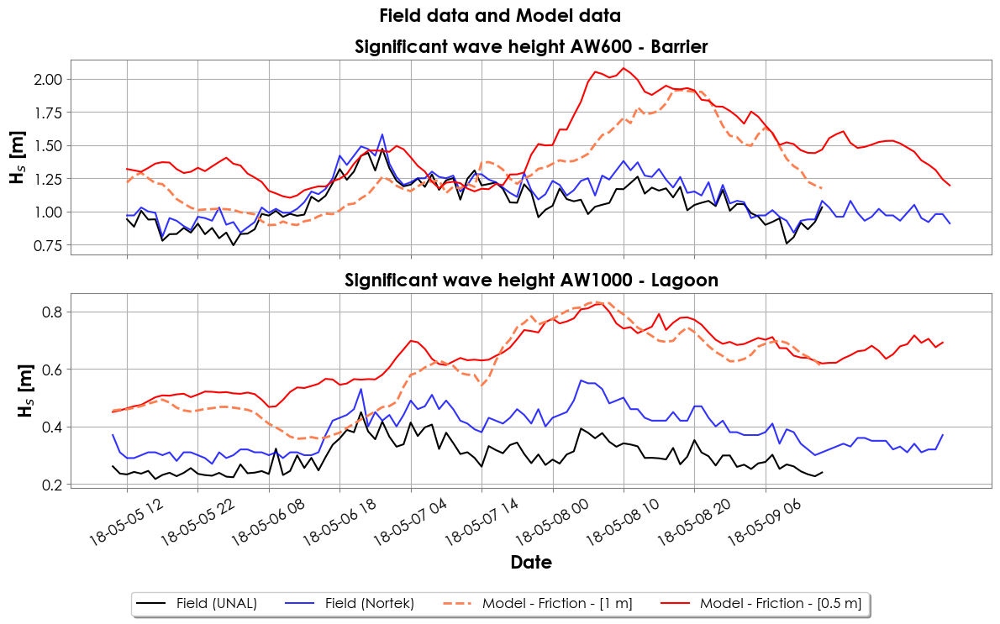

In [69]:
# Model data 
fig, axs = plt.subplots(2,1, figsize =(12,7), sharex = True)
ax = axs[0]
ticklabels = df_field_model_aw600.index[::10]
ax.plot(df_field_model_aw600['Hs_x'], label ='Field (UNAL)', color = 'k' )
ax.plot(df_nortek_aw600['Hs'],label = 'Field (Nortek)' ,color = 'blue', alpha = 0.8)
ax.plot(df_field_model_aw600['Hs_y'], label = 'Model - Friction - [1 m]', color = 'coral', lw = 2, ls = '--')
ax.plot(df_field_model_aw600_2['Hs_y'], label = 'Model - Friction - [0.5 m]', color = 'red', lw = 1.5)

# ax.plot(df_field_model_aw600_V1['Hs_y'], label = 'Model Diff', color = 'blue', alpha = 0.8)

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('H$_s$ [m]',size=16,fontweight = 'bold')
ax.set_title('Significant wave height AW600 - Barrier',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
ax1.plot(df_field_model_aw1000['Hs_x'],color = 'k' )
ax1.plot(df_nortek_aw1000['Hs'], color = 'blue', alpha = 0.8)
ax1.plot(df_field_model_aw1000_2['Hs_y'],color = 'red', lw = 1.5)
ax1.plot(df_field_model_aw1000['Hs_y'], color = 'coral', lw = 2, ls = '--')


# ax1.plot(df_field_model_aw1000_V1['Hs_y'],color = 'blue', alpha = 0.8)
ax1.set_ylabel ('H$_s$ [m]',size=16,fontweight = 'bold')
ax1.set_xlabel ('Date',size=16,fontweight = 'bold')
ax1.set_title('Significant wave height AW1000 - Lagoon',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)


fig.suptitle("Field data and Model data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.001),fancybox=True, shadow=True, ncol=4, fontsize = 12)
plt.xticks(rotation=30)
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)

In [32]:
# Mestricas de ajuste
# Mide el grado de ajuste 
r2_aw600 = r2_score(df_field_model_aw600['Hs_x'][:],df_field_model_aw600['Hs_y'])
r2_aw1000 = r2_score(df_field_model_aw1000['Hs_x'][:],df_field_model_aw1000['Hs_y'])

# Son errores entre mas bajo mejor
rmse_aw600 = mean_squared_error(df_field_model_aw600['Hs_x'][:],df_field_model_aw600['Hs_y'])
rmse_aw1000 = mean_squared_error(df_field_model_aw1000['Hs_x'][:],df_field_model_aw1000['Hs_y'])

print('R2 AW600: ', r2_aw600)
print('R2 AW1000: ', r2_aw1000)

print('rmse AW600: ', rmse_aw600)
print('rmse AW1000: ', rmse_aw1000)

R2 AW600:  -4.662993902529756
R2 AW1000:  -34.60440827602439
rmse AW600:  0.14732710152726738
rmse AW1000:  0.10437857065535357


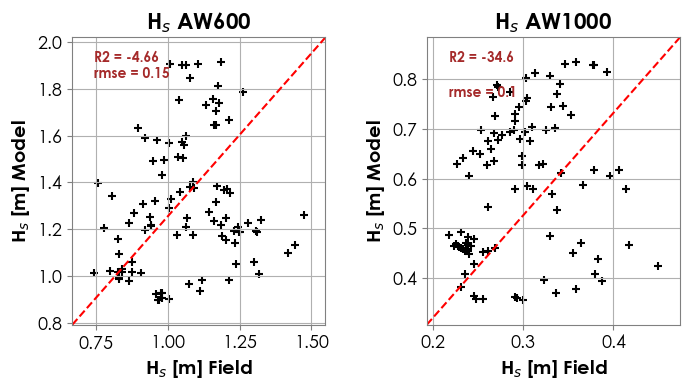

In [33]:
# Model data 
def on_change(axes):
    # When this function is called it checks the current
    # values of xlim and ylim and modifies diag_line
    # accordingly.
    ax = axes
    x_lims = ax.get_xlim()
    y_lims = ax.get_ylim()
    diag_line.set_data(x_lims, y_lims)


fig, axs = plt.subplots(1,2, figsize =(7,4))
ax = axs[0]
ax.scatter(df_field_model_aw600['Hs_x'], df_field_model_aw600['Hs_y'], label ='Field', color = 'k', marker='+')
diag_line, = ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c="r")

ax.annotate('R2 = '+str(np.round(r2_aw600,2)),xy=(np.min(df_field_model_aw600['Hs_x']), np.max(df_field_model_aw600['Hs_y'])), fontweight = 'bold', color = 'brown')
ax.annotate('rmse = '+str(np.round(rmse_aw600,2)),xy=(np.min(df_field_model_aw600['Hs_x']), np.max((df_field_model_aw600['Hs_y'].sort_values()[0:-5]))), fontweight = 'bold', color = 'brown')

ax.callbacks.connect('xlim_changed', on_change(ax))
ax.callbacks.connect('ylim_changed', on_change(ax))
ax.set_xlabel ('H$_s$ [m] Field',size=14,fontweight = 'bold')
ax.set_ylabel ('H$_s$ [m] Model',size=14,fontweight = 'bold')
ax.set_title('H$_s$ AW600',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
ax1.scatter(df_field_model_aw1000['Hs_x'], df_field_model_aw1000['Hs_y'], label ='Field', color = 'k', marker='+' )
diag_line, = ax1.plot(ax1.get_xlim(), ax1.get_ylim(), ls="--", c="r")
ax1.callbacks.connect('xlim_changed', on_change(ax1))
ax1.callbacks.connect('ylim_changed', on_change(ax1))
ax1.annotate('R2 = '+str(np.round(r2_aw1000,2)),xy=(np.min(df_field_model_aw1000['Hs_x']), np.max(df_field_model_aw1000['Hs_y'])), fontweight = 'bold', color = 'brown')
ax1.annotate('rmse = '+str(np.round(rmse_aw1000,2)),xy=(np.min(df_field_model_aw1000['Hs_x']), np.max((df_field_model_aw1000['Hs_y'].sort_values()[0:-13]))), fontweight = 'bold', color = 'brown')
ax1.set_ylabel ('H$_s$ [m] Model',size=14,fontweight = 'bold')
ax1.set_xlabel ('H$_s$ [m] Field',size=14,fontweight = 'bold')
ax1.set_title('H$_s$ AW1000',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)

fig.tight_layout()
plt.subplots_adjust(wspace=0.4)
plt.subplots_adjust(hspace=0.2)

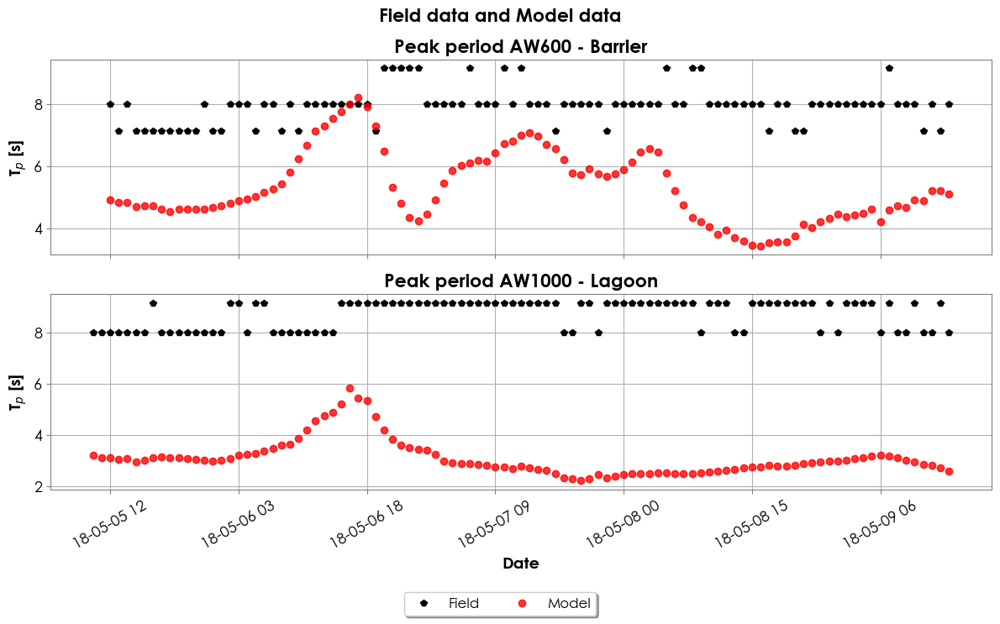

In [34]:
# Model data 
fig, axs = plt.subplots(2,1, figsize =(12,7), sharex = True)
ax = axs[0]
ticklabels = df_wave_aw600_field.index[::15]
ax.plot(df_field_model_aw600['Tp_x'], label ='Field', color = 'k' , ls = ' ', marker = 'p')
ax.plot(df_field_model_aw600['Tp_y'], label = 'Model', color = 'red', alpha = 0.8, ls = ' ', marker = 'o')

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('T$_p$ [s]',size=14,fontweight = 'bold')
ax.set_title('Peak period AW600 - Barrier',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
ax1.plot(df_field_model_aw1000['Tp_x'],color = 'k' , ls = ' ',  marker = 'p')
ax1.plot(df_field_model_aw1000['Tp_y'],color = 'red', alpha = 0.8, ls = ' ', marker = 'o')

ax1.set_ylabel ('T$_p$ [s]',size=14,fontweight = 'bold')
ax1.set_xlabel ('Date',size=14,fontweight = 'bold')
ax1.set_title('Peak period AW1000 - Lagoon',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)

fig.suptitle("Field data and Model data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.001),fancybox=True, shadow=True, ncol=4, fontsize = 12)
plt.xticks(rotation=30)
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)

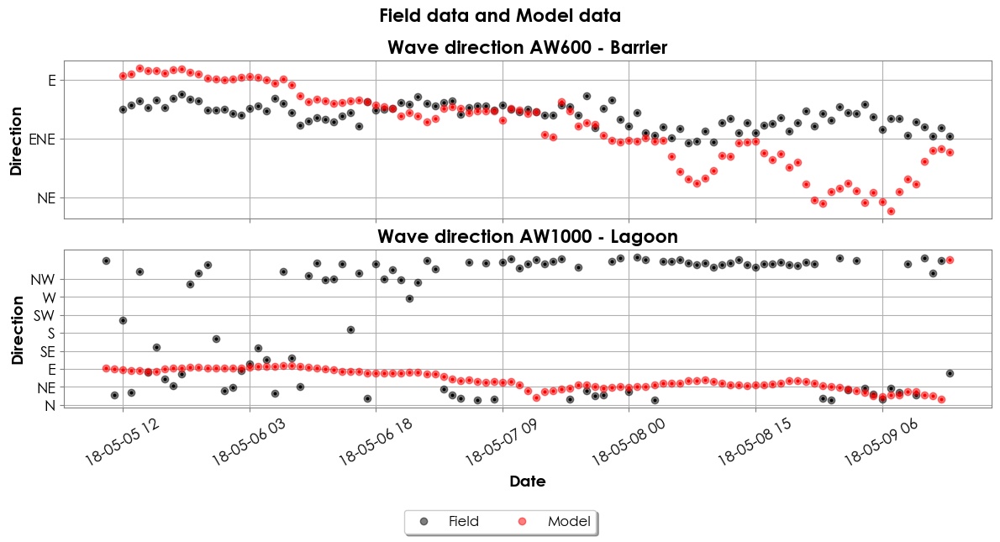

In [35]:
# Model data 
fig, axs = plt.subplots(2,1, figsize =(12,6), sharex = True)
# fig, axs = plt.subplots(figsize =(12,7), sharex = True)

ax = axs[0]
ticklabels = df_wave_aw600_field.index[::15]
yticks = np.arange(-11.25, 348.25, 22.5)
ylabels = ['N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW']
ax.set_yticks(yticks)
ax.plot(df_field_model_aw600['Mdir_x'], label ='Field', color = 'k' , ls = ' ', marker = 'o', ms = 6, alpha = 0.5)
ax.plot(df_field_model_aw600['Mdir_x'], color = 'k' , ls = ' ', marker = 'o', ms = 2)

ax.plot(df_field_model_aw600['Mdir_y'], label = 'Model', color = 'red',ls = ' ', marker = 'o', ms = 6, alpha = 0.5)
ax.plot(df_field_model_aw600['Mdir_y'], color = 'red',ls = ' ', marker = 'o', ms = 2)
ax.set_yticklabels(ylabels)


ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('Direction',size=14,fontweight = 'bold')
ax.set_title('Wave direction AW600 - Barrier',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
yticks = np.arange(-22.5, 360-22.5, 45)
ylabels = ['N','NE','E','SE','S','SW','W','NW']
ax1.set_yticks(yticks)
ax1.plot(df_field_model_aw1000['Mdir_x'], color = 'k' , ls = ' ', marker = 'o', ms = 6, alpha = 0.5)
ax1.plot(df_field_model_aw1000['Mdir_x'], color = 'k' , ls = ' ', marker = 'o', ms = 2)

ax1.plot(df_field_model_aw1000['Mdir_y'], color = 'red',ls = ' ', marker = 'o', ms = 6, alpha = 0.5)
ax1.plot(df_field_model_aw1000['Mdir_y'], color = 'red',ls = ' ', marker = 'o', ms = 2)
ax1.set_yticklabels(ylabels)

ax1.set_ylabel ('Direction',size=14,fontweight = 'bold')
ax1.set_xlabel ('Date',size=14,fontweight = 'bold')
ax1.set_title('Wave direction AW1000 - Lagoon',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)

fig.suptitle("Field data and Model data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.001),fancybox=True, shadow=True, ncol=4, fontsize = 12)
plt.xticks(rotation=30)
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)

## Salinity an Temperature

In [ ]:

# Paths global points
paths_g = glob.glob(r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\DATOS_SAI_4_15_nov_2021\CTD\Datos_CTD_CSV\*.csv")
paths_g = sorted(paths_g)

# Paths emissary points 
paths_em = glob.glob(r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\DATOS_SAI_4_15_nov_2021\CTD\Emisario\Datos_CTD_131121_CSV\*.csv")
paths_em = sorted(paths_em)

# Paths jonny Cay points
paths_jc = glob.glob(r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\DATOS_CAMPO\DATOS_SAI_4_15_nov_2021\CTD\Jhonny_Cay\*.csv")
paths_jc = sorted(paths_jc)
# paths
paths_all = paths_g + paths_em + paths_jc
dic_data, Cords = class_field_db_AW1000.dic_sal_temp(paths = paths_all)

### Field Data

```ojo se debe crear la funcion para leer los perfiles de salinidad y temperatura en los puntos de medición```

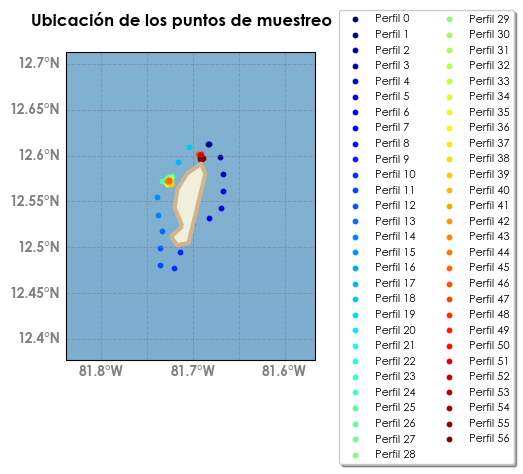

In [ ]:
lon = 360+Cords[:,0]
lat = Cords[:,1]
fig = plt.figure(figsize = (7,4))
ax1 = fig.add_subplot(projection = ccrs.PlateCarree())
ax1.set_extent([np.min(lon)-0.1,np.max(lon)+0.1, np.min(lat)-0.1, np.max(lat)+0.1])

gl = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
ax1.stock_img()
ax1.add_feature(cf.LAND, zorder= 10)
ax1.add_feature(cf.COASTLINE, lw=3, color= 'tan', zorder = 11 )
# ax1.add_feature(cf.RIVERS, lw = 2)
ax1.add_feature(cf.BORDERS, lw = 3, color = 'tan')


colors_cm = pl.cm.jet(np.linspace(0,1, len(lon)))
i = 0
for loni, lati in zip (lon, lat):
    ax1.scatter(loni, lati, marker = 'o', s = 10, label = 'Perfil '+str(i), color = colors_cm[i])
    i=i+1
fig_params(ax1)

#------------ Labels de cartopy--------------- 
gl.xlabels_top = False
gl.ylabels_right = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.ylabel_style = {'size': 10, 'color': 'gray','weight': 'bold'}
gl.xlabel_style = {'size': 10, 'color': 'gray', 'weight': 'bold'}

_= fig.legend(loc='upper center', bbox_to_anchor=(0.85, 1),
          fancybox=True, shadow=True, ncol=2, fontsize = 8)
fig.suptitle('Ubicación de los puntos de muestreo',size=12,fontweight = 'bold');
fig.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.subplots_adjust(hspace=0.25)


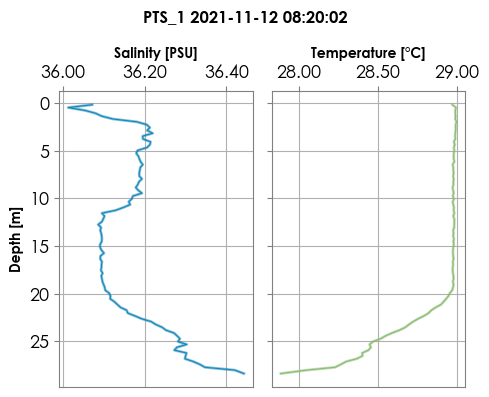

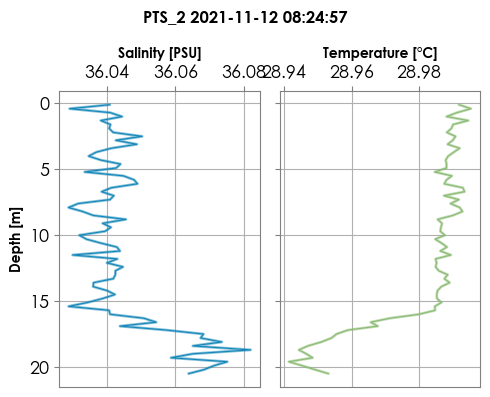

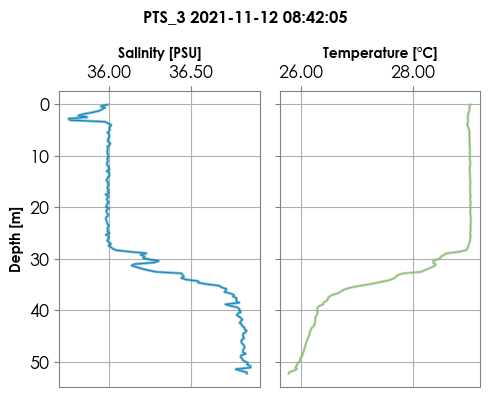

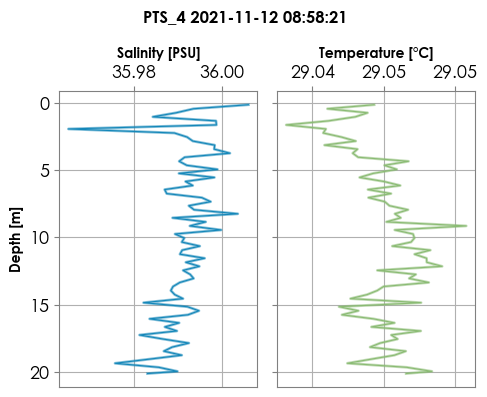

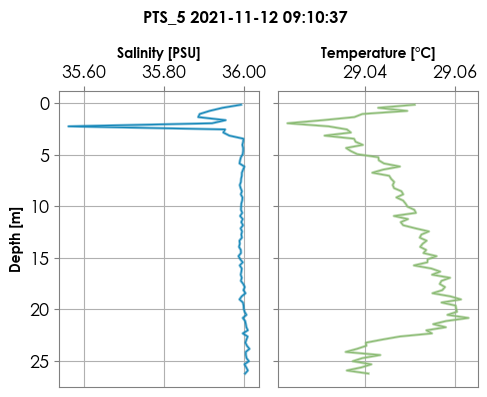

...

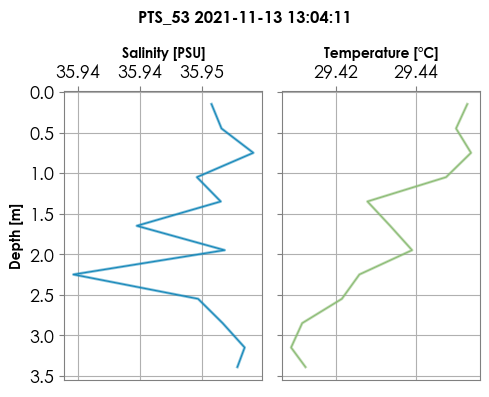

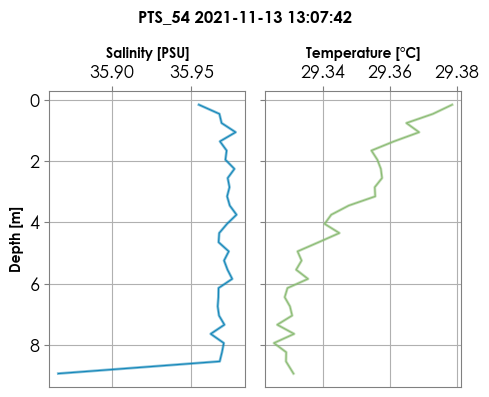

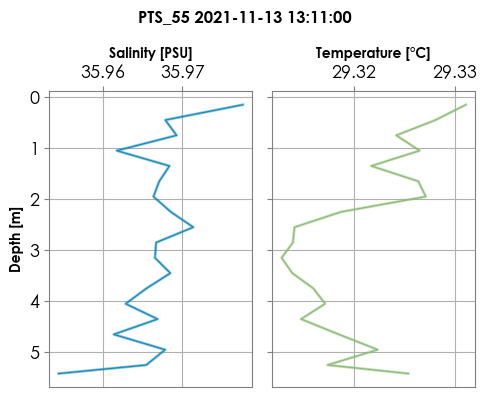

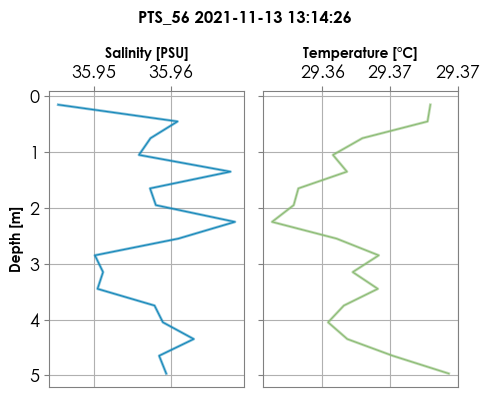

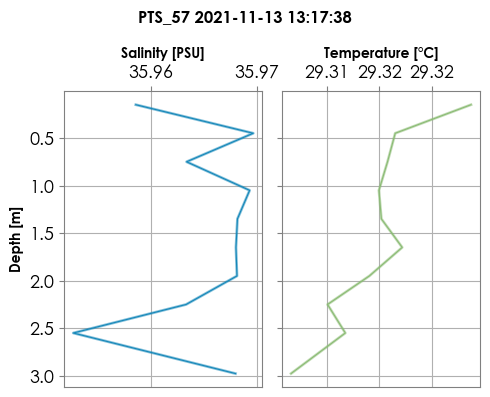

In [ ]:

# Grficos de cada perfil en cada punto
keys_list = list(dic_data.keys())

#len(keys_list)
for i in range (len(keys_list)):
    fig, axs = plt.subplots(1,2,figsize=(5,4), sharey = True)
    ax = axs[0]
    p1 = ax.plot(dic_data[keys_list[i]].Sal.values,dic_data[keys_list[i]].Depth.values,lw=2,alpha=0.5,ls ='-', color = '#1487B9')
    p1 = ax.plot(dic_data[keys_list[i]].Sal.values,dic_data[keys_list[i]].Depth.values,lw=0.8,alpha=1,ls ='-', label = 'Salinity', color = '#1487B9')
    ax.xaxis.tick_top()
    ax.invert_yaxis()
    ax.xaxis.set_label_position('top') 
    ax.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
    ax.set_xlabel('Salinity [PSU]',size=10,fontweight = 'bold')
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax)  
    # ax.set_title('Salinity ', size = 11,fontproperties=prop2, color = 'gray')

#------------FIGURA 2----------------------

    ax2 = axs[1]
    p2 = ax2.plot(dic_data[keys_list[i]].Temp.values,dic_data[keys_list[i]].Depth.values,lw=2,alpha=0.5,ls ='-',color = '#8ABB73')
    p2 = ax2.plot(dic_data[keys_list[i]].Temp.values,dic_data[keys_list[i]].Depth.values,lw=0.8,alpha=1,ls ='-',color = '#8ABB73', label = 'Temperature')
    ax2.xaxis.tick_top()
    ax2.xaxis.set_label_position('top') 
    ax2.set_xlabel('Temperature [°C]',size=10, fontweight = 'bold')
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax2)

    fig.suptitle(keys_list[i], size = 12,fontweight = 'bold')
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.subplots_adjust(hspace=0.2)

In [ ]:
dic_depth = {}
depth = np.zeros(len(paths_g))
ind_df =[]
c = 0
for i in range(len(paths_g)):
    depth[c] = dic_data[keys_list[i]].Depth.values[-1]
    ind_df.append(keys_list[i])
    dic_depth.update({'depth':depth, 'ind_df':ind_df})
    c = c+1
df_idepth = pd.DataFrame(dic_depth)
df_idepth = df_idepth.sort_values('depth'). reset_index(drop=True)
df_idepth.tail(4)

,depth,ind_df
15,79.203729,PTS_11 2021-11-12 10:33:59
16,80.392903,PTS_9 2021-11-12 10:08:09
17,81.331655,PTS_10 2021-11-12 10:20:44
18,82.060203,PTS_14 2021-11-12 11:12:01


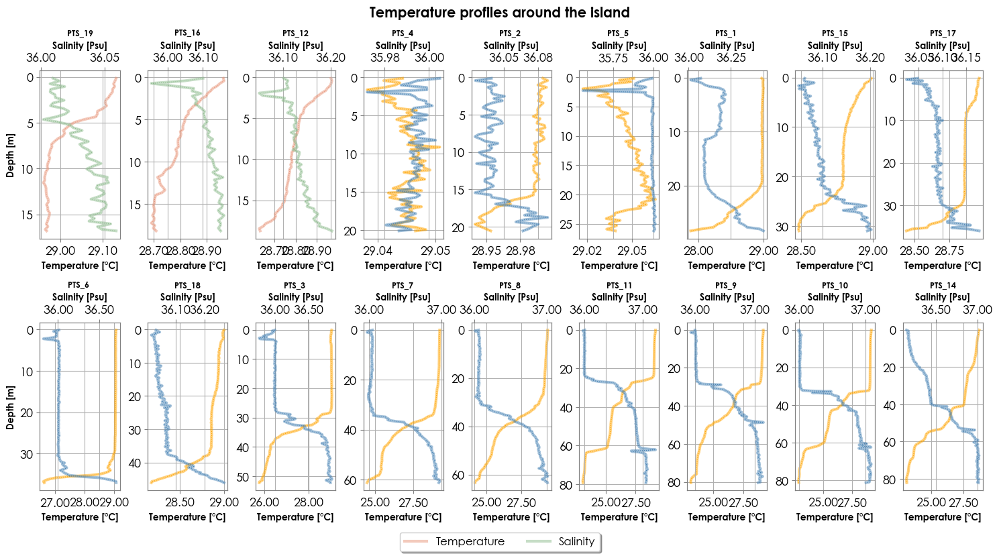

In [ ]:
fig= plt.figure(figsize = (15,8))
c = 1
for i in range(1,len(df_idepth)):
    ind_df = df_idepth.ind_df.loc[i]
    # print(c)
    ax2 = fig.add_subplot(2,9,c)

    if df_idepth.depth.loc[i] < 20:
        color_ = 'darksalmon'
    else: 
        color_ = 'orange'

    if c == 1: 
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature')
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    elif c== len(df_idepth):
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature')
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

    ax2.invert_yaxis()

    # ax2.tick_params(axis ='x')
    # ax2.xaxis.set_label_position('top')
    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
        
    ax2.set_xlabel('Temperature [°C]',size=10,fontweight = 'bold')
    ax2.set_title(ind_df[0:6], size = 9,fontweight = 'bold', color = 'k')
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax2)


    ax = ax2.twiny()
    if df_idepth.depth.loc[i] < 20:
        color_ = 'darkseagreen'
    else: 
        color_ = 'steelblue'
    
    if c == 1: 
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity')
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    elif c== len(df_idepth):
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity')
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)


    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
    ax.set_xlabel('Salinity [Psu]',size=10,fontweight = 'bold')
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.xaxis.tick_top()
    ax.tick_params(axis ='x')
    ax.xaxis.set_label_position('top')
    fig_params(ax)

    c = c+1
_= fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01),
        fancybox=True, shadow=True, ncol=2, fontsize = 12)
fig.suptitle('Temperature profiles around the island', size = 15,fontweight = 'bold')
fig.tight_layout()
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.5)

In [ ]:
dic_depth = {}
depth = np.zeros(len(paths_em))
ind_df =[]
c = 0
for i in range(len(paths_g)+1, len(paths_g)+1+len(paths_em), 1):
    depth[c] = dic_data[keys_list[i]].Depth.values[-1]
    ind_df.append(keys_list[i])
    dic_depth.update({'depth':depth, 'ind_df':ind_df})
    c = c+1
df_idepth = pd.DataFrame(dic_depth)
df_idepth = df_idepth.sort_values('depth'). reset_index(drop=True)
df_idepth.tail(5)

,depth,ind_df
22,78.642175,PTS_37 2021-11-13 10:10:57
23,80.436571,PTS_36 2021-11-13 10:00:14
24,80.901922,PTS_43 2021-11-13 10:43:14
25,81.835698,PTS_26 2021-11-13 08:47:11
26,81.843778,PTS_25 2021-11-13 08:42:34


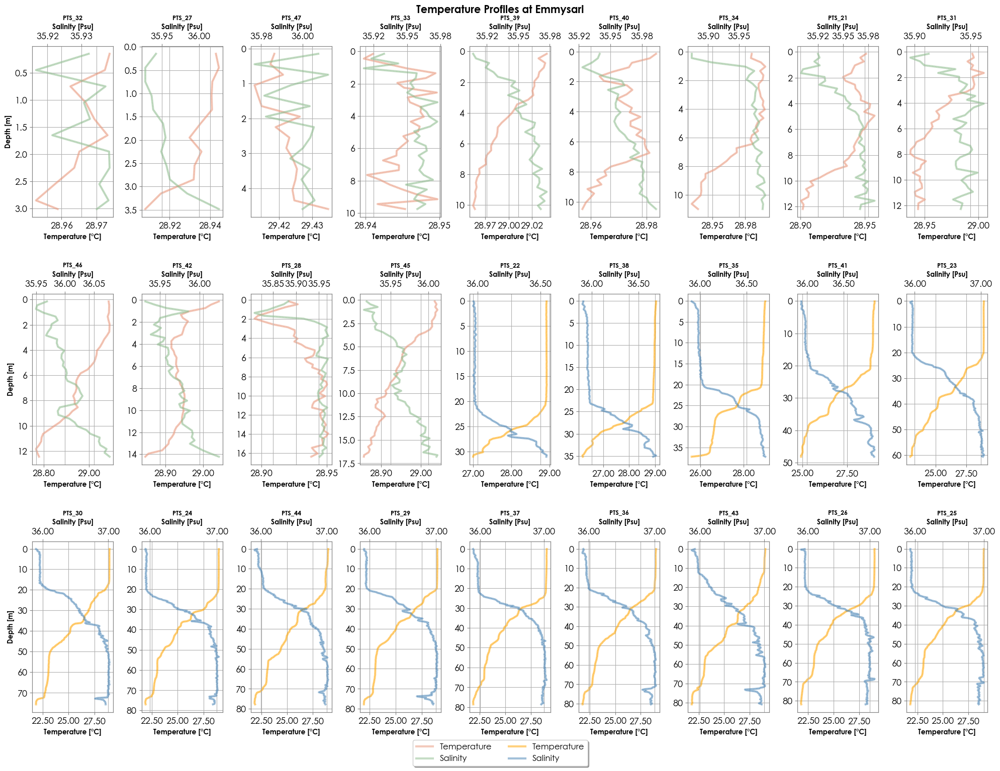

In [ ]:
fig= plt.figure(figsize = (20,15))
c = 1
for i in range(len(df_idepth)):
    ind_df = df_idepth.ind_df.loc[i]
    
    ax2 = fig.add_subplot(3,9,c)
    if df_idepth.depth.loc[i] < 20:
        color_ = 'darksalmon'
    else: 
        color_ = 'orange'

    if c == 1: 
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature')
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    elif c== len(df_idepth):
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature')
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

    ax2.invert_yaxis()

    # ax2.tick_params(axis ='x')
    # ax2.xaxis.set_label_position('top')
    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
        
    ax2.set_xlabel('Temperature [°C]',size=10,fontweight = 'bold')
    ax2.set_title(ind_df[0:6], size = 9,fontweight = 'bold', color = 'k')
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax2)


    ax = ax2.twiny()
    if df_idepth.depth.loc[i] < 20:
        color_ = 'darkseagreen'
    else: 
        color_ = 'steelblue'
    
    if c == 1: 
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity')
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    elif c== len(df_idepth):
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity')
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)


    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
    ax.set_xlabel('Salinity [Psu]',size=10,fontweight = 'bold')
    ax.xaxis.tick_top()
    ax.tick_params(axis ='x')
    ax.xaxis.set_label_position('top')
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax)

    c = c+1
_= fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01),
        fancybox=True, shadow=True, ncol=2, fontsize = 12)
fig.suptitle('Temperature Profiles at Emmysari', size = 15,fontweight = 'bold')
fig.tight_layout()
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.45)

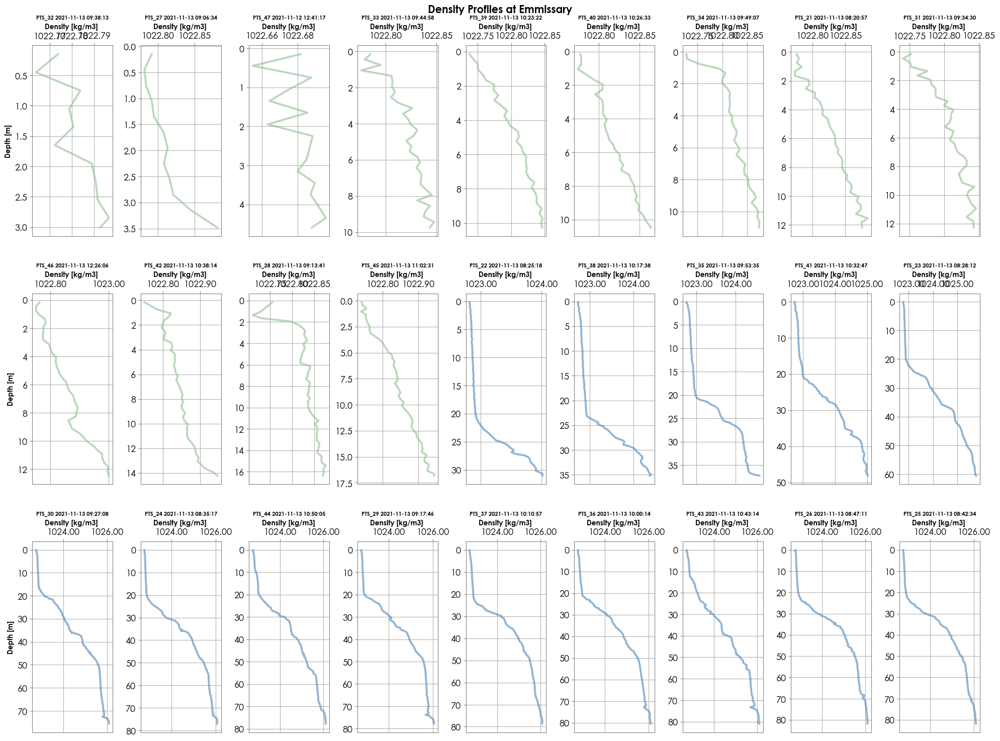

In [ ]:
fig= plt.figure(figsize = (20,15))
c = 1
for i in range(len(df_idepth)):
    ind_df = df_idepth.ind_df.loc[i]
    
    if df_idepth.depth.loc[i] < 20:
        color_ = 'darkseagreen'
    else: 
        color_ = 'steelblue'
    
    ax2 = fig.add_subplot(3,9,c)
    p2 = ax2.plot(dic_data[ind_df].Densidad.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
    p2 = ax2.plot(dic_data[ind_df].Densidad.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_, label = 'Temperature')
    ax2.invert_yaxis()
    ax2.xaxis.tick_top()
    # ax2.tick_params(axis ='x')
    ax2.xaxis.set_label_position('top')
    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
    ax2.set_xlabel('Density [kg/m3] ',size=10,fontweight = 'bold')
    ax2.set_title(ind_df, size = 8,fontweight = 'bold')
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax2)
    c = c+1
    # _= fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.05),
    #       fancybox=True, shadow=True, ncol=2, fontsize = 10,prop=prop2, labelcolor = 'gray')
    # plt.legend([p1,p2],loc=3)
fig.suptitle('Density Profiles at Emmissary', size = 15,fontweight = 'bold')
fig.tight_layout()
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.3)

In [ ]:
dic_depth = {}
depth = np.zeros(len(paths_jc))
ind_df =[]
c = 0
for i in range(len(paths_g)+len(paths_em), len(paths_g)+len(paths_em)+len(paths_jc), 1):
    depth[c] = dic_data[keys_list[i]].Depth.values[-1]
    ind_df.append(keys_list[i])
    dic_depth.update({'depth':depth, 'ind_df':ind_df})
    c = c+1
df_idepth = pd.DataFrame(dic_depth)
df_idepth = df_idepth.sort_values('depth'). reset_index(drop=True)
df_idepth.tail(5)

,depth,ind_df
6,4.271402,PTS_48 2021-11-12 12:44:16
7,4.594415,PTS_47 2021-11-12 12:41:17
8,4.966532,PTS_56 2021-11-13 13:14:26
9,5.414812,PTS_55 2021-11-13 13:11:00
10,8.943908,PTS_54 2021-11-13 13:07:42


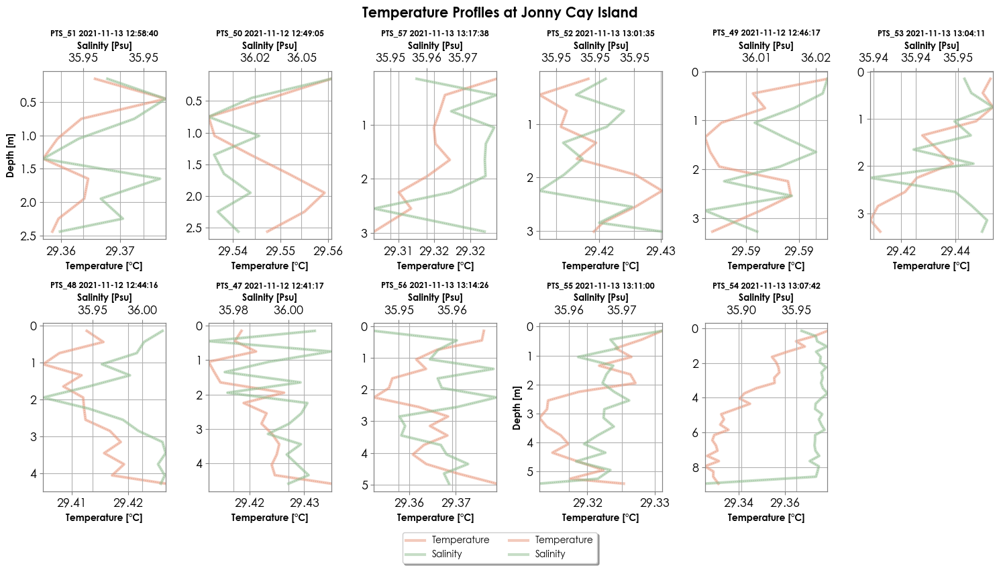

In [ ]:
fig= plt.figure(figsize = (15,8))
c = 1
for i in range(len(df_idepth)):
    ind_df = df_idepth.ind_df.loc[i]
    

    
    ax2 = fig.add_subplot(2,6,c)
    if df_idepth.depth.loc[i] > 0:
        color_ = 'darksalmon'
    else: 
        color_ = 'orange'

    if c == 1: 
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature')
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    elif c== len(df_idepth):
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature')
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax2.plot(dic_data[ind_df].Temp.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

    ax2.invert_yaxis()

    # ax2.tick_params(axis ='x')
    # ax2.xaxis.set_label_position('top')
    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
        
    ax2.set_xlabel('Temperature [°C]',size=10,fontweight = 'bold')
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    # ax2.xaxis.tick_top()
    ax2.set_xlim(min(dic_data[ind_df].Temp.values), max(dic_data[ind_df].Temp.values))
    fig_params(ax2)
    ax2.set_title(ind_df, size = 9,fontweight = 'bold')


    ax = ax2.twiny()
    if df_idepth.depth.loc[i] < 20:
        color_ = 'darkseagreen'
    else: 
        color_ = 'steelblue'
    
    if c == 1: 
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity')
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    elif c== len(df_idepth):
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity')
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax.plot(dic_data[ind_df].Sal.values,dic_data[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)


    # if (c%9)==1: 
    #     ax2.set_ylabel('Depth [m]',size=10,fontproperties=prop2, color = 'gray')
    ax.set_xlabel('Salinity [Psu]',size=10,fontweight = 'bold')
    ax.xaxis.tick_top()
    ax.tick_params(axis ='x')
    ax.xaxis.set_label_position('top')
    ax.set_xlim(min(dic_data[ind_df].Sal.values), max(dic_data[ind_df].Sal.values))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax)



    c = c+1
_= fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01),
        fancybox=True, shadow=True, ncol=2, fontsize = 10)
fig.suptitle('Temperature Profiles at Jonny Cay Island', size = 15,fontweight = 'bold')
fig.tight_layout()
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.5)

### Model Data

In [ ]:
test = int(input('numero de prueba: (int)'))
type_grid = input('Ingrese el tipo de malla (z/sigma)')

In [ ]:
# _____________________Variables del modelo________________________________________
dic_Tmodel = load_mat_files(Test='TEST'+str(test), file_name= 'temperature.mat', Folder_variable='Salinity_Temperature')
dic_Smodel = load_mat_files(Test='TEST'+str(test), file_name= 'salinity.mat', Folder_variable='Salinity_Temperature')
py_datetime = [datetime.datetime.fromordinal(int(i)) + timedelta(days=i%1) - timedelta(days = 366) for i in dic_Tmodel['Time']]
time_df = np.array([datetime.datetime(i.year, i.month, i.day, i.hour, i.minute, i.second) for i in py_datetime])


# ______________________Data Frame de los datos de campo_____________________________
names_field= np.array([keys_list[i].split(' ',1) for i in range (len(keys_list))])
df_loc_field = pd.DataFrame({'Names':names_field[:,0], 'time':pd.to_datetime(names_field[:,1]), 'Lon': Cords[:,0], 'Lat':Cords[:,1]})
x_pst = []
y_pst = []
for lon, lat in zip (df_loc_field['Lon'], df_loc_field['Lat']):
    x_ipts, y_ipts = proj_ZONE17(lon, lat)
    x_pst.append(x_ipts)
    y_pst.append(y_ipts)
df_loc_field['x_field'] = x_pst
df_loc_field['y_field'] = y_pst
df_loc_field.to_csv('Coordenas_Perfiles.csv')

#_____________________Data Frame de los datos del modelo______________________________________ 
path = rf'G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\CODIGOS\TEST{str(test)}'
name_pts_obs_file = 'TEST_X_PTS_OBS.obs'
df_loc_model = pd.read_csv(f'{path}\{name_pts_obs_file}', sep = '\s+', names=['Names', 'ind_col', 'ind_row'])
df_loc_model['X'] = [dic_Tmodel['X'][i, j,0] for i, j, in zip(df_loc_model['ind_col'], df_loc_model['ind_row'])]
df_loc_model['Y'] = [dic_Tmodel['Y'][i, j,0] for i, j, in zip(df_loc_model['ind_col'], df_loc_model['ind_row'])]
# loc_ST = load_mat_files(Test='TEST'+str(test), file_name='location_observation_points.mat', Folder_variable='Salinity_Temperature')
# df_loc_model = pd.DataFrame({'Names':[loc_ST['Val'][i][0] for i in range (len(loc_ST['Val']))], 'X':loc_ST['X'][0,:],'Y':loc_ST['Y'][0,:]})

#____________________________Match de los datos de campo y modelo_______________________________
df_field_model = pd.merge(df_loc_field, df_loc_model, on= 'Names')
df_field_model['Names_field'] = [str(i)+' '+str(j) for i,j in zip (df_field_model['Names'], df_field_model['time'])]
df_field_model.head(4)

,Names,time,Lon,Lat,x_field,y_field,ind_col,ind_row,X,Y,Names_field
0,PTS_1,2021-11-12 08:20:02,-81.681931,12.613034,425936.041428,1.394440e+06,76,85,425890.875,1394463.625,PTS_1 2021-11-12 08:20:02
1,PTS_2,2021-11-12 08:24:57,-81.683103,12.612860,425808.652328,1.394421e+06,75,85,425790.875,1394463.625,PTS_2 2021-11-12 08:24:57
2,PTS_3,2021-11-12 08:42:05,-81.670524,12.598765,427170.946786,1.392858e+06,89,69,427190.875,1392863.625,PTS_3 2021-11-12 08:42:05
3,PTS_4,2021-11-12 08:58:21,-81.667462,12.579662,427498.186824,1.390745e+06,92,48,427490.875,1390763.625,PTS_4 2021-11-12 08:58:21


In [ ]:
time_field = np.array([datetime.datetime.strptime(str(i), '%Y-%m-%d %H:%M:%S') for i in df_field_model['time']])
time_field = np.array([datetime.datetime(i.year,i.month,i.day, i.hour,0) for i in time_field])
df_field_model['time'] = time_field

#______________________ ÍNDICIES DE LAS HORAS________________________________________
index_time = np.zeros(len(df_field_model))*np.nan
for i in range(len(df_field_model)):
    index_timei = np.where(time_df == df_field_model['time'][i])[0]
    if len(index_timei)==0:
        index_time[i] = np.nan 
    else:
        index_time[i] = index_timei
df_field_model['index_t'] = index_time

#_________________Llenar los index time si la resolución temporal es mayor a una hora_______________________
df_field_model = df_field_model.fillna(method="ffill")
df_field_model.head(4)


,Names,time,Lon,Lat,x_field,y_field,ind_col,ind_row,X,Y,Names_field,index_t
0,PTS_1,2021-11-12 08:00:00,-81.681931,12.613034,425936.041428,1.394440e+06,76,85,425890.875,1394463.625,PTS_1 2021-11-12 08:20:02,272.0
1,PTS_2,2021-11-12 08:00:00,-81.683103,12.612860,425808.652328,1.394421e+06,75,85,425790.875,1394463.625,PTS_2 2021-11-12 08:24:57,272.0
2,PTS_3,2021-11-12 08:00:00,-81.670524,12.598765,427170.946786,1.392858e+06,89,69,427190.875,1392863.625,PTS_3 2021-11-12 08:42:05,272.0
3,PTS_4,2021-11-12 08:00:00,-81.667462,12.579662,427498.186824,1.390745e+06,92,48,427490.875,1390763.625,PTS_4 2021-11-12 08:58:21,272.0


In [ ]:
# __________________Diccionario de los perfiles del modelo_____________________________________
dic_model_TS = {}
i = 0 
for ind_x, ind_y in zip (df_field_model['ind_col'], df_field_model['ind_row']):
    Temp =  dic_Tmodel['Val'][int(df_field_model['index_t'][i]),ind_x,ind_y,:]
    Sal = dic_Smodel['Val'][int(df_field_model['index_t'][i]),ind_x,ind_y,:]
    Depth = dic_Tmodel['Z'][int(df_field_model['index_t'][i]),ind_x,ind_y,:]
    df_model_TS = pd.DataFrame({'Temp':Temp, 'Sal':Sal, 'Depth':-Depth}).dropna(axis=0).reset_index(drop=True)
    if type_grid == 'z':
        dic_model_TS.update({df_field_model['Names'][i]: df_model_TS[::-1]})
    elif type_grid == 'sigma': 
        dic_model_TS.update({df_field_model['Names'][i]: df_model_TS})
    i = i+1

In [ ]:
dic_depth = {}
depth = np.zeros(len(dic_model_TS.keys()))
ind_df =[]
c = 0
for i in range(len(dic_model_TS.keys())):
    depth[c] = dic_model_TS[list(dic_model_TS.keys())[i]].Depth.values[-1]
    ind_df.append(list(dic_model_TS.keys())[i])
    dic_depth.update({'depth':depth, 'ind_df':ind_df})
    c = c+1
df_idepth = pd.DataFrame(dic_depth)
df_idepth = df_idepth.sort_values('depth'). reset_index(drop=True)
df_idepth.tail(5)

,depth,ind_df
38,145.755932,PTS_37
39,146.074978,PTS_44
40,163.143749,PTS_24
41,317.220123,PTS_25
42,336.846878,PTS_26


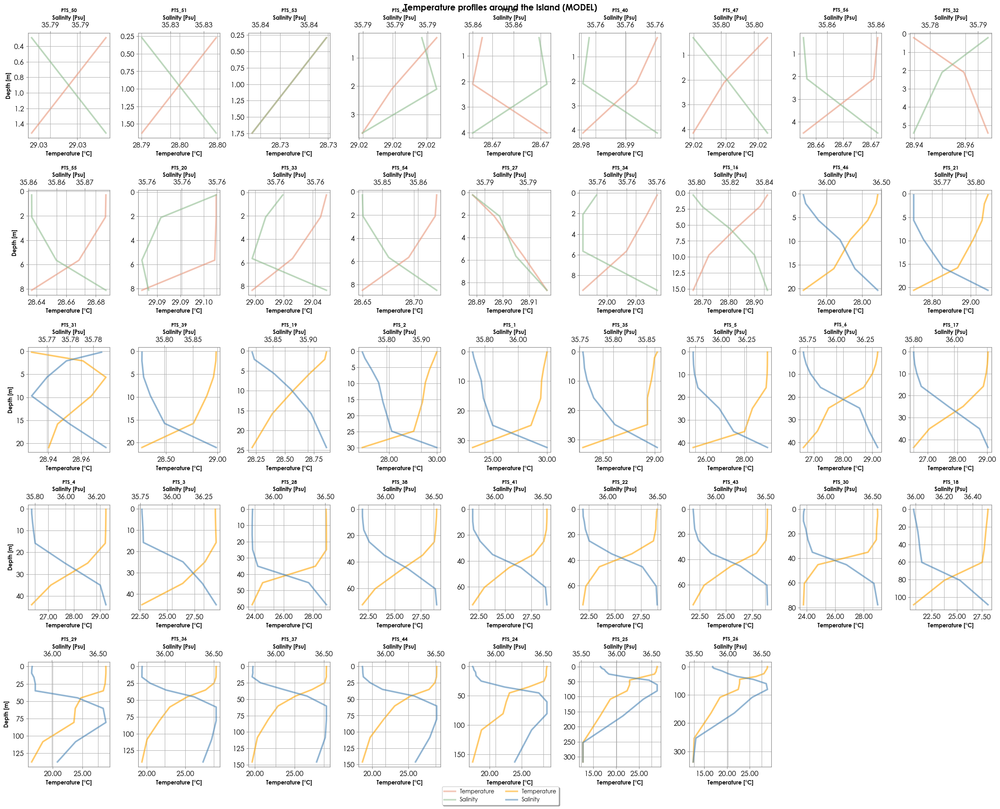

In [ ]:
fig= plt.figure(figsize = (25,20))
c = 1
for i in range(0,len(df_idepth)):
    ind_df = df_idepth.ind_df.loc[i]
    # print(c)
    ax2 = fig.add_subplot(5,9,c)

    if df_idepth.depth.loc[i] < 20:
        color_ = 'darksalmon'
    else: 
        color_ = 'orange'

    if c == 1: 
        p2 = ax2.plot(dic_model_TS[ind_df].Temp.values,dic_model_TS[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature')
        p2 = ax2.plot(dic_model_TS[ind_df].Temp.values,dic_model_TS[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    elif c== len(df_idepth):
        p2 = ax2.plot(dic_model_TS[ind_df].Temp.values,dic_model_TS[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature')
        p2 = ax2.plot(dic_model_TS[ind_df].Temp.values,dic_model_TS[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax2.plot(dic_model_TS[ind_df].Temp.values,dic_model_TS[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax2.plot(dic_model_TS[ind_df].Temp.values,dic_model_TS[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

    ax2.invert_yaxis()

    # ax2.tick_params(axis ='x')
    # ax2.xaxis.set_label_position('top')
    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
        
    ax2.set_xlabel('Temperature [°C]',size=10,fontweight = 'bold')
    ax2.set_title(ind_df, size = 9,fontweight = 'bold')
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax2)


    ax = ax2.twiny()
    if df_idepth.depth.loc[i] < 20:
        color_ = 'darkseagreen'
    else: 
        color_ = 'steelblue'
    
    if c == 1: 
        p2 = ax.plot(dic_model_TS[ind_df].Sal.values,dic_model_TS[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity')
        p2 = ax.plot(dic_model_TS[ind_df].Sal.values,dic_model_TS[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    elif c== len(df_idepth):
        p2 = ax.plot(dic_model_TS[ind_df].Sal.values,dic_model_TS[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity')
        p2 = ax.plot(dic_model_TS[ind_df].Sal.values,dic_model_TS[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax.plot(dic_model_TS[ind_df].Sal.values,dic_model_TS[ind_df].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax.plot(dic_model_TS[ind_df].Sal.values,dic_model_TS[ind_df].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)


    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
    ax.set_xlabel('Salinity [Psu]',size=10,fontweight = 'bold')
    ax.xaxis.tick_top()
    ax.tick_params(axis ='x')
    ax.xaxis.set_label_position('top')
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax)

    c = c+1
_= fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01),
        fancybox=True, shadow=True, ncol=2, fontsize = 10)
fig.suptitle('Temperature profiles around the island (MODEL)', size = 15,fontweight = 'bold')
fig.tight_layout()
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.5)

### Model and Field

In [ ]:
dic_depth = {}
depth = np.zeros(len(dic_model_TS.keys()))
ind_df_field = []
ind_df_model = []
c = 0 
for i in range(len(df_field_model)):
    depth[c] = dic_model_TS[list(dic_model_TS.keys())[i]].Depth.values[-1]
    ind_df_model.append(list(dic_model_TS.keys())[i])
    ind_df_field.append(df_field_model['Names_field'][i])

    dic_depth.update({'depth':depth, 'ind_field':ind_df_field, 'ind_model':ind_df_model})
    c = c + 1

df_idepth = pd.DataFrame(dic_depth)
df_idepth = df_idepth.sort_values('depth'). reset_index(drop=True)
df_idepth.tail(4)

,depth,ind_field,ind_model
39,146.074978,PTS_44 2021-11-13 10:50:05,PTS_44
40,163.143749,PTS_24 2021-11-13 08:35:17,PTS_24
41,317.220123,PTS_25 2021-11-13 08:42:34,PTS_25
42,336.846878,PTS_26 2021-11-13 08:47:11,PTS_26


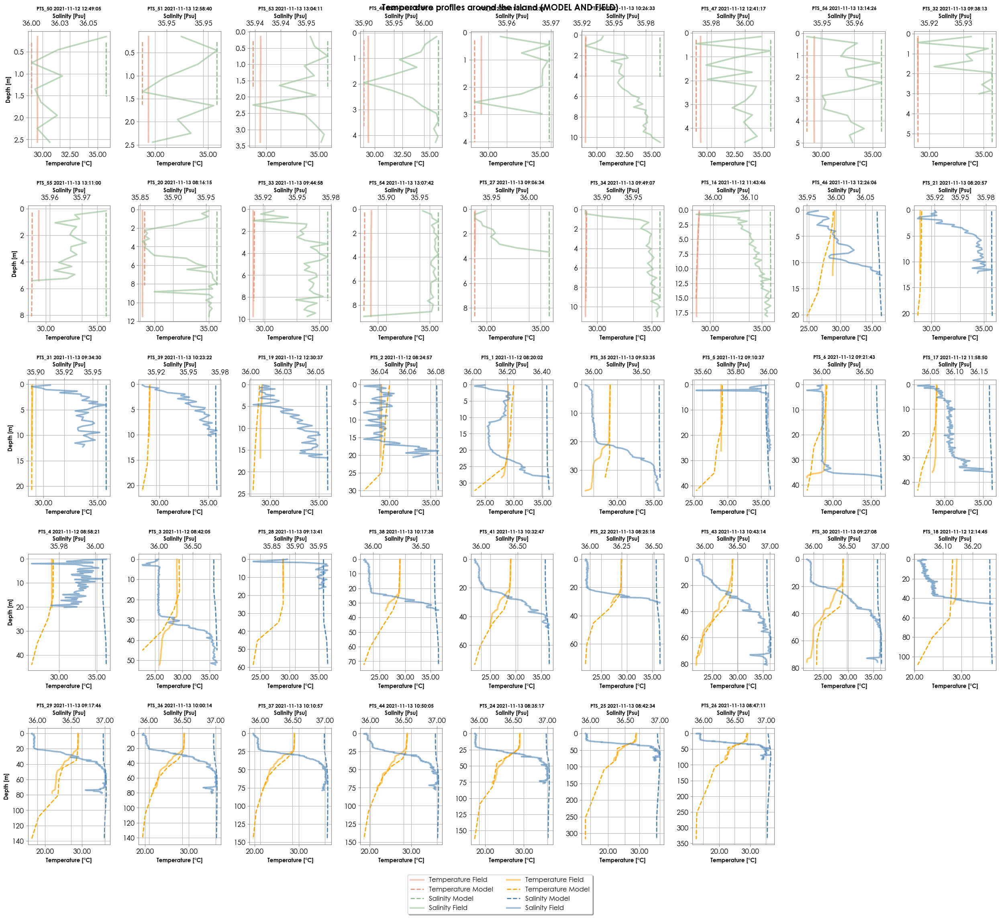

In [ ]:
fig= plt.figure(figsize = (25,22))
c = 1
for i in range(0,len(df_idepth)):
    ind_df_field = df_idepth.ind_field.loc[i]
    ind_df_model = df_idepth.ind_model.loc[i]
    # print(c)
    ax2 = fig.add_subplot(5,9,c)

    if df_idepth.depth.loc[i] < 20:
        color_ = 'darksalmon'
    else: 
        color_ = 'orange'

    if c == 1: 
        p2 = ax2.plot(dic_data[ind_df_field].Temp.values,dic_data[ind_df_field].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature Field')
        p2 = ax2.plot(dic_data[ind_df_field].Temp.values,dic_data[ind_df_field].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

        p2 = ax2.plot(dic_model_TS[ind_df_model].Temp.values,dic_model_TS[ind_df_model].Depth.values,lw=2,alpha=1,ls ='--',color = color_, label = 'Temperature Model')
        p2 = ax2.plot(dic_model_TS[ind_df_model].Temp.values,dic_model_TS[ind_df_model].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    
    elif c== len(df_idepth):
        p2 = ax2.plot(dic_data[ind_df_field].Temp.values,dic_data[ind_df_field].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Temperature Field')
        p2 = ax2.plot(dic_data[ind_df_field].Temp.values,dic_data[ind_df_field].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

        p2 = ax2.plot(dic_model_TS[ind_df_model].Temp.values,dic_model_TS[ind_df_model].Depth.values,lw=2,alpha=1,ls ='--',color = color_, label = 'Temperature Model')
        p2 = ax2.plot(dic_model_TS[ind_df_model].Temp.values,dic_model_TS[ind_df_model].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    else:
        p2 = ax2.plot(dic_data[ind_df_field].Temp.values,dic_data[ind_df_field].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax2.plot(dic_data[ind_df_field].Temp.values,dic_data[ind_df_field].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

        p2 = ax2.plot(dic_model_TS[ind_df_model].Temp.values,dic_model_TS[ind_df_model].Depth.values,lw=2,alpha=1,ls ='--',color = color_)
        p2 = ax2.plot(dic_model_TS[ind_df_model].Temp.values,dic_model_TS[ind_df_model].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    ax2.invert_yaxis()

    # ax2.tick_params(axis ='x')
    # ax2.xaxis.set_label_position('top')
    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
        
    ax2.set_xlabel('Temperature [°C]',size=10,fontweight = 'bold')
    ax2.set_title(ind_df_field, size = 9,fontweight = 'bold')
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax2)


    ax = ax2.twiny()
    if df_idepth.depth.loc[i] < 20:
        color_ = 'darkseagreen'
    else: 
        color_ = 'steelblue'
    
    if c == 1: 
        p2 = ax.plot(dic_data[ind_df_field].Sal.values,dic_data[ind_df_field].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity Field')
        p2 = ax.plot(dic_data[ind_df_field].Sal.values,dic_data[ind_df_field].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

        p2 = ax2.plot(dic_model_TS[ind_df_model].Sal.values,dic_model_TS[ind_df_model].Depth.values,lw=2,alpha=1,ls ='--',color = color_, label = 'Salinity Model')
        p2 = ax2.plot(dic_model_TS[ind_df_model].Sal.values,dic_model_TS[ind_df_model].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    
    elif c== len(df_idepth):
        p2 = ax.plot(dic_data[ind_df_field].Sal.values,dic_data[ind_df_field].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_, label = 'Salinity Field')
        p2 = ax.plot(dic_data[ind_df_field].Sal.values,dic_data[ind_df_field].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

        p2 = ax2.plot(dic_model_TS[ind_df_model].Sal.values,dic_model_TS[ind_df_model].Depth.values,lw=2,alpha=1,ls ='--',color = color_, label = 'Salinity Model')
        p2 = ax2.plot(dic_model_TS[ind_df_model].Sal.values,dic_model_TS[ind_df_model].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
    
    else:
        p2 = ax.plot(dic_data[ind_df_field].Sal.values,dic_data[ind_df_field].Depth.values,lw=3,alpha=0.5,ls ='-',color = color_)
        p2 = ax.plot(dic_data[ind_df_field].Sal.values,dic_data[ind_df_field].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)
        
        p2 = ax2.plot(dic_model_TS[ind_df_model].Sal.values,dic_model_TS[ind_df_model].Depth.values,lw=2,alpha=1,ls ='--',color = color_)
        p2 = ax2.plot(dic_model_TS[ind_df_model].Sal.values,dic_model_TS[ind_df_model].Depth.values,lw=0.8,alpha=1,ls =':',color = color_)

    if (c%9)==1: 
        ax2.set_ylabel('Depth [m]',size=10,fontweight = 'bold')
    ax.set_xlabel('Salinity [Psu]',size=10,fontweight = 'bold')
    ax.xaxis.tick_top()
    ax.tick_params(axis ='x')
    ax.xaxis.set_label_position('top')
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax)

    c = c+1
_= fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.002),
        fancybox=True, shadow=True, ncol=2, fontsize = 12)
fig.suptitle('Temperature profiles around the island (MODEL AND FIELD)', size = 15,fontweight = 'bold')
fig.tight_layout()
plt.subplots_adjust(wspace=0.35)
plt.subplots_adjust(hspace=0.5)

In [ ]:
dic_depth = {}
depth = np.zeros(len(dic_model_TS.keys()))
ind_df_field = []
ind_df_model = []
c = 0 
for i in range(len(df_field_model)):
    depth[c] = dic_model_TS[list(dic_model_TS.keys())[i]].Depth.values[-1]
    ind_df_model.append(list(dic_model_TS.keys())[i])
    ind_df_field.append(df_field_model['Names_field'][i])

    dic_depth.update({'depth':depth, 'ind_field':ind_df_field, 'ind_model':ind_df_model})
    c = c + 1

df_idepth = pd.DataFrame(dic_depth)
df_idepth = df_idepth.sort_values('depth'). reset_index(drop=True)
df_idepth.tail(4)

,depth,ind_field,ind_model
39,146.074978,PTS_44 2021-11-13 10:50:05,PTS_44
40,163.143749,PTS_24 2021-11-13 08:35:17,PTS_24
41,317.220123,PTS_25 2021-11-13 08:42:34,PTS_25
42,336.846878,PTS_26 2021-11-13 08:47:11,PTS_26


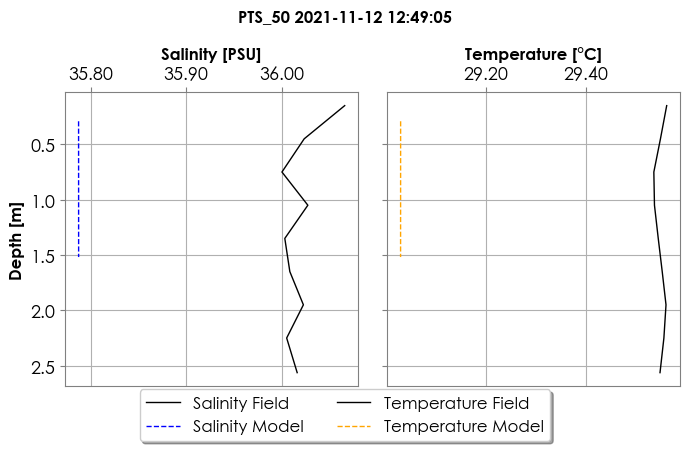

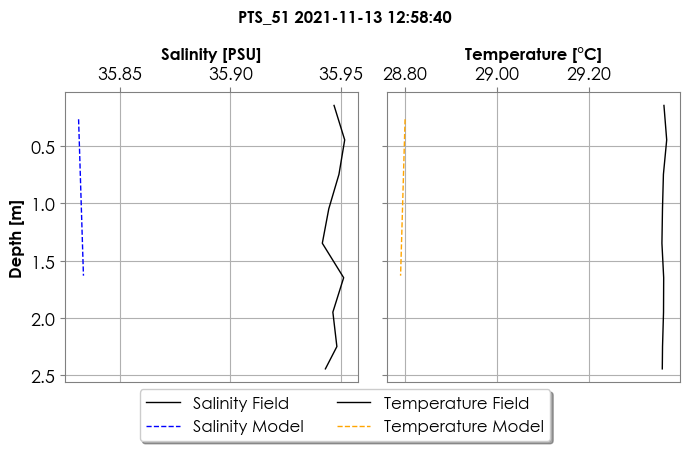

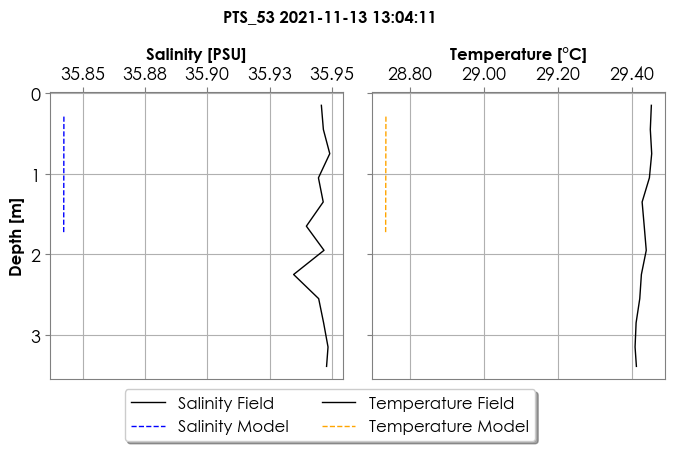

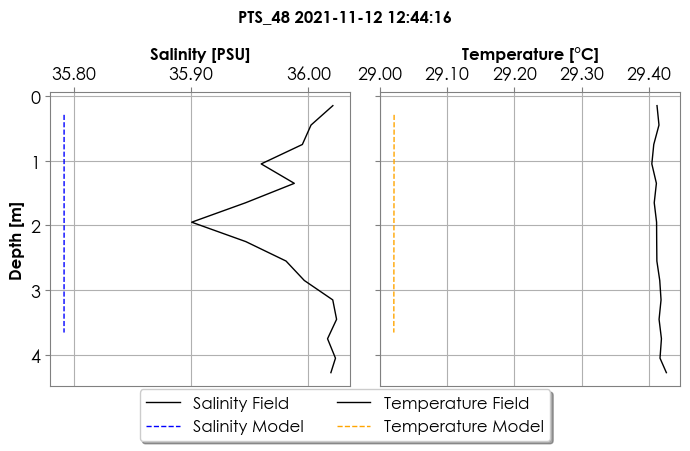

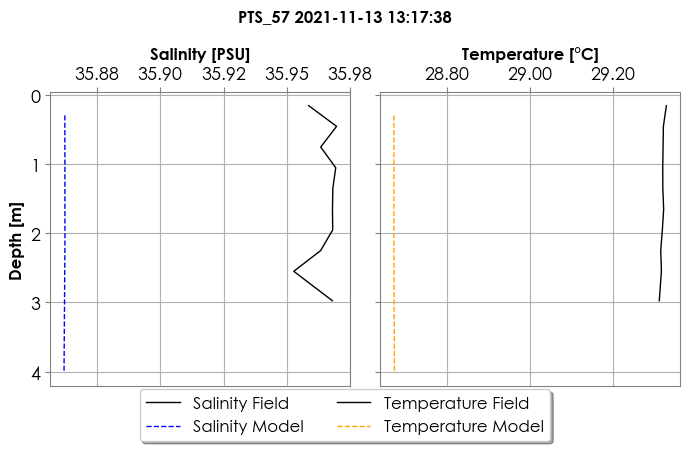

...

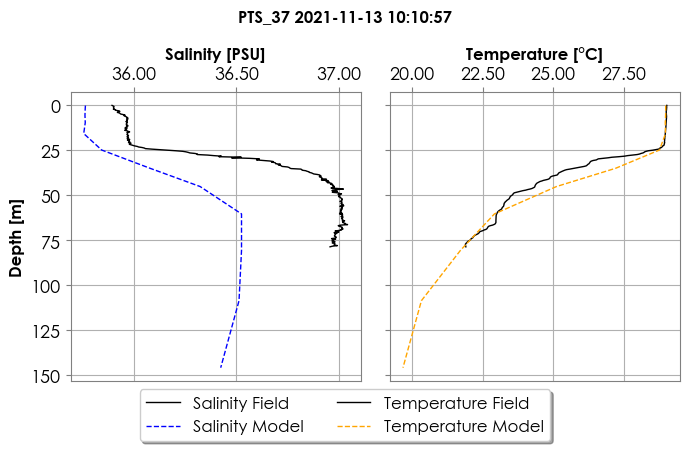

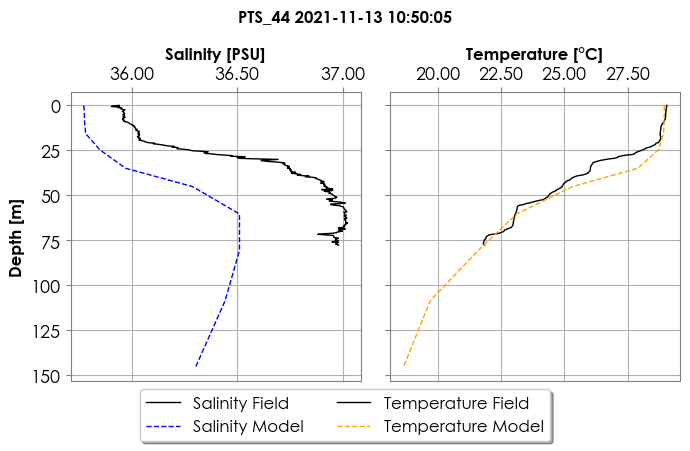

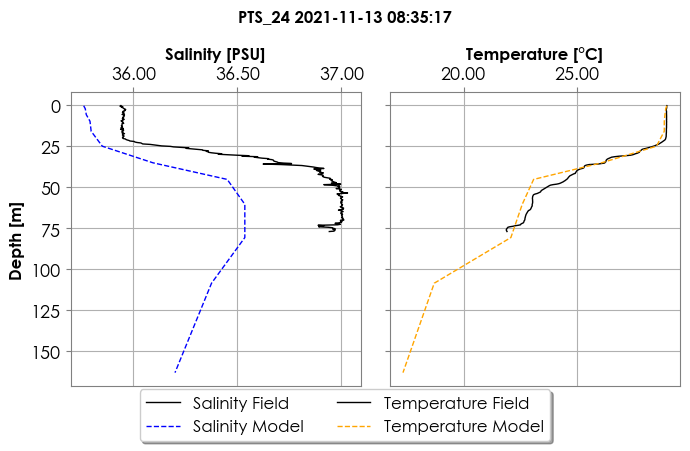

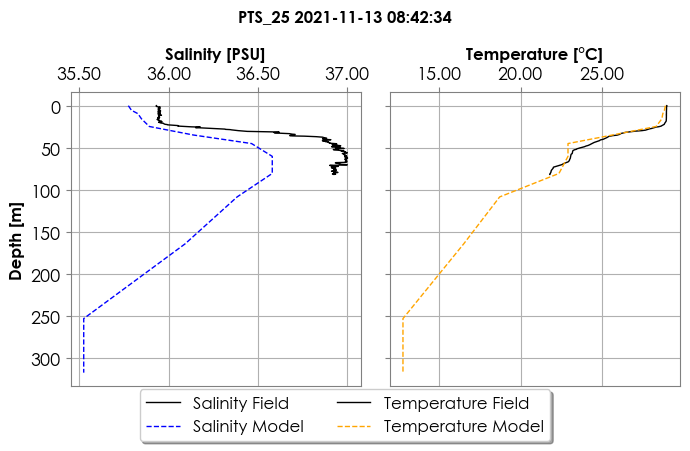

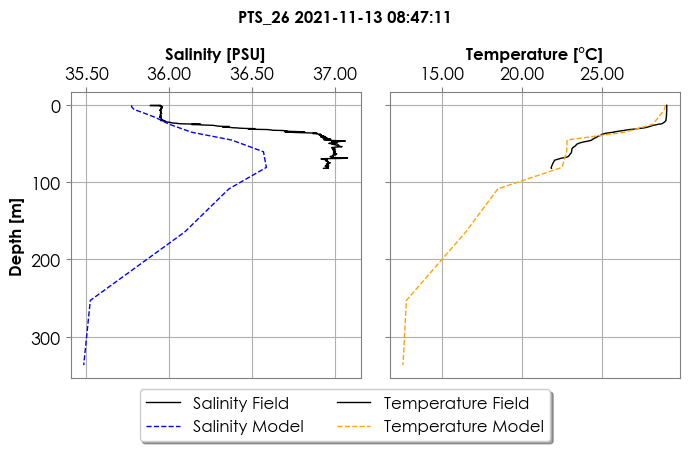

In [ ]:

# Grficos de cada perfil en cada punto
keys_list = list(dic_data.keys())

#len(keys_list)
for i in range(0,len(df_idepth)):
    ind_df_field = df_idepth.ind_field.loc[i]
    ind_df_model = df_idepth.ind_model.loc[i]
    fig, axs = plt.subplots(1,2,figsize=(7,4), sharey = True)
    ax = axs[0]
    color_ = 'k'
    color_m = 'blue'
    p2 = ax.plot(dic_data[ind_df_field].Sal.values,dic_data[ind_df_field].Depth.values,lw=1,ls ='-',color = color_, label = 'Salinity Field')
    p2 = ax.plot(dic_model_TS[ind_df_model].Sal.values,dic_model_TS[ind_df_model].Depth.values,lw=1,ls ='--',color = color_m, label = 'Salinity Model')
    ax.xaxis.tick_top()
    ax.invert_yaxis()
    ax.tick_params(axis ='x')
    ax.xaxis.set_label_position('top') 
    ax.set_ylabel('Depth [m]',size=12,fontweight = 'bold')
    ax.set_xlabel('Salinity [PSU]',size=12,fontweight = 'bold')
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax)

#------------FIGURA 2----------------------

    ax2 = axs[1]
    color_ = 'k'
    color_m = 'orange'
    p2 = ax2.plot(dic_data[ind_df_field].Temp.values,dic_data[ind_df_field].Depth.values,lw=1,ls ='-',color = color_, label = 'Temperature Field')
    p2 = ax2.plot(dic_model_TS[ind_df_model].Temp.values,dic_model_TS[ind_df_model].Depth.values,lw=1,ls ='--',color = color_m, label = 'Temperature Model')
    ax2.xaxis.tick_top()
    ax2.tick_params(axis ='x')
    ax2.xaxis.set_label_position('top') 
    ax2.set_xlabel('Temperature [°C]',size=12,fontweight = 'bold')
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    fig_params(ax2)

    _= fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.05),
          fancybox=True, shadow=True, ncol=2, fontsize = 12)

    fig.suptitle(ind_df_field, size = 12,fontweight = 'bold')
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.subplots_adjust(hspace=0.1)

# Prueba WAVES

In [17]:
path = r"C:\Users\paula\Desktop\VALIDACION\TEST4"
df_barrera = pd.read_csv(path+'//significant_wave_height_barrera.csv', sep = ',', names = ['time', 'Hs'], header=0)
df_barrera['time'] = pd.to_datetime(df_barrera['time'], format="%Y-%m-%d %H:%M:%S")
df_barrera.set_index(df_barrera['time'].values, inplace = True)
df_barrera


path = r"C:\Users\paula\Desktop\VALIDACION\TEST5"
df_barrera_2 = pd.read_csv(path+'//significant_wave_height_barrera.csv', sep = ',', names = ['time', 'Hs'], header=0)
df_barrera_2['time'] = pd.to_datetime(df_barrera_2['time'], format="%Y-%m-%d %H:%M:%S")
df_barrera_2.set_index(df_barrera_2['time'].values, inplace = True)
df_barrera_2


path = r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\VALIDACION\TEST4_3D"
df_barrera_3 = pd.read_csv(path+'//significant_wave_height_barrera.csv', sep = ',', names = ['time', 'Hs'], header=0)
df_barrera_3['time'] = pd.to_datetime(df_barrera_3['time'], format="%Y-%m-%d %H:%M:%S")
df_barrera_3.set_index(df_barrera_3['time'].values, inplace = True)
df_barrera_3


path = r"C:\Users\paula\Desktop\VALIDACION\TEST6"
df_barrera_4 = pd.read_csv(path+'//significant_wave_height_barrera.csv', sep = ',', names = ['time', 'Hs'], header=0)
df_barrera_4['time'] = pd.to_datetime(df_barrera_4['time'], format="%Y-%m-%d %H:%M:%S")
df_barrera_4.set_index(df_barrera_4['time'].values, inplace = True)
df_barrera_4



,time,Hs
2018-05-01 07:00:00,2018-05-01 07:00:00,0.00000
2018-05-01 08:00:00,2018-05-01 08:00:00,1.27551
2018-05-01 09:00:00,2018-05-01 09:00:00,1.25401
2018-05-01 10:00:00,2018-05-01 10:00:00,1.28101
2018-05-01 11:00:00,2018-05-01 11:00:00,1.30026
...,...,...
2018-05-10 05:00:00,2018-05-10 05:00:00,1.04000
2018-05-10 06:00:00,2018-05-10 06:00:00,1.05200
2018-05-10 07:00:00,2018-05-10 07:00:00,1.06400
2018-05-10 08:00:00,2018-05-10 08:00:00,1.07300


In [18]:
path = r"C:\Users\paula\Desktop\VALIDACION\TEST4"
df_lagoon = pd.read_csv(path+'//significant_wave_height_lagoon.csv', sep = ',', names = ['time', 'Hs'], header=0)
df_lagoon['time'] = pd.to_datetime(df_lagoon['time'], format="%Y-%m-%d %H:%M:%S")
df_lagoon.set_index(df_lagoon['time'].values, inplace = True)
df_lagoon


path = r"C:\Users\paula\Desktop\VALIDACION\TEST5"
df_lagoon_2 = pd.read_csv(path+'//significant_wave_height_lagoon.csv', sep = ',', names = ['time', 'Hs'], header=0)
df_lagoon_2['time'] = pd.to_datetime(df_lagoon_2['time'], format="%Y-%m-%d %H:%M:%S")
df_lagoon_2.set_index(df_lagoon_2['time'].values, inplace = True)
df_lagoon_2


path = r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\VALIDACION\TEST4_3D"
df_lagoon_3 = pd.read_csv(path+'//significant_wave_height_lagoon.csv', sep = ',', names = ['time', 'Hs'], header=0)
df_lagoon_3['time'] = pd.to_datetime(df_lagoon_3['time'], format="%Y-%m-%d %H:%M:%S")
df_lagoon_3.set_index(df_lagoon_3['time'].values, inplace = True)
df_lagoon_3


path = r"C:\Users\paula\Desktop\VALIDACION\TEST6"
df_lagoon_4 = pd.read_csv(path+'//significant_wave_height_lagoon.csv', sep = ',', names = ['time', 'Hs'], header=0)
df_lagoon_4['time'] = pd.to_datetime(df_lagoon_4['time'], format="%Y-%m-%d %H:%M:%S")
df_lagoon_4.set_index(df_lagoon_4['time'].values, inplace = True)
df_lagoon_4

,time,Hs
2018-05-01 07:00:00,2018-05-01 07:00:00,0.000000
2018-05-01 08:00:00,2018-05-01 08:00:00,0.493498
2018-05-01 09:00:00,2018-05-01 09:00:00,0.523550
2018-05-01 10:00:00,2018-05-01 10:00:00,0.527224
2018-05-01 11:00:00,2018-05-01 11:00:00,0.533649
...,...,...
2018-05-10 05:00:00,2018-05-10 05:00:00,0.592381
2018-05-10 06:00:00,2018-05-10 06:00:00,0.584956
2018-05-10 07:00:00,2018-05-10 07:00:00,0.579180
2018-05-10 08:00:00,2018-05-10 08:00:00,0.571705


In [19]:
df_wave_aw600_model = df_barrera
df_wave_aw1000_model = df_lagoon

# index_intersection 
df_field_model_aw600 = pd.merge(df_wave_aw600_field, df_wave_aw600_model, on = 'time').set_index('time')
df_field_model_aw1000 = pd.merge(df_wave_aw1000_field, df_wave_aw1000_model, on = 'time').set_index('time')

df_wave_aw600_model_2 = df_barrera_2
df_wave_aw1000_model_2 = df_lagoon_2

df_field_model_aw600_2 = pd.merge(df_wave_aw600_field, df_wave_aw600_model_2, on = 'time').set_index('time')
df_field_model_aw1000_2 = pd.merge(df_wave_aw1000_field, df_wave_aw1000_model_2, on = 'time').set_index('time')

In [20]:
df_wave_aw600_model_3 = df_barrera_3
df_wave_aw1000_model_3 = df_lagoon_3

df_field_model_aw600_3 = pd.merge(df_wave_aw600_field, df_wave_aw600_model_3, on = 'time').set_index('time')
df_field_model_aw1000_3 = pd.merge(df_wave_aw1000_field, df_wave_aw1000_model_3, on = 'time').set_index('time')


df_wave_aw600_model_4 = df_barrera_4
df_wave_aw1000_model_4 = df_lagoon_4

df_field_model_aw600_4 = pd.merge(df_wave_aw600_field, df_wave_aw600_model_4, on = 'time').set_index('time')
df_field_model_aw1000_4 = pd.merge(df_wave_aw1000_field, df_wave_aw1000_model_4, on = 'time').set_index('time')

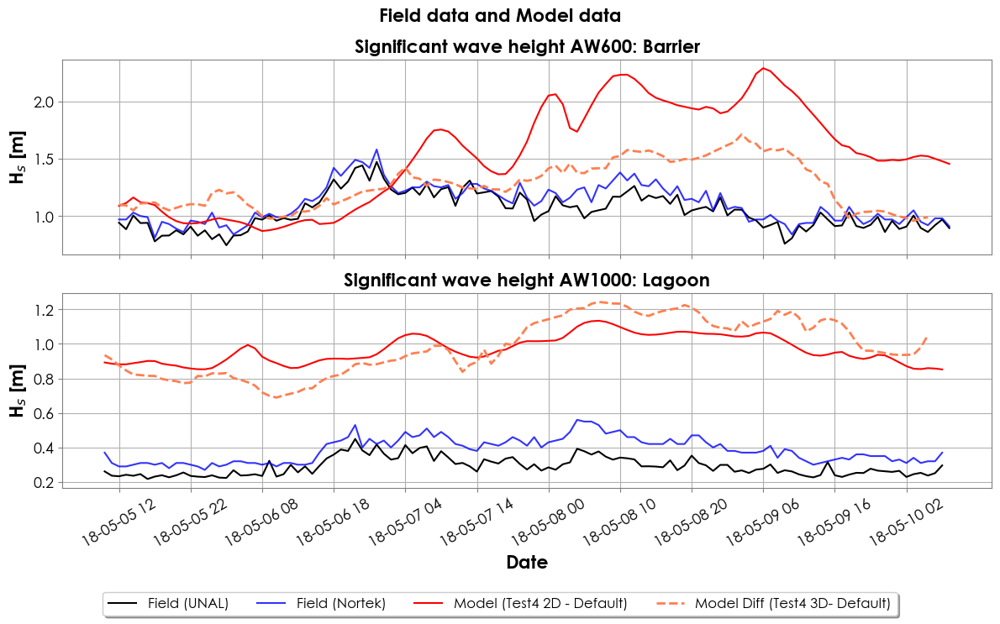

In [25]:
# Model data 
fig, axs = plt.subplots(2,1, figsize =(12,7), sharex = True)
ax = axs[0]
ticklabels = df_field_model_aw600.index[::10]
ax.plot(df_field_model_aw600['Hs_x'], label ='Field (UNAL)', color = 'k' )
ax.plot(df_nortek_aw600['Hs'],label = 'Field (Nortek)',color = 'blue', alpha = 0.8)
ax.plot(df_field_model_aw600['Hs_y'], label = 'Model (Test4 2D - Default)', color = 'red', alpha = 1)
# ax.plot(df_field_model_aw600_2['Hs_y'], label = 'Model Diff (Test5 2D Breaking)', color = 'green', alpha = 1)
ax.plot(df_field_model_aw600_3['Hs_y'], label = 'Model Diff (Test4 3D- Default)', color = 'coral', ls = '--', lw = 2)
# ax.plot(df_field_model_aw600_4['Hs_y'], label = 'Model Diff (Test6 2D Friction)', color = 'purple', ls = '--', lw = 2)

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('H$_s$ [m]',size=16,fontweight = 'bold')
ax.set_title('Significant wave height AW600: Barrier',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
ax1.plot(df_field_model_aw1000['Hs_x'],color = 'k' )
ax1.plot(df_nortek_aw1000['Hs'],color = 'blue', alpha = 0.8)
ax1.plot(df_field_model_aw1000['Hs_y'],color = 'red', alpha = 1)
# ax1.plot(df_field_model_aw1000_2['Hs_y'],color = 'green', alpha = 1)
ax1.plot(df_field_model_aw1000_3['Hs_y'],color = 'coral', ls = '--', lw = 2, alpha = 1)
# ax1.plot(df_field_model_aw1000_4['Hs_y'],color = 'purple', ls = '--', lw = 2, alpha = 1)



# ax1.plot(df_field_model_aw1000_V1['Hs_y'],color = 'blue', alpha = 0.8)
ax1.set_ylabel ('H$_s$ [m]',size=16,fontweight = 'bold')
ax1.set_xlabel ('Date',size=16,fontweight = 'bold')
ax1.set_title('Significant wave height AW1000: Lagoon',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)


fig.suptitle("Field data and Model data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.001),fancybox=True, shadow=True, ncol=4, fontsize = 12)
plt.xticks(rotation=30)
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)

In [33]:
path = r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\VALIDACION\SWAN_TEST04_VALIDACION"
custom_date_parser = lambda x: datetime.datetime.strptime(x, "%Y%m%d.%H%M%S")
df_barrera_m100 = pd.read_csv(path+'//timeseries_Barerra.out', sep ='\s+', header=7, usecols=[0,4,6,7], names= ['time', 'Hs', 'Tp', 'Mdir'],
            parse_dates=['time'],
             date_parser=custom_date_parser)
df_barrera_m100.set_index('time', inplace=True)

df_lagoon_m100 = pd.read_csv(path+'//timeseries_Lagoon.out', sep ='\s+', header=7, usecols=[0,4,6,7], names= ['time', 'Hs', 'Tp', 'Mdir'],
            parse_dates=['time'],
             date_parser=custom_date_parser)
df_lagoon_m100.set_index('time', inplace=True)

In [34]:
path = r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\VALIDACION\SWAN_TEST04_VALIDACION\SWAN_NEST_50m"
custom_date_parser = lambda x: datetime.datetime.strptime(x, "%Y%m%d.%H%M%S")
df_barrera_m50 = pd.read_csv(path+'//timeseries_Barerra.out', sep ='\s+', header=7, usecols=[0,4,6,7], names= ['time', 'Hs', 'Tp', 'Mdir'],
            parse_dates=['time'],
             date_parser=custom_date_parser)
df_barrera_m50.set_index('time', inplace=True)

df_lagoon_m50 = pd.read_csv(path+'//timeseries_Lagoon.out', sep ='\s+', header=7, usecols=[0,4,6,7], names= ['time', 'Hs', 'Tp', 'Mdir'],
            parse_dates=['time'],
             date_parser=custom_date_parser)
df_lagoon_m50.set_index('time', inplace=True)

In [35]:
path = r"G:\My Drive\TESIS_MAESTRIA_PAULAE\MODELO_NUMERICO\VALIDACION\SWAN_TEST03_VALIDACION"
custom_date_parser = lambda x: datetime.datetime.strptime(x, "%Y%m%d.%H%M%S")
df_barrera_m200 = pd.read_csv(path+'//timeseries_Barerra.out', sep ='\s+', header=7, usecols=[0,4,6,7], names= ['time', 'Hs', 'Tp', 'Mdir'],
            parse_dates=['time'],
             date_parser=custom_date_parser)
df_barrera_m200.set_index('time', inplace=True)

df_lagoon_m200 = pd.read_csv(path+'//timeseries_Lagoon.out', sep ='\s+', header=7, usecols=[0,4,6,7], names= ['time', 'Hs', 'Tp', 'Mdir'],
            parse_dates=['time'],
             date_parser=custom_date_parser)
df_lagoon_m200.set_index('time', inplace=True)

In [36]:
# path = r'C:\Users\paula\Desktop\SWAN_TEST02_VALIDACION\SWAN_NEST'
# custom_date_parser = lambda x: datetime.datetime.strptime(x, "%Y%m%d.%H%M%S")
# df_barrera_m100 = pd.read_csv(path+'//timeseries_Barerra.out', sep ='\s+', header=7, usecols=[0,4,6,7], names= ['time', 'Hs', 'Tp', 'Mdir'],
#             parse_dates=['time'],
#              date_parser=custom_date_parser)
# df_barrera_m100.set_index('time', inplace=True)

# df_lagoon_m100 = pd.read_csv(path+'//timeseries_Lagoon.out', sep ='\s+', header=7, usecols=[0,4,6,7], names= ['time', 'Hs', 'Tp', 'Mdir'],
#             parse_dates=['time'],
#              date_parser=custom_date_parser)
# df_lagoon_m100.set_index('time', inplace=True)

In [37]:
df_wave_aw600_model_50m = df_barrera_m50
df_wave_aw600_model_50m['time'] = df_wave_aw600_model_50m.index
# df_wave_aw600_model_50m = df_wave_aw600_model_50m[1:]
# df_wave_aw600_model_50m['Mdir'] = df_wave_aw600_model_50m['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))
df_wave_aw600_model_50m = df_wave_aw600_model_50m.reset_index(drop=True)

df_wave_aw1000_model_50m = df_lagoon_m50
df_wave_aw1000_model_50m['time'] = df_wave_aw1000_model_50m.index
# df_wave_aw1000_model_50m = df_wave_aw1000_model_50m[1:]
# df_wave_aw1000_model_50m['Mdir'] = df_wave_aw1000_model_50m['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))
df_wave_aw1000_model_50m = df_wave_aw1000_model_50m.reset_index(drop=True)


# ____________________Merge entre los datos de campo y del modelo___________________
# try: 
#     df_wave_aw600_field.insert(2, 'Mdir', df_nortek_aw600['Mdir'])
#     df_wave_aw1000_field.insert(2, 'Mdir', df_nortek_aw1000['Mdir'])
# except:
#     pass
df_wave_aw600_field.reset_index(drop=True, inplace=True)
df_wave_aw1000_field.reset_index(drop=True, inplace=True)

df_field_model_aw600_50m = pd.merge(df_wave_aw600_field, df_wave_aw600_model_50m, on = 'time').set_index('time')
df_field_model_aw1000_50m = pd.merge(df_wave_aw1000_field, df_wave_aw1000_model_50m, on = 'time').set_index('time')

In [38]:
df_wave_aw600_model_100m = df_barrera_m100
df_wave_aw600_model_100m['time'] = df_wave_aw600_model_100m.index
# df_wave_aw600_model_100m = df_wave_aw600_model_100m[1:]
# df_wave_aw600_model_100m['Mdir'] = df_wave_aw600_model_100m['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))
df_wave_aw600_model_100m = df_wave_aw600_model_100m.reset_index(drop=True)

df_wave_aw1000_model_100m = df_lagoon_m100
df_wave_aw1000_model_100m['time'] = df_wave_aw1000_model_100m.index
# df_wave_aw1000_model_100m = df_wave_aw1000_model_100m[1:]
# df_wave_aw1000_model_100m['Mdir'] = df_wave_aw1000_model_100m['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))
df_wave_aw1000_model_100m = df_wave_aw1000_model_100m.reset_index(drop=True)


# ____________________Merge entre los datos de campo y del modelo___________________
# try: 
#     df_wave_aw600_field.insert(2, 'Mdir', df_nortek_aw600['Mdir'])
#     df_wave_aw1000_field.insert(2, 'Mdir', df_nortek_aw1000['Mdir'])
# except:
#     pass
df_wave_aw600_field.reset_index(drop=True, inplace=True)
df_wave_aw1000_field.reset_index(drop=True, inplace=True)

df_field_model_aw600_100m = pd.merge(df_wave_aw600_field, df_wave_aw600_model_100m, on = 'time').set_index('time')
df_field_model_aw1000_100m = pd.merge(df_wave_aw1000_field, df_wave_aw1000_model_100m, on = 'time').set_index('time')

In [39]:
df_wave_aw600_model_200m = df_barrera_m200
df_wave_aw600_model_200m['time'] = df_wave_aw600_model_200m.index
# df_wave_aw600_model_200m = df_wave_aw600_model_200m[1:]
# df_wave_aw600_model_200m['Mdir'] = df_wave_aw600_model_200m['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))
df_wave_aw600_model_200m = df_wave_aw600_model_200m.reset_index(drop=True)

df_wave_aw1000_model_200m = df_lagoon_m200
df_wave_aw1000_model_200m['time'] = df_wave_aw1000_model_200m.index
# df_wave_aw1000_model_200m = df_wave_aw1000_model_200m[1:]
# df_wave_aw1000_model_200m['Mdir'] = df_wave_aw1000_model_200m['Mdir'].apply(lambda x: deg_compas(x = x, num_secciones= 16, delta=22.5))
df_wave_aw1000_model_200m = df_wave_aw1000_model_200m.reset_index(drop=True)


# ____________________Merge entre los datos de campo y del modelo___________________
# try: 
#     df_wave_aw600_field.insert(2, 'Mdir', df_nortek_aw600['Mdir'])
#     df_wave_aw1000_field.insert(2, 'Mdir', df_nortek_aw1000['Mdir'])
# except:
#     pass
df_wave_aw600_field.reset_index(drop=True, inplace=True)
df_wave_aw1000_field.reset_index(drop=True, inplace=True)

df_field_model_aw600_200m = pd.merge(df_wave_aw600_field, df_wave_aw600_model_200m, on = 'time').set_index('time')
df_field_model_aw1000_200m = pd.merge(df_wave_aw1000_field, df_wave_aw1000_model_200m, on = 'time').set_index('time')

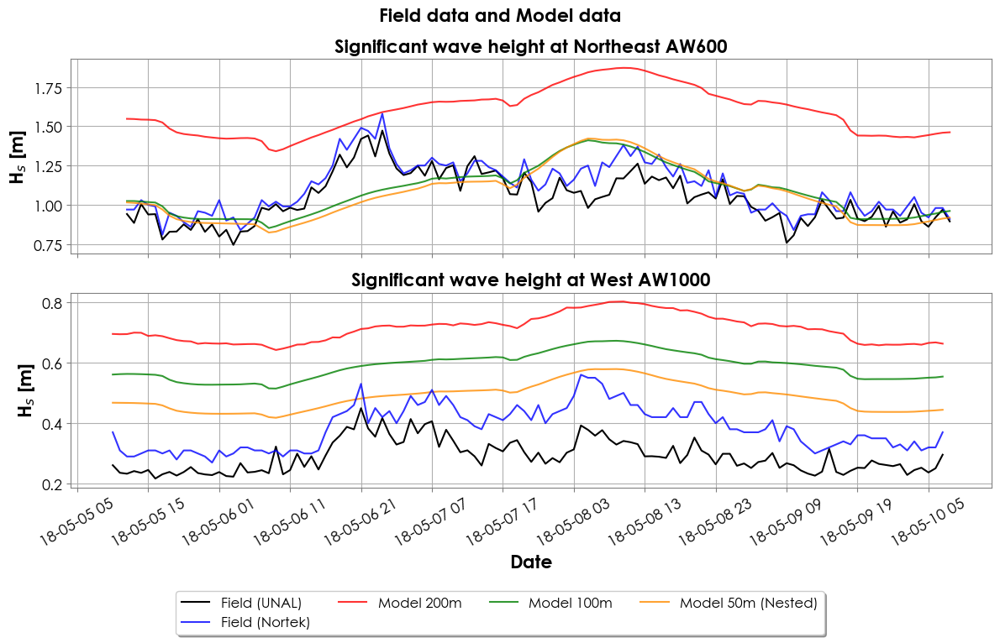

In [41]:
# Model data 
fig, axs = plt.subplots(2,1, figsize =(12,7), sharex = True)
ax = axs[0]
# ticklabels = df_field_model_aw600.index[::10]
ticklabels = df_barrera_m100.index[::10]

ax.plot(df_field_model_aw600_200m['Hs_x'], label ='Field (UNAL)', color = 'k' )
ax.plot(df_nortek_aw600['Hs'],label = 'Field (Nortek)',color = 'blue', alpha = 0.8)
ax.plot(df_field_model_aw600_200m['Hs_y'], label = 'Model 200m', color = 'red', alpha = 0.8)
ax.plot(df_field_model_aw600_100m['Hs_y'], label = 'Model 100m', color = 'g', alpha = 0.8)
ax.plot(df_field_model_aw600_50m['Hs_y'], label = 'Model 50m (Nested)', color = 'darkorange', alpha = 0.8)
# ax.plot(df_barrera_m200['Hs'][5:], label = 'Model 200m', color = 'red', alpha = 0.8)
# ax.plot(df_barrera_m100['Hs'][5:], label = 'Model 100m', color = 'red', alpha = 0.8)

# ax.plot(df_field_model_aw600_V1['Hs_y'], label = 'Model Diff', color = 'blue', alpha = 0.8)

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('H$_s$ [m]',size=16,fontweight = 'bold')
ax.set_title('Significant wave height at Northeast AW600',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
ax1.plot(df_field_model_aw1000_200m['Hs_x'],color = 'k' )
ax1.plot(df_field_model_aw1000_200m['Hs_y'],color = 'red', alpha = 0.8)
ax1.plot(df_field_model_aw1000_100m['Hs_y'],color = 'g', alpha = 0.8)
ax1.plot(df_field_model_aw1000_50m['Hs_y'], color = 'darkorange', alpha = 0.8)
# ax1.plot(df_lagoon['Hs'][5:],color = 'red', alpha = 0.8)
ax1.plot(df_nortek_aw1000['Hs'],color = 'blue', alpha = 0.8)

# ax1.plot(df_field_model_aw1000_V1['Hs_y'],color = 'blue', alpha = 0.8)
ax1.set_ylabel ('H$_s$ [m]',size=16,fontweight = 'bold')
ax1.set_xlabel ('Date',size=16,fontweight = 'bold')
ax1.set_title('Significant wave height at West AW1000',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)


fig.suptitle("Field data and Model data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.001),fancybox=True, shadow=True, ncol=4, fontsize = 12)
plt.xticks(rotation=30)
fig.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)

# Prueba WATER LEVEL

In [36]:

df_barrera_model = pd.read_csv(r"C:\Users\paula\Desktop\VALIDACION\TEST3\water_level_barrera.csv", sep = ',')
df_barrera_model['date and time'] = pd.to_datetime(df_barrera_model['date and time'], format="%Y-%m-%d %H:%M:%S")
df_barrera_model.set_index(df_barrera_model['date and time'].values, inplace = True)
df_barrera_model

,date and time,water level (m)
2018-05-01 07:00:00,2018-05-01 07:00:00,0.000000
2018-05-01 08:00:00,2018-05-01 08:00:00,-0.069711
2018-05-01 09:00:00,2018-05-01 09:00:00,-0.096688
2018-05-01 10:00:00,2018-05-01 10:00:00,-0.101825
2018-05-01 11:00:00,2018-05-01 11:00:00,-0.093232
...,...,...
2018-05-10 05:00:00,2018-05-10 05:00:00,0.061857
2018-05-10 06:00:00,2018-05-10 06:00:00,0.078709
2018-05-10 07:00:00,2018-05-10 07:00:00,0.092320
2018-05-10 08:00:00,2018-05-10 08:00:00,0.094766


In [37]:
df_barrera_model['waterlevel'] = df_barrera_model['water level (m)']

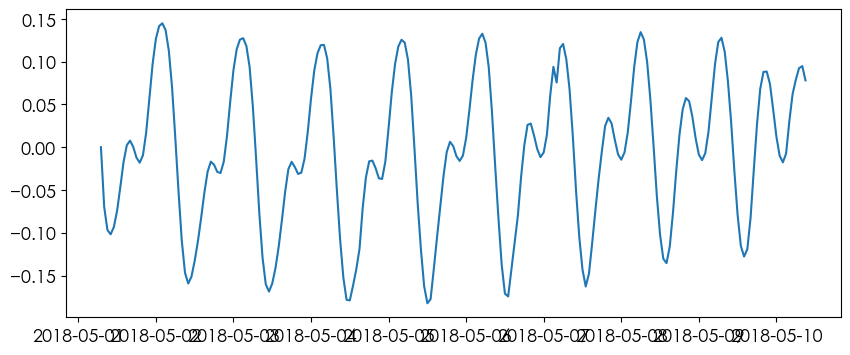

In [38]:
plt.figure(figsize=(10,4))
plt.plot(df_barrera_model['waterlevel'])

In [39]:
df_lagoon_model = pd.read_csv(r"C:\Users\paula\Desktop\VALIDACION\TEST3\water_level_lagoon.csv", sep = ',')
df_lagoon_model['date and time'] = pd.to_datetime(df_lagoon_model['date and time'], format="%Y-%m-%d %H:%M:%S")
df_lagoon_model.set_index(df_lagoon_model['date and time'], inplace=True)
df_lagoon_model

,date and time,water level (m)
date and time,,
2018-05-01 07:00:00,2018-05-01 07:00:00,0.000000
2018-05-01 08:00:00,2018-05-01 08:00:00,-0.026656
2018-05-01 09:00:00,2018-05-01 09:00:00,-0.072375
2018-05-01 10:00:00,2018-05-01 10:00:00,-0.066319
2018-05-01 11:00:00,2018-05-01 11:00:00,-0.054136
...,...,...
2018-05-10 05:00:00,2018-05-10 05:00:00,0.074672
2018-05-10 06:00:00,2018-05-10 06:00:00,0.102153
2018-05-10 07:00:00,2018-05-10 07:00:00,0.119862


In [40]:
df_lagoon_model['waterlevel'] = df_lagoon_model['water level (m)']

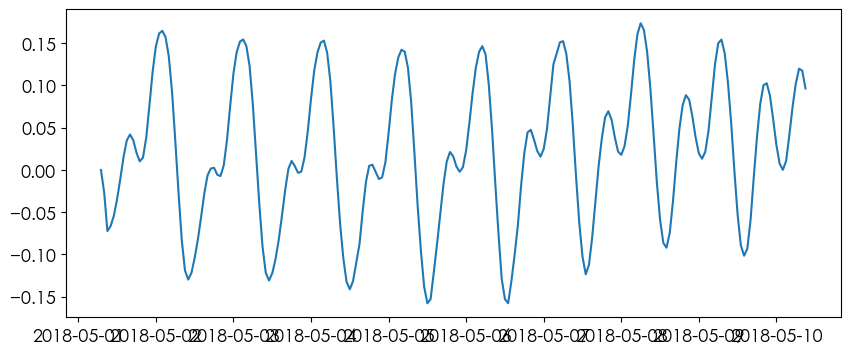

In [41]:
plt.figure(figsize=(10,4))
plt.plot(df_lagoon_model['waterlevel'])

In [42]:
df_wl_ne_model = df_barrera_model
df_wl_w_model = df_lagoon_model


# Tide descomposition
# Tomar las horas que coiniciden entre campo y modelo
df_field_model_northeast =df_wl_ne_model.loc[df_barrier.index.intersection(df_wl_ne_model.index)]
df_field_model_northeast['waterlevel'] = df_field_model_northeast['waterlevel']

df_field_model_west =df_wl_w_model.loc[df_lagoon.index.intersection(df_wl_w_model.index)]
df_field_model_west['waterlevel'] = df_field_model_west['waterlevel']

df_field_model_northeast = marea_descomp(df_field_model_northeast)
df_field_model_northeast['time'] = df_field_model_northeast.index

df_field_model_west = marea_descomp(df_field_model_west)
df_field_model_west['time'] = df_field_model_west.index

# Match between model data and field data
df_field_model_northeast= pd.merge(df_barrier,df_field_model_northeast, on = 'time' ).set_index('time')
df_field_model_west= pd.merge(df_lagoon,df_field_model_west, on = 'time' ).set_index('time')

In [43]:
df_field_model_northeast.head(3)

,waterlevel_x,astro_tide_x,meteo_tide_x,date and time,water level (m),waterlevel_y,astro_tide_y,meteo_tide_y
time,,,,,,,,
2018-05-05 12:00:00,-0.166403,-0.169402,0.002998,2018-05-05 12:00:00,-0.182387,-0.182387,-0.179901,-0.002486
2018-05-05 13:00:00,-0.171403,-0.168580,-0.002824,2018-05-05 13:00:00,-0.177582,-0.177582,-0.179045,0.001463
2018-05-05 14:00:00,-0.143403,-0.141327,-0.002077,2018-05-05 14:00:00,-0.141983,-0.141983,-0.144376,0.002393


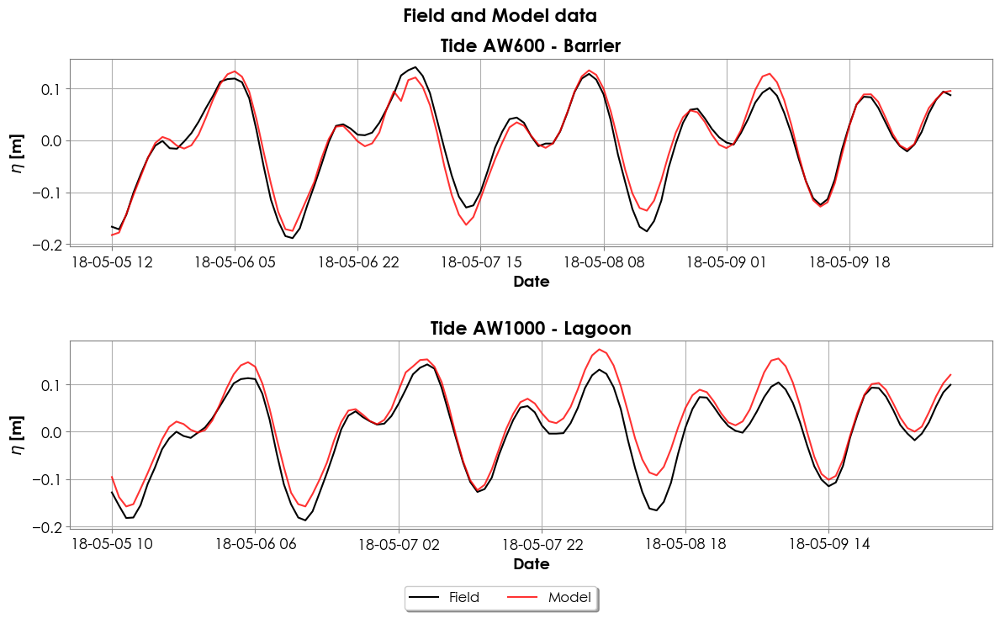

In [44]:
fig, axs = plt.subplots(2,1, figsize =(12,7))
ax = axs[0]
ticklabels = df_field_model_northeast.index[::17] # Vector of times
ax.plot(df_field_model_northeast['waterlevel_x'], label ='Field', color = 'k' )
ax.plot(df_field_model_northeast['waterlevel_y'], label = 'Model', color = 'red', alpha = 0.8)

ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('$\eta$ [m]',size=14,fontweight ='bold')
ax.set_xlabel ('Date',size=14,fontweight ='bold')
fig_params(ax)
ax.set_title('Tide AW600 - Barrier',size = 16,fontweight ='bold')   # Subtítulo de la figura

ax1 = axs[1]
ticklabels = df_field_model_west.index[::20]
ax1.plot(df_field_model_west['waterlevel_x'], color = 'k' )
ax1.plot(df_field_model_west['waterlevel_y'], color = 'red', alpha = 0.8)

ax1.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax1.xaxis.set_major_formatter(date_format)
ax1.set_ylabel ('$\eta$ [m]',size=14,fontweight ='bold')
ax1.set_xlabel ('Date',size=14,fontweight = 'bold')
fig_params(ax1)
ax1.set_title('Tide AW1000 - Lagoon',size = 16,fontweight ='bold')   # Subtítulo de la figura

fig.suptitle("Field and Model data", size = 16,fontweight ='bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01),fancybox=True, shadow=True, ncol=4, fontsize = 12)
# plt.xticks(rotation=30);
fig.tight_layout()
plt.subplots_adjust(wspace=0.6)
plt.subplots_adjust(hspace=0.5)

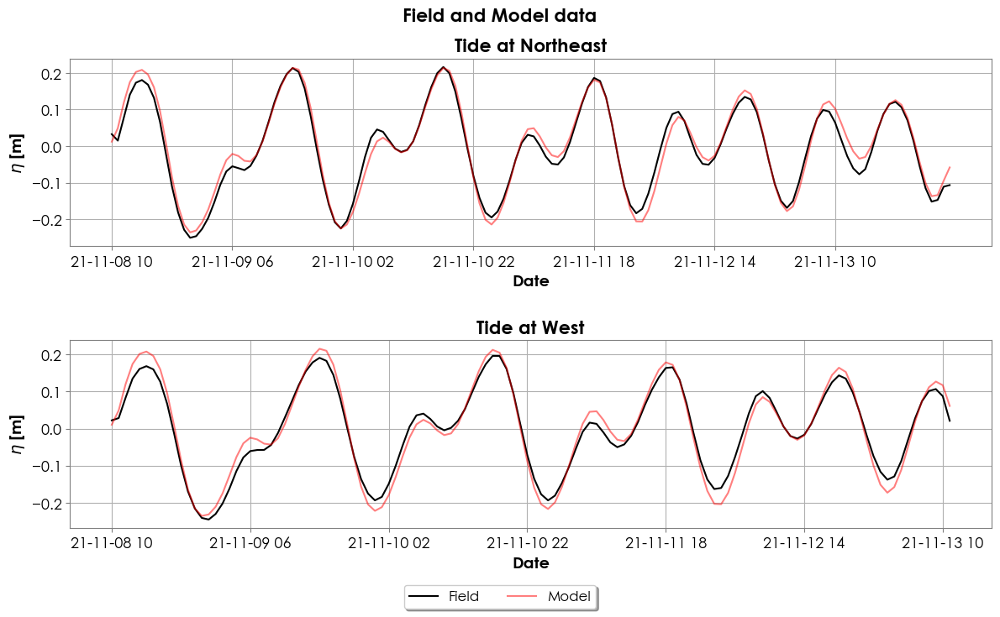

In [ ]:
fig, axs = plt.subplots(2,1, figsize =(12,7))
ax = axs[0]
ticklabels = df_field_model_northeast.index[::20] # Vector of times
ax.plot(df_field_model_northeast['astro_tide_x'], label ='Field', color = 'k' )
ax.plot(df_field_model_northeast['astro_tide_y'], label = 'Model', color = 'red', alpha = 0.5)
ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('$\eta$ [m]',size=14,fontweight = 'bold')
ax.set_xlabel ('Date',size=14,fontweight = 'bold')
ax.set_title('Tide at Northeast',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax)

ax1 = axs[1]
ticklabels = df_field_model_west.index[::20]
ax1.plot(df_field_model_west['astro_tide_x'], color = 'k' )
ax1.plot(df_field_model_west['astro_tide_y'], color = 'red', alpha = 0.5)
ax1.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax1.xaxis.set_major_formatter(date_format)
ax1.set_ylabel ('$\eta$ [m]',size=14,fontweight = 'bold')
ax1.set_xlabel ('Date',size=14,fontweight = 'bold')
ax1.set_title('Tide at West',size = 16,fontweight = 'bold')   # Subtítulo de la figura
fig_params(ax1)

fig.suptitle("Field and Model data", size = 16,fontweight = 'bold')     # Titulo de la figura
fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01), fancybox=True, shadow=True, ncol=4, fontsize = 12)
# plt.xticks(rotation=30);
fig.tight_layout()
plt.subplots_adjust(wspace=0.6)
plt.subplots_adjust(hspace=0.5)

In [ ]:
df_data = df_wd.copy()
prueba = df_data['waterlevel']
prueba.index = prueba.index + timedelta(hours=4)

df_data2 = df_lagoon.copy()
prueba2 = df_data2['waterlevel']
prueba2.index = prueba2.index - timedelta(hours = 9)

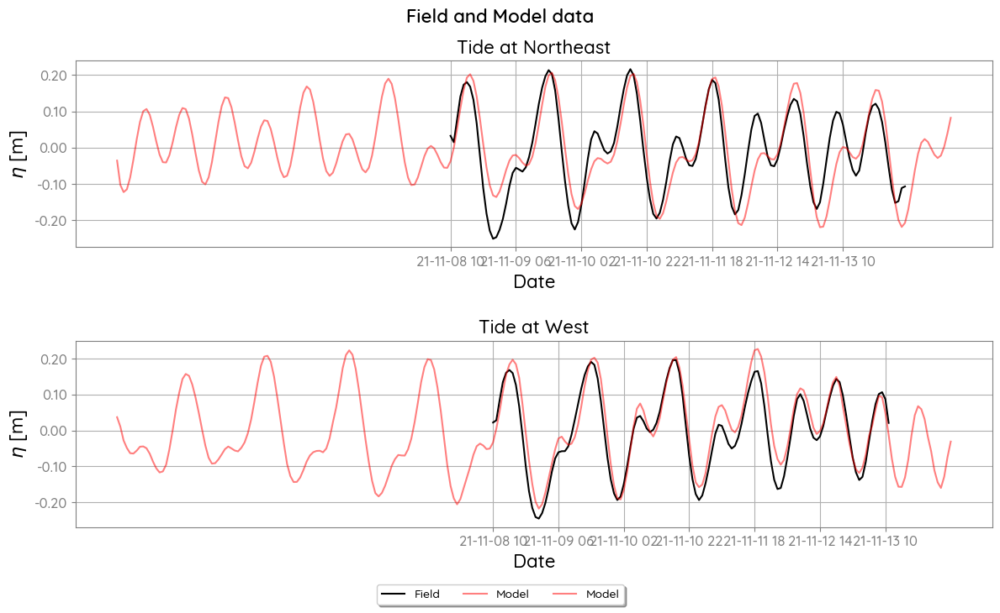

In [ ]:
fig, axs = plt.subplots(2,1, figsize =(12,7))
ax = axs[0]
ticklabels = df_field_model_northeast.index[::20] # Vector of times
ax.plot(df_field_model_northeast['astro_tide_x'], label ='Field', color = 'k' )
# ax.plot(df_field_model_northeast['astro_tide_y'], label = 'Model', color = 'red', alpha = 0.5)
ax.plot(prueba, label = 'Model', color = 'red', alpha = 0.5)


ax.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax.xaxis.set_major_formatter(date_format)
ax.set_ylabel ('$\eta$ [m]',size=16,fontproperties=prop1)
ax.set_xlabel ('Date',size=16,fontproperties=prop1)
ax.set_yticklabels(ax.get_yticks(), fontproperties=prop1,color='gray',size = 12)
ax.spines['left'].set_color('gray')
ax.spines['right'].set_color('gray')
ax.spines['bottom'].set_color('gray')
ax.spines['top'].set_color('gray')
ax.tick_params('y', colors='tab:gray')
ax.tick_params('x', colors='tab:gray')
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.set_title('Tide at Northeast',size = 16,fontproperties=prop1)   # Subtítulo de la figura
ax.grid()
for label in ax.get_xticklabels():
    label.set_fontproperties(prop1)
    label.set_color('gray')
    label.set_size(12)




ax1 = axs[1]
ticklabels = df_field_model_west.index[::20]
ax1.plot(df_field_model_west['astro_tide_x'], color = 'k' )
# ax1.plot(df_field_model_west['astro_tide_y'], color = 'red', alpha = 0.5)
ax1.plot(prueba2, label = 'Model', color = 'red', alpha = 0.5)


ax1.set_xticks(ticklabels)
date_format = mdates.DateFormatter('%y-%m-%d %H')
ax1.xaxis.set_major_formatter(date_format)
ax1.set_ylabel ('$\eta$ [m]',size=16,fontproperties=prop1)
ax1.set_xlabel ('Date',size=16,fontproperties=prop1)
ax1.set_yticklabels(ax1.get_yticks(), fontproperties=prop1,color='gray',size = 12)
ax1.spines['left'].set_color('gray')
ax1.spines['right'].set_color('gray')
ax1.spines['bottom'].set_color('gray')
ax1.spines['top'].set_color('gray')
ax1.tick_params('y', colors='tab:gray')
ax1.tick_params('x', colors='tab:gray')
ax1.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax1.set_title('Tide at West',size = 16,fontproperties=prop1)   # Subtítulo de la figura
ax1.grid()
for label in ax1.get_xticklabels():
    label.set_fontproperties(prop1)
    label.set_color('gray')
    label.set_size(12)

fig.suptitle("Field and Model data", size = 16,fontproperties=prop2)     # Titulo de la figura

fig.legend(loc='upper center', bbox_to_anchor=(0.5, 0.01),
          fancybox=True, shadow=True, ncol=4, fontsize = 10,prop=prop1)
# plt.xticks(rotation=30);
fig.tight_layout()
plt.subplots_adjust(wspace=0.6)
plt.subplots_adjust(hspace=0.5)


In [ ]:
df_barrier

,waterlevel,astro_tide,meteo_tide,time
2021-11-08 10:00:00,-0.020583,0.032667,-0.053250,2021-11-08 10:00:00
2021-11-08 10:05:00,-0.012108,0.025814,-0.037922,2021-11-08 10:05:00
2021-11-08 10:10:00,-0.020583,0.020117,-0.040700,2021-11-08 10:10:00
2021-11-08 10:15:00,-0.013519,0.015525,-0.029044,2021-11-08 10:15:00
2021-11-08 10:20:00,-0.007876,0.011985,-0.019861,2021-11-08 10:20:00
...,...,...,...,...
2021-11-14 04:40:00,-0.088346,-0.098985,0.010639,2021-11-14 04:40:00
2021-11-14 04:45:00,-0.088346,-0.099808,0.011462,2021-11-14 04:45:00
2021-11-14 04:50:00,-0.071405,-0.101320,0.029914,2021-11-14 04:50:00
2021-11-14 04:55:00,-0.069984,-0.103569,0.033585,2021-11-14 04:55:00


In [ ]:
df_field_model_northeast

,waterlevel_x,astro_tide_x,meteo_tide_x,date and time,water level (m),waterlevel_y,astro_tide_y,meteo_tide_y
time,,,,,,,,
2021-11-08 10:00:00,-0.020583,0.032667,-0.053250,2021-11-08 10:00:00,-0.197234,-0.185266,-0.158386,-0.026880
2021-11-08 11:00:00,0.021773,0.015008,0.006765,2021-11-08 11:00:00,-0.167710,-0.155742,-0.187624,0.031883
2021-11-08 12:00:00,0.082481,0.077427,0.005053,2021-11-08 12:00:00,-0.137574,-0.125606,-0.129086,0.003480
2021-11-08 13:00:00,0.134713,0.140580,-0.005866,2021-11-08 13:00:00,-0.104057,-0.092089,-0.077074,-0.015015
2021-11-08 14:00:00,0.160129,0.173256,-0.013127,2021-11-08 14:00:00,-0.080427,-0.068459,-0.058384,-0.010075
...,...,...,...,...,...,...,...,...
2021-11-14 01:00:00,-0.101044,-0.115133,0.014089,2021-11-14 01:00:00,0.000840,0.012808,-0.006149,0.018957
2021-11-14 02:00:00,-0.147633,-0.151786,0.004154,2021-11-14 02:00:00,0.027468,0.039436,0.030578,0.008859
2021-11-14 03:00:00,-0.147633,-0.147092,-0.000540,2021-11-14 03:00:00,0.055317,0.067286,0.077979,-0.010693


In [ ]:
prueba

time
2021-11-07 20:30:00   -0.158386
2021-11-07 21:30:00   -0.187624
2021-11-07 22:30:00   -0.129086
2021-11-07 23:30:00   -0.077074
2021-11-08 00:30:00   -0.058384
                         ...   
2021-11-13 11:30:00   -0.006149
2021-11-13 12:30:00    0.030578
2021-11-13 13:30:00    0.077979
2021-11-13 14:30:00    0.120757
2021-11-13 15:30:00    0.102517
Name: astro_tide_y, Length: 140, dtype: float64

In [ ]:
df_cove = pd.read_csv(r"C:\Users\paula\Desktop\TEST33\water_level_cove.csv", sep = ',')
df_cove['date and time'] = pd.to_datetime(df_cove['date and time'], format="%Y-%m-%d %H:%M:%S")
df_cove.set_index(df_cove['date and time'], inplace=True)
df_cove

,date and time,water level (m)
date and time,,
2021-11-04 00:00:00,2021-11-04 00:00:00,0.000000
2021-11-04 01:00:00,2021-11-04 01:00:00,-0.026433
2021-11-04 02:00:00,2021-11-04 02:00:00,-0.065062
2021-11-04 03:00:00,2021-11-04 03:00:00,-0.085800
2021-11-04 04:00:00,2021-11-04 04:00:00,-0.100287
...,...,...
2021-11-14 11:00:00,2021-11-14 11:00:00,-0.181419
2021-11-14 12:00:00,2021-11-14 12:00:00,-0.197119
2021-11-14 13:00:00,2021-11-14 13:00:00,-0.165770
